In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import datetime
import matplotlib
import matplotlib.pyplot as plt
from reference import get_file_names, get_histplot, get_coeffs
import seaborn as sns

In [2]:
# get the col reference table
df_ref = pd.read_csv('./vidas_data/cross_ref_cols_tabs.csv')
df_referral = pd.read_csv('./vidas_data/survival_time.csv', parse_dates=['EOH', 'SOH'])
df_mood1 = pd.read_csv('./vidas_data/wH_DirectTable_VISITA_MED_VIDAS.csv', parse_dates=['TimeStamp_Insert'])
df_mood2 = pd.read_csv('./vidas_data/wH_DirectTable_VISITA_OSS_VIDAS.csv', parse_dates=['TimeStamp_Insert'])
df_mood3 = pd.read_csv('./vidas_data/wH_DirectTable_VISITA_INF_VIDAS.csv', parse_dates=['TimeStamp_Insert'])
df_mood1 = df_mood1[['IDEHR', 'EHRType', 'TimeStamp_Insert', 'chk_stato_danimo']].dropna().rename(columns={'chk_stato_danimo': 'mood'})
df_mood2 = df_mood2[['IDEHR', 'EHRType', 'TimeStamp_Insert', 'stato_danimo']].dropna().rename(columns={'stato_danimo': 'mood'})
df_mood3 = df_mood3[['IDEHR', 'EHRType', 'TimeStamp_Insert', 'Stato_animo']].dropna().rename(columns={'Stato_animo': 'mood'})
df_mood = pd.concat([df_mood1, df_mood2, df_mood3])
df_ma = pd.merge(df_mood, df_referral, on=['IDEHR', 'EHRType'], how='outer').dropna().sort_values(by=['IDEHR', 'TimeStamp_Insert'], ascending=[True, True]).reset_index(drop=True)

C:\Users\prate\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (16,17,18,19,20,21,22,50,97,98,100,116,142) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
C:\Users\prate\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (21,22,26,27,28,31,48,51,58,72,82,83,90,93,98,99,116,122) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
C:\Users\prate\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (18,19,20,21,22,23,24,85,162,163,164,165,166,167,168) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df_ma['mood_num'] = df_ma.mood.str.findall('#(\d\d)').to_frame()
df_ma['mood_num'] = df_ma['mood_num'].apply(lambda x: np.nan if not x else [int(i) for i in x])
df_ma = df_ma.drop(columns=['mood', 'EOH', 'Diag_Ref'])
df_ma = df_ma.explode('mood_num')

In [4]:
# convert mood_num to mood_name
def conv_mood_num(df):
    df.loc[df['mood_num'] == 0, 'mood_num'] = 'apathy'
    df.loc[df['mood_num'] == 1, 'mood_num'] = 'withdrawn'
    df.loc[df['mood_num'] == 2, 'mood_num'] = 'delusion'
    df.loc[df['mood_num'] == 3, 'mood_num'] = 'demoralization'
    df.loc[df['mood_num'] == 4, 'mood_num'] = 'despair'
    df.loc[df['mood_num'] == 5, 'mood_num'] = 'irritability'
    df.loc[df['mood_num'] == 6, 'mood_num'] = 'denial'
    df.loc[df['mood_num'] == 7, 'mood_num'] = 'hostility'
    df.loc[df['mood_num'] == 8, 'mood_num'] = 'fear'
    df.loc[df['mood_num'] == 9, 'mood_num'] = 'anger'
    df.loc[df['mood_num'] == 10, 'mood_num'] = 'sense of helplessness'
    df.loc[df['mood_num'] == 11, 'mood_num'] = 'sadness'
    df.loc[df['mood_num'] == 12, 'mood_num'] = 'sense of loneliness'
    df.loc[df['mood_num'] == 13, 'mood_num'] = 'happiness'
    df.loc[df['mood_num'] == 14, 'mood_num'] = 'serenity'

In [5]:
def log_mood_num(df):
    df.loc[df['mood_num'] == 'apathy', 'mood_num'] = 0
    df.loc[df['mood_num'] == 'closure in itself', 'mood_num'] = 10
    df.loc[df['mood_num'] == 'delusion', 'mood_num'] = 20
    df.loc[df['mood_num'] == 'demoralization', 'mood_num'] = 30
    df.loc[df['mood_num'] == 'despair', 'mood_num'] = 40
    df.loc[df['mood_num'] == 'irritability', 'mood_num'] = 100
    df.loc[df['mood_num'] == 'denial', 'mood_num'] = 150
    df.loc[df['mood_num'] == 'hostility', 'mood_num'] = 200
    df.loc[df['mood_num'] == 'fear', 'mood_num'] = 250
    df.loc[df['mood_num'] == 'anger', 'mood_num'] = 300
    df.loc[df['mood_num'] == 'sense of helplessness', 'mood_num'] = 350
    df.loc[df['mood_num'] == 'sadness', 'mood_num'] = 400
    df.loc[df['mood_num'] == 'sense of loneliness', 'mood_num'] = 450
    df.loc[df['mood_num'] == 'happiness', 'mood_num'] = 1000
    df.loc[df['mood_num'] == 'serenity', 'mood_num'] = 1500

In [6]:
conv_mood_num(df_ma)

In [7]:
# get the co-effs of best fit for first and second order poly for a heatmap
def get_coeffs(df_hm, n):
    # correct way
    dft = df_hm.apply(lambda x: np.polyfit(y=x, x=np.linspace(0, n, n+1), deg=1), axis=1)
    dft = dft.to_frame().rename(columns={0: 'deg1 (m)'})
    dft['deg1 (m)'] = dft['deg1 (m)'].apply(lambda x: np.nan if isinstance(x, float) else np.round(x[0], 2))
    dft_2 = df_hm.apply(lambda x: np.polyfit(y=x, x=np.linspace(0, n, n+1), deg=2), axis=1).to_frame().rename(columns={0: 'deg2'})
    dft_2 = dft_2['deg2'].apply(lambda x: np.nan if isinstance(x, float) else x[0:2])
    dft_2 = pd.DataFrame(dft_2.to_list(), columns=['deg2 (x2)', 'deg2 (x1)'], index=dft_2.index)
    dft = pd.concat([dft, dft_2], axis=1)
    dft['deg2 (x2)'] = dft['deg2 (x2)'].apply(lambda x: np.round(x, 2))
    dft['deg2 (x1)'] = dft['deg2 (x1)'].apply(lambda x: np.round(x, 2))
    return pd.concat([df_hm, dft], axis=1)    

In [8]:
# get the no. of days spent in hospice as a column for each IDEHR
df_ma['hos_days'] = pd.to_timedelta(df_ma['TimeStamp_Insert'] - df_ma['SOH']).dt.days
df_ma.astype({'hos_days': 'float32'}).dtypes

IDEHR                          int64
EHRType                       object
TimeStamp_Insert      datetime64[ns]
SOH                   datetime64[ns]
survival_time_days           float64
Diagnosis                     object
mood_num                      object
hos_days                     float32
dtype: object

In [9]:
df_ma['hos_week'] = (pd.to_timedelta(df_ma['TimeStamp_Insert'] - df_ma['SOH']).dt.days) // 7
df_ma.astype({'hos_week': 'int64'}).dtypes

IDEHR                          int64
EHRType                       object
TimeStamp_Insert      datetime64[ns]
SOH                   datetime64[ns]
survival_time_days           float64
Diagnosis                     object
mood_num                      object
hos_days                       int64
hos_week                       int64
dtype: object

In [10]:
# dframe for days spent in hospice
df_ma

,IDEHR,EHRType,TimeStamp_Insert,SOH,survival_time_days,Diagnosis,mood_num,hos_days,hos_week
0,1382,EHR,2015-10-06 11:20:09.030,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,24,3
1,1382,EHR,2015-10-06 13:08:33.307,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,24,3
2,1382,EHR,2015-10-06 17:51:06.480,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
3,1382,EHR,2015-10-07 05:20:13.373,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
4,1382,EHR,2015-10-07 11:12:16.007,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
...,...,...,...,...,...,...,...,...,...
101242,29411,AMB,2020-07-19 12:04:33.460,2020-07-17 13:54:50.597,1.0,Lung,fear,1,0
101243,29440,AMB,2020-07-21 11:27:09.957,2020-07-20 17:23:52.570,2.0,Lung,withdrawn,0,0
101243,29440,AMB,2020-07-21 11:27:09.957,2020-07-20 17:23:52.570,2.0,Lung,demoralization,0,0
101244,29440,AMB,2020-07-23 09:42:34.347,2020-07-20 17:23:52.570,2.0,Lung,withdrawn,2,0


In [11]:
# df_ma.to_csv('./vidas_data/mood_num.csv', index=False)

In [12]:
# weekly mood tabulation
df_mw = df_ma[['IDEHR', 'EHRType', 'survival_time_days', 'Diagnosis', 'mood_num', 'hos_week']].drop_duplicates()
df_mw

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week
0,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,3
5,1382,EHR,45.0,Palliative (Non-Malignant),serenity,3
11,1382,EHR,45.0,Palliative (Non-Malignant),serenity,4
12,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,4
17,1382,EHR,45.0,Palliative (Non-Malignant),apathy,4
...,...,...,...,...,...,...
101240,29399,AMB,5.0,Lung,sense of helplessness,0
101241,29411,AMB,1.0,Lung,fear,0
101241,29411,AMB,1.0,Lung,anger,0
101243,29440,AMB,2.0,Lung,withdrawn,0


In [13]:
# df_mw.to_csv('./vidas_data/hos_week_mood.csv', index=False)

In [14]:
plt.rcParams['figure.figsize'] = [20, 12]
matplotlib.rcParams.update({'font.size': 20})
sns.set(font_scale=1.5)

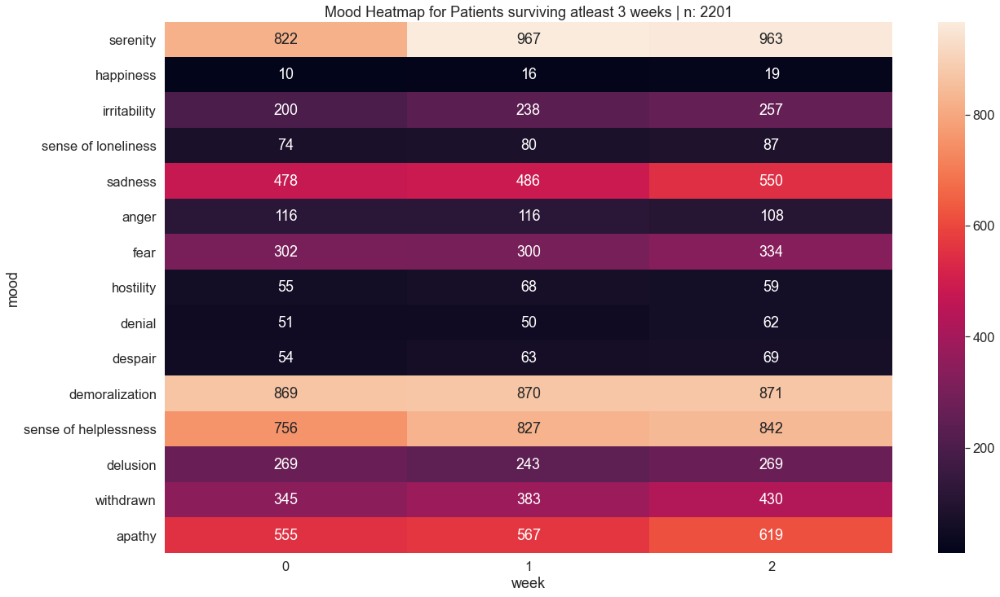

In [15]:
# general heatmaps
df_ms = df_mw[df_mw['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
ax.set_facecolor('xkcd:gray')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving atleast 3 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_3weeks.png', bbox_inches='tight')
plt.show()

In [16]:
get_coeffs(df_hm, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,822,967,963,70.5,-74.5,219.5
happiness,10,16,19,4.5,-1.5,7.5
irritability,200,238,257,28.5,-9.5,47.5
sense of loneliness,74,80,87,6.5,0.5,5.5
sadness,478,486,550,36.0,28.0,-20.0
anger,116,116,108,-4.0,-4.0,4.0
fear,302,300,334,16.0,18.0,-20.0
hostility,55,68,59,2.0,-11.0,24.0
denial,51,50,62,5.5,6.5,-7.5


### Polyfit Testing

In [17]:
# incorrect way
dft = df_hm.apply(lambda x: np.polyfit(x=x, y=np.linspace(0, 2, 3), deg=1), axis=1)
dft = dft.to_frame().rename(columns={0: 'deg 1'})
dft['deg 1'] = dft['deg 1'].apply(lambda x: np.nan if isinstance(x, float) else np.round(x[0], 2))
# dft['deg 2'] = df_hm.apply(np.polyfit, axis=1, args=(np.linspace(0, 2, 3), 2)).to_frame()
# dft['deg 2'] = dft['deg 2'].apply(lambda x: np.nan if isinstance(x, float) else np.round(x[0], 2))
dft

,deg 1
mood_num,
serenity,0.01
happiness,0.21
irritability,0.03
sense of loneliness,0.15
sadness,0.02
anger,-0.19
fear,0.04
hostility,0.05
denial,0.12


In [18]:
# correct way
dft = df_hm.apply(lambda x: np.polyfit(y=x, x=np.linspace(0, 2, 3), deg=1), axis=1)
dft = dft.to_frame().rename(columns={0: 'deg1 (m)'})
dft['deg1 (m)'] = dft['deg1 (m)'].apply(lambda x: np.nan if isinstance(x, float) else np.round(x[0], 2))
dft_2 = df_hm.apply(lambda x: np.polyfit(y=x, x=np.linspace(0, 2, 3), deg=2), axis=1).to_frame().rename(columns={0: 'deg2'})
dft_2 = dft_2['deg2'].apply(lambda x: np.nan if isinstance(x, float) else x[0:2])
dft_2 = pd.DataFrame(dft_2.to_list(), columns=['deg2 (x2)', 'deg2 (x1)'], index=dft_2.index)
dft = pd.concat([dft, dft_2], axis=1)
dft['deg2 (x2)'] = dft['deg2 (x2)'].apply(lambda x: np.round(x, 2))
dft['deg2 (x1)'] = dft['deg2 (x1)'].apply(lambda x: np.round(x, 2))
pd.concat([df_hm, dft], axis=1)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,822,967,963,70.5,-74.5,219.5
happiness,10,16,19,4.5,-1.5,7.5
irritability,200,238,257,28.5,-9.5,47.5
sense of loneliness,74,80,87,6.5,0.5,5.5
sadness,478,486,550,36.0,28.0,-20.0
anger,116,116,108,-4.0,-4.0,4.0
fear,302,300,334,16.0,18.0,-20.0
hostility,55,68,59,2.0,-11.0,24.0
denial,51,50,62,5.5,6.5,-7.5


In [19]:
get_coeffs(df_hm, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,822,967,963,70.5,-74.5,219.5
happiness,10,16,19,4.5,-1.5,7.5
irritability,200,238,257,28.5,-9.5,47.5
sense of loneliness,74,80,87,6.5,0.5,5.5
sadness,478,486,550,36.0,28.0,-20.0
anger,116,116,108,-4.0,-4.0,4.0
fear,302,300,334,16.0,18.0,-20.0
hostility,55,68,59,2.0,-11.0,24.0
denial,51,50,62,5.5,6.5,-7.5


In [20]:
# example
np.polyfit(x=np.linspace(0, 2, 3), y=np.array([70, 90, 110]), deg=1)

array([20., 70.])

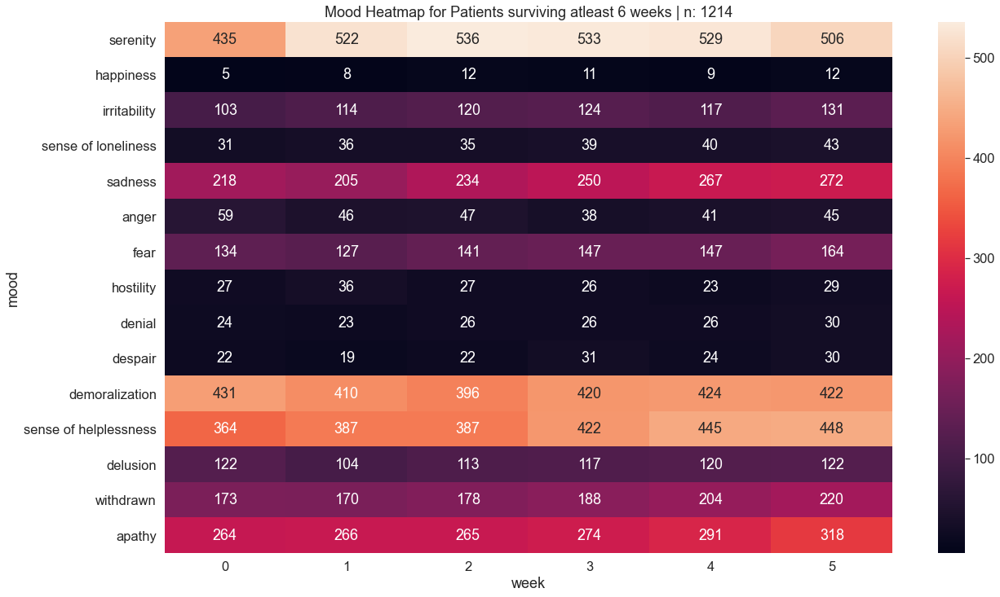

In [21]:
df_ms = df_mw[df_mw['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['hos_week'] <= 5]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
ax.set_facecolor('xkcd:gray')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving atleast 6 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_6weeks.png', bbox_inches='tight')
plt.show()

In [22]:
get_coeffs(df_hm, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,435,522,536,533,529,506,10.66,-11.11,66.19
happiness,5,8,12,11,9,12,1.06,-0.43,3.20
irritability,103,114,120,124,117,131,4.37,-0.66,7.67
sense of loneliness,31,36,35,39,40,43,2.17,-0.04,2.35
sadness,218,205,234,250,267,272,13.49,0.75,9.74
anger,59,46,47,38,41,45,-2.69,1.66,-10.99
fear,134,127,141,147,147,164,6.17,1.14,0.46
hostility,27,36,27,26,23,29,-0.86,0.16,-1.66
denial,24,23,26,26,26,30,1.11,0.23,-0.05


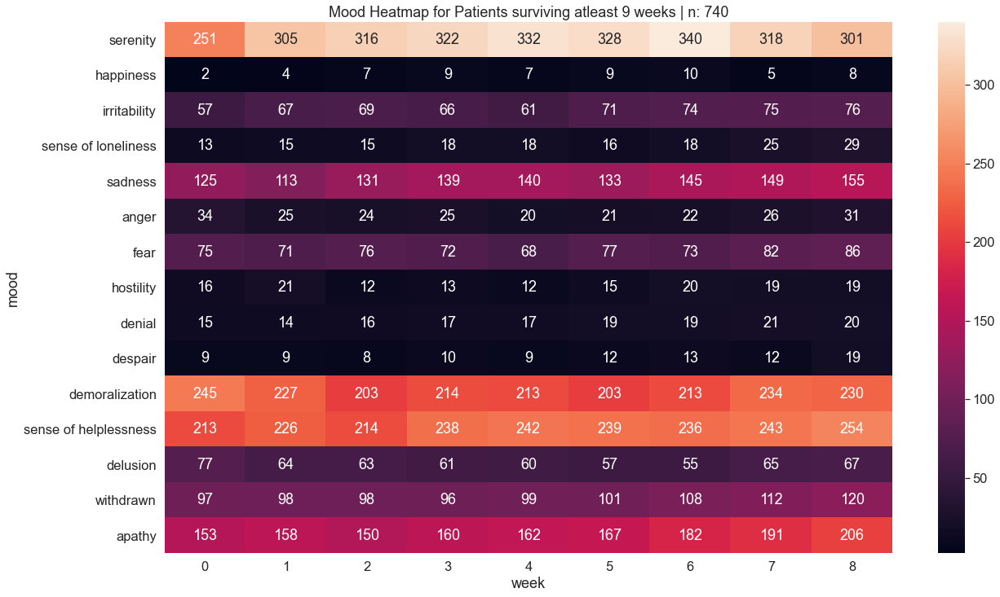

In [23]:
df_ms = df_mw[df_mw['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
ax.set_facecolor('xkcd:gray')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving atleast 9 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_9weeks.png', bbox_inches='tight')
plt.show()

In [24]:
get_coeffs(df_hm, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,251,305,316,322,332,328,340,318,301,4.88,-3.38,31.90
happiness,2,4,7,9,7,9,10,5,8,0.55,-0.26,2.62
irritability,57,67,69,66,61,71,74,75,76,1.92,0.03,1.70
sense of loneliness,13,15,15,18,18,16,18,25,29,1.63,0.27,-0.57
sadness,125,113,131,139,140,133,145,149,155,4.17,0.05,3.80
anger,34,25,24,25,20,21,22,26,31,-0.28,0.68,-5.71
fear,75,71,76,72,68,77,73,82,86,1.27,0.53,-3.01
hostility,16,21,12,13,12,15,20,19,19,0.40,0.31,-2.09
denial,15,14,16,17,17,19,19,21,20,0.82,-0.01,0.88


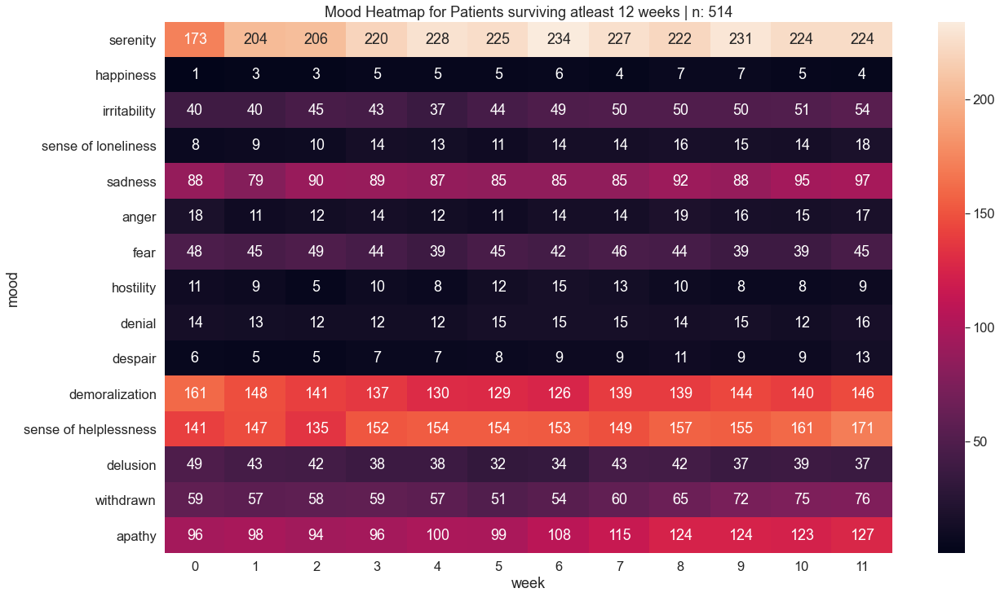

In [25]:
df_ms = df_mw[df_mw['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
ax.set_facecolor('xkcd:gray')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving atleast 12 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_12weeks.png', bbox_inches='tight')
plt.show()

In [26]:
get_coeffs(df_hm, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,173,204,206,220,228,225,234,227,222,231,224,224,3.26,-0.95,13.70
happiness,1,3,3,5,5,5,6,4,7,7,5,4,0.30,-0.09,1.31
irritability,40,40,45,43,37,44,49,50,50,50,51,54,1.28,0.05,0.79
sense of loneliness,8,9,10,14,13,11,14,14,16,15,14,18,0.72,-0.03,1.10
sadness,88,79,90,89,87,85,85,85,92,88,95,97,0.83,0.17,-1.06
anger,18,11,12,14,12,11,14,14,19,16,15,17,0.30,0.10,-0.83
fear,48,45,49,44,39,45,42,46,44,39,39,45,-0.49,0.07,-1.30
hostility,11,9,5,10,8,12,15,13,10,8,8,9,0.03,-0.09,1.01
denial,14,13,12,12,12,15,15,15,14,15,12,16,0.19,0.01,0.11


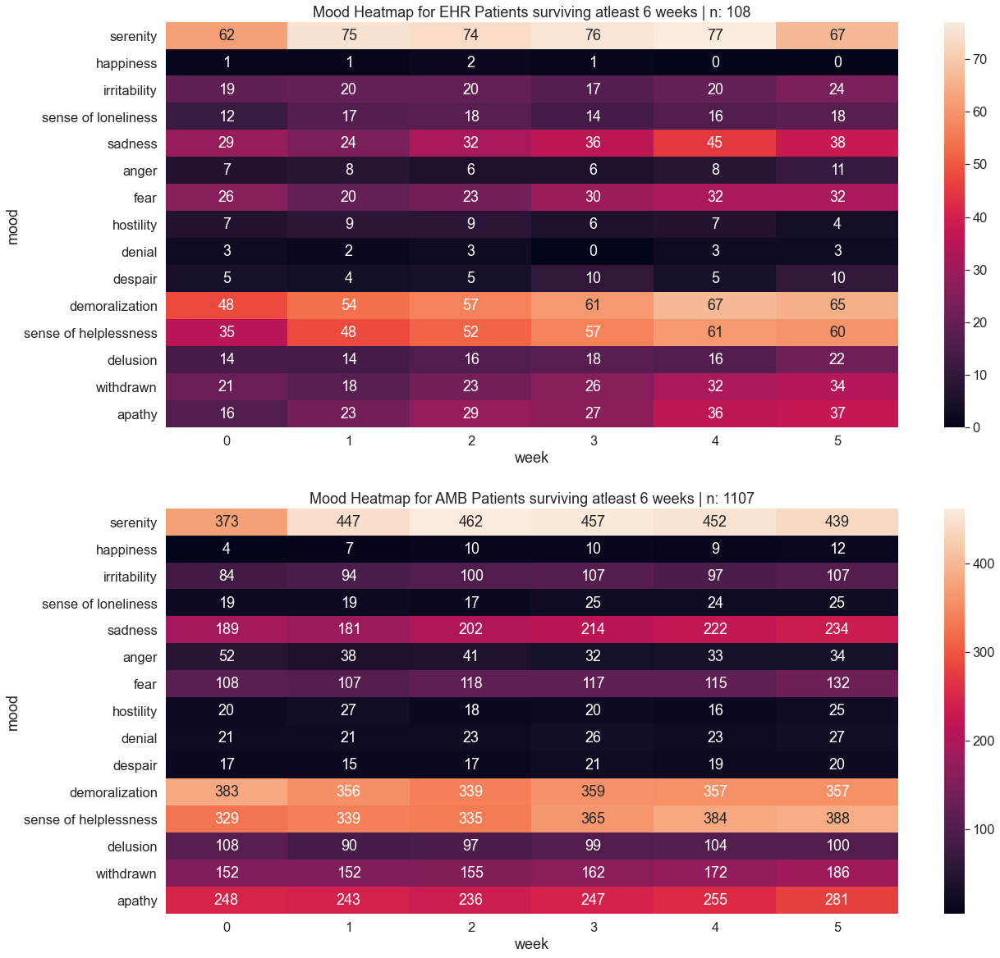

In [27]:
# heatmap of EHR vs AMB patients
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['hos_week'] <= 5]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:gray')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving atleast 6 weeks | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:gray')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving atleast 6 weeks | n: ' + str(n2))
plt.savefig('./graphs/mood/mood_ehrtype_6w.png', bbox_inches='tight')
plt.show()

In [28]:
get_coeffs(df1, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,62.0,75.0,74.0,76.0,77.0,67.0,0.94,-1.91,10.50
happiness,1.0,1.0,2.0,1.0,0.0,0.0,-0.26,-0.14,0.46
irritability,19.0,20.0,20.0,17.0,20.0,24.0,0.63,0.48,-1.78
sense of loneliness,12.0,17.0,18.0,14.0,16.0,18.0,0.66,-0.20,1.64
sadness,29.0,24.0,32.0,36.0,45.0,38.0,3.20,-0.11,3.74
anger,7.0,8.0,6.0,6.0,8.0,11.0,0.57,0.46,-1.75
fear,26.0,20.0,23.0,30.0,32.0,32.0,2.09,0.46,-0.24
hostility,7.0,9.0,9.0,6.0,7.0,4.0,-0.69,-0.37,1.19
denial,3.0,2.0,3.0,0.0,3.0,3.0,-0.00,0.23,-1.16


In [29]:
get_coeffs(df2, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,373,447,462,457,452,439,9.71,-9.20,55.70
happiness,4,7,10,10,9,12,1.31,-0.29,2.74
irritability,84,94,100,107,97,107,3.74,-1.14,9.46
sense of loneliness,19,19,17,25,24,25,1.51,0.16,0.71
sadness,189,181,202,214,222,234,10.29,0.86,6.00
anger,52,38,41,32,33,34,-3.26,1.20,-9.24
fear,108,107,118,117,115,132,4.09,0.68,0.69
hostility,20,27,18,20,16,25,-0.17,0.54,-2.85
denial,21,21,23,26,23,27,1.11,-0.00,1.11


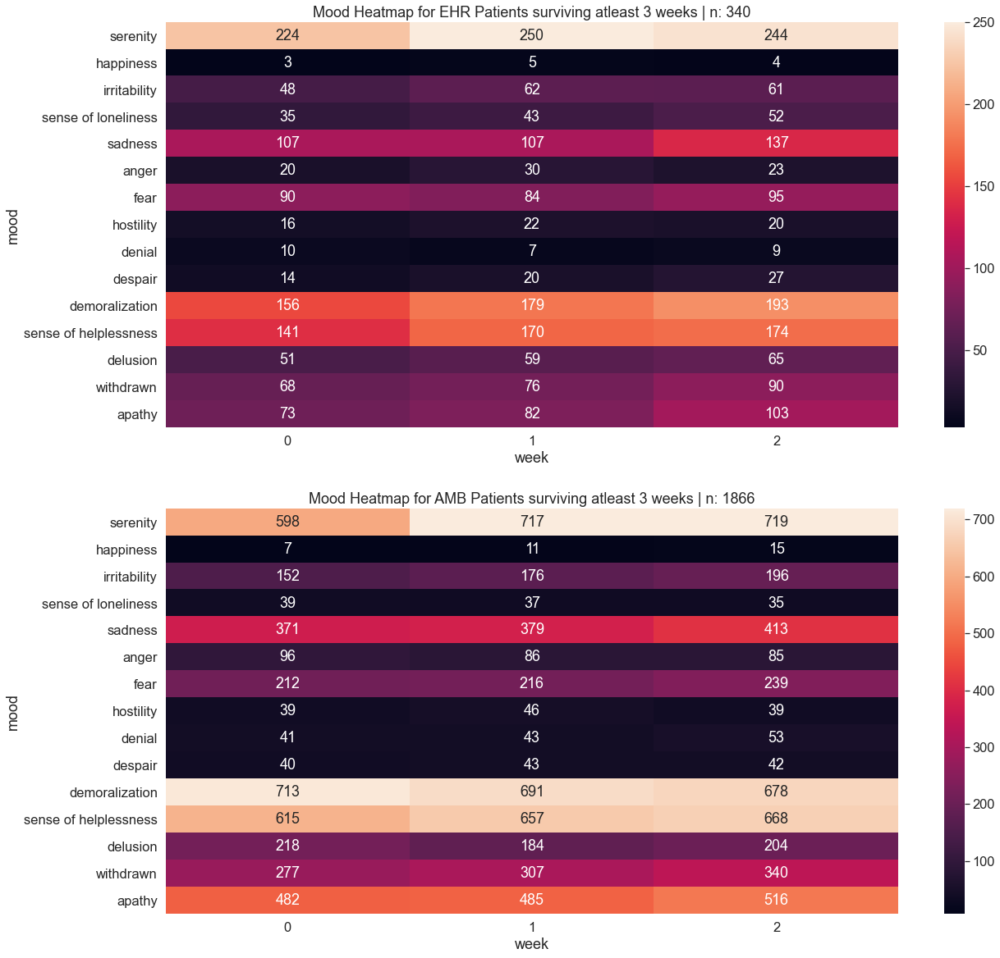

In [30]:
# heatmap of EHR vs AMB patients
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving atleast 3 weeks | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving atleast 3 weeks | n: ' + str(n2))
plt.savefig('./graphs/mood/mood_ehrtype_3w.png', bbox_inches='tight')
plt.show()

In [31]:
get_coeffs(df1, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,224,250,244,10.0,-16.0,42.0
happiness,3,5,4,0.5,-1.5,3.5
irritability,48,62,61,6.5,-7.5,21.5
sense of loneliness,35,43,52,8.5,0.5,7.5
sadness,107,107,137,15.0,15.0,-15.0
anger,20,30,23,1.5,-8.5,18.5
fear,90,84,95,2.5,8.5,-14.5
hostility,16,22,20,2.0,-4.0,10.0
denial,10,7,9,-0.5,2.5,-5.5


In [32]:
get_coeffs(df2, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,598,717,719,60.5,-58.5,177.5
happiness,7,11,15,4.0,-0.0,4.0
irritability,152,176,196,22.0,-2.0,26.0
sense of loneliness,39,37,35,-2.0,-0.0,-2.0
sadness,371,379,413,21.0,13.0,-5.0
anger,96,86,85,-5.5,4.5,-14.5
fear,212,216,239,13.5,9.5,-5.5
hostility,39,46,39,0.0,-7.0,14.0
denial,41,43,53,6.0,4.0,-2.0


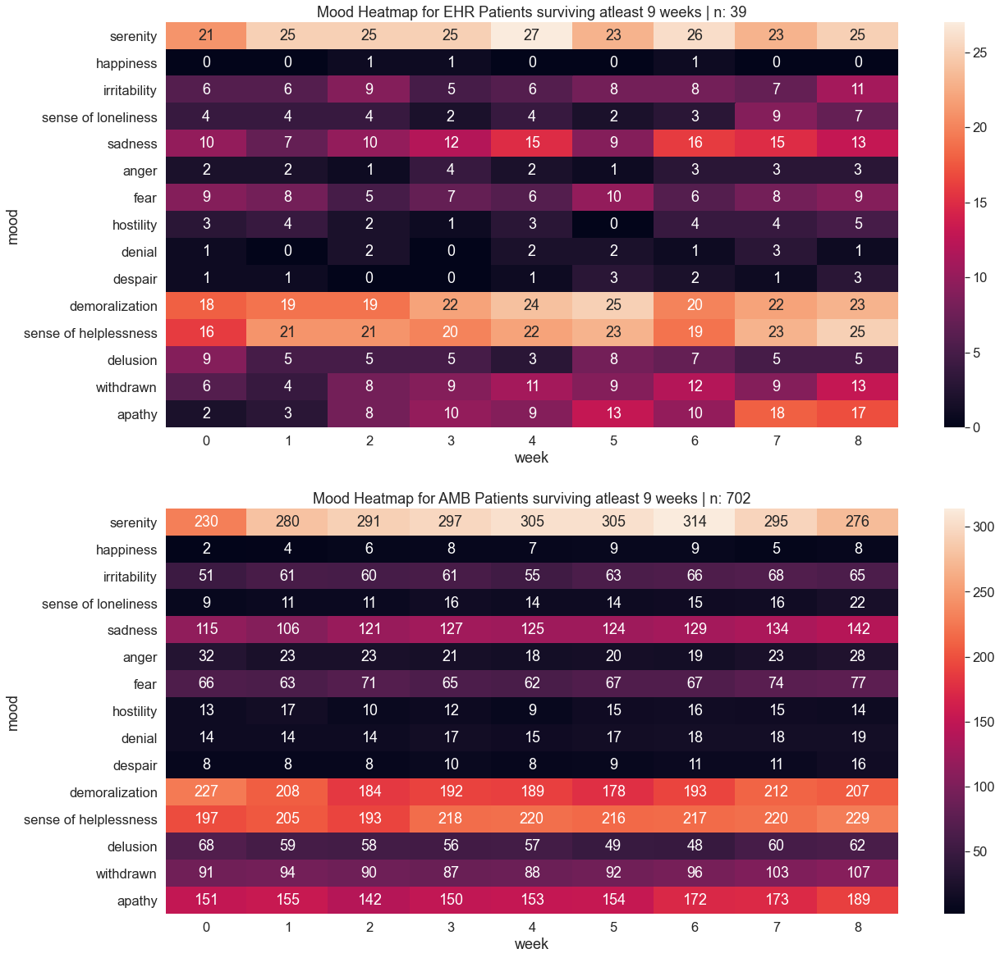

In [33]:
# heatmap of EHR vs AMB patients
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving atleast 9 weeks | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving atleast 9 weeks | n: ' + str(n2))
plt.savefig('./graphs/mood/mood_ehrtype_9w.png', bbox_inches='tight')
plt.show()

In [34]:
get_coeffs(df1, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,21.0,25.0,25.0,25.0,27.0,23.0,26.0,23.0,25.0,0.17,-0.15,1.38
happiness,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.02,-0.04,0.27
irritability,6.0,6.0,9.0,5.0,6.0,8.0,8.0,7.0,11.0,0.40,0.10,-0.38
sense of loneliness,4.0,4.0,4.0,2.0,4.0,2.0,3.0,9.0,7.0,0.42,0.21,-1.27
sadness,10.0,7.0,10.0,12.0,15.0,9.0,16.0,15.0,13.0,0.75,-0.07,1.33
anger,2.0,2.0,1.0,4.0,2.0,1.0,3.0,3.0,3.0,0.13,0.02,-0.02
fear,9.0,8.0,5.0,7.0,6.0,10.0,6.0,8.0,9.0,0.08,0.13,-0.95
hostility,3.0,4.0,2.0,1.0,3.0,0.0,4.0,4.0,5.0,0.18,0.17,-1.16
denial,1.0,0.0,2.0,0.0,2.0,2.0,1.0,3.0,1.0,0.15,-0.02,0.33


In [35]:
get_coeffs(df2, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,230,280,291,297,305,305,314,295,276,4.72,-3.23,30.53
happiness,2,4,6,8,7,9,9,5,8,0.57,-0.22,2.35
irritability,51,61,60,61,55,63,66,68,65,1.52,-0.07,2.08
sense of loneliness,9,11,11,16,14,14,15,16,22,1.22,0.06,0.71
sadness,115,106,121,127,125,124,129,134,142,3.42,0.12,2.47
anger,32,23,23,21,18,20,19,23,28,-0.42,0.66,-5.69
fear,66,63,71,65,62,67,67,74,77,1.18,0.41,-2.06
hostility,13,17,10,12,9,15,16,15,14,0.22,0.14,-0.93
denial,14,14,14,17,15,17,18,18,19,0.67,0.02,0.55


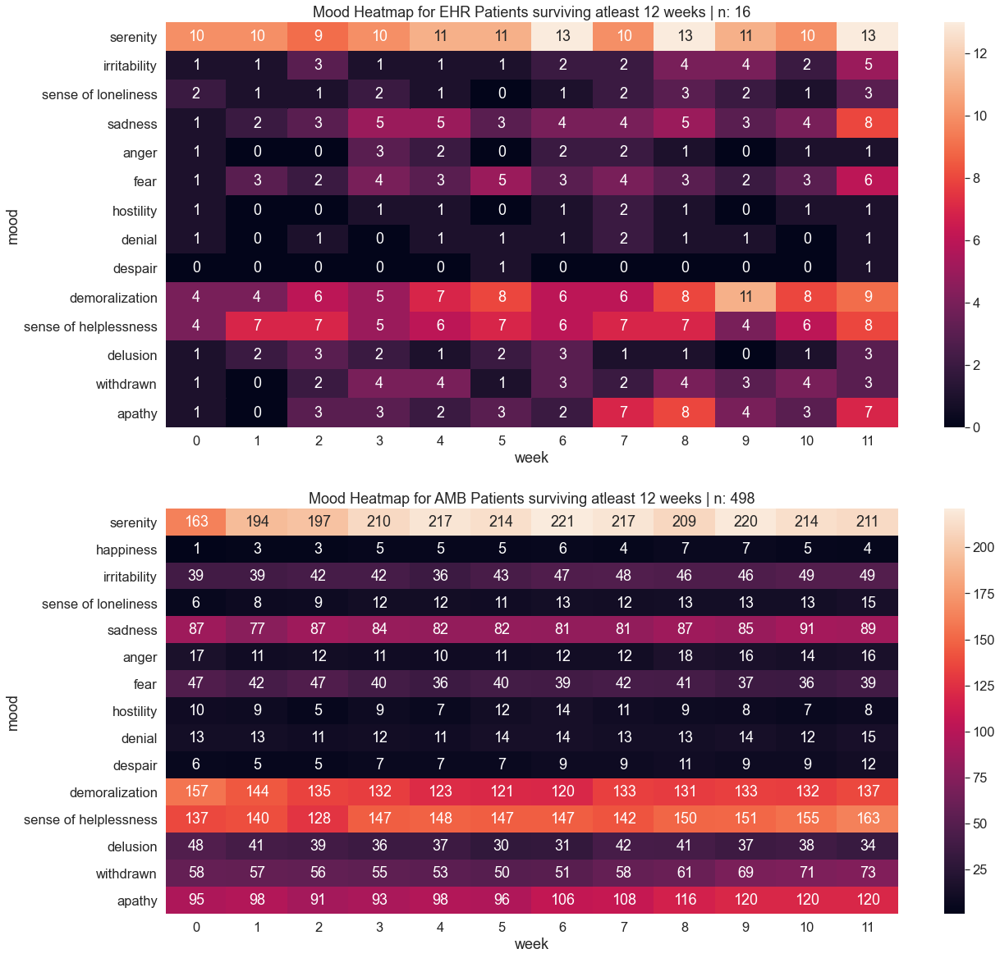

In [36]:
# heatmap of EHR vs AMB patients
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving atleast 12 weeks | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving atleast 12 weeks | n: ' + str(n2))
plt.savefig('./graphs/mood/mood_ehrtype_12w.png', bbox_inches='tight')
plt.show()

In [37]:
get_coeffs(df1, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,10.0,10.0,9.0,10.0,11.0,11.0,13.0,10.0,13.0,11.0,10.0,13.0,0.21,-0.01,0.36
irritability,1.0,1.0,3.0,1.0,1.0,1.0,2.0,2.0,4.0,4.0,2.0,5.0,0.28,0.03,-0.09
sense of loneliness,2.0,1.0,1.0,2.0,1.0,0.0,1.0,2.0,3.0,2.0,1.0,3.0,0.09,0.03,-0.24
sadness,1.0,2.0,3.0,5.0,5.0,3.0,4.0,4.0,5.0,3.0,4.0,8.0,0.33,-0.01,0.39
anger,1.0,0.0,0.0,3.0,2.0,0.0,2.0,2.0,1.0,0.0,1.0,1.0,0.00,-0.03,0.33
fear,1.0,3.0,2.0,4.0,3.0,5.0,3.0,4.0,3.0,2.0,3.0,6.0,0.18,-0.02,0.35
hostility,1.0,0.0,0.0,1.0,1.0,0.0,1.0,2.0,1.0,0.0,1.0,1.0,0.05,-0.01,0.10
denial,1.0,0.0,1.0,0.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,0.03,-0.02,0.20
despair,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.03,0.00,-0.02


In [38]:
get_coeffs(df2, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,163,194,197,210,217,214,221,217,209,220,214,211,3.05,-0.94,13.34
happiness,1,3,3,5,5,5,6,4,7,7,5,4,0.30,-0.09,1.31
irritability,39,39,42,42,36,43,47,48,46,46,49,49,1.01,0.01,0.88
sense of loneliness,6,8,9,12,12,11,13,12,13,13,13,15,0.63,-0.06,1.34
sadness,87,77,87,84,82,82,81,81,87,85,91,89,0.51,0.18,-1.45
anger,17,11,12,11,10,11,12,12,18,16,14,16,0.30,0.13,-1.16
fear,47,42,47,40,36,40,39,42,41,37,36,39,-0.66,0.09,-1.65
hostility,10,9,5,9,7,12,14,11,9,8,7,8,-0.02,-0.08,0.90
denial,13,13,11,12,11,14,14,13,13,14,12,15,0.16,0.02,-0.09


In [39]:
# skyline plot for EHRType
# --scrapped--

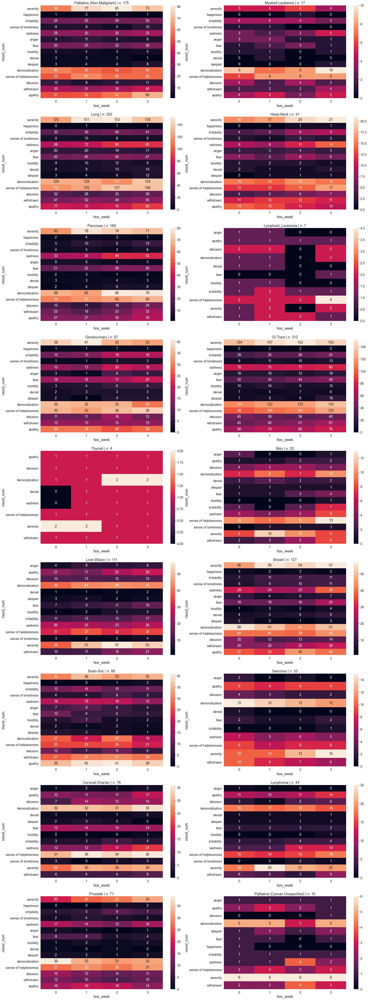

In [40]:
# heatmap for diagnosis type
plt.rcParams['figure.figsize'] = [30, 90]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10), (ax11, ax12), (ax13, ax14), (ax15, ax16), (ax17, ax18)) = plt.subplots(9, 2)
df_ms = df_mw[df_mw['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df1 = df_ms[df_ms['Diagnosis'] == 'Palliative (Non-Malignant)']
df2 = df_ms[df_ms['Diagnosis'] == 'Myeloid Leukemia']
df3 = df_ms[df_ms['Diagnosis'] == 'Lung']
df4 = df_ms[df_ms['Diagnosis'] == 'Head-Neck']
df5 = df_ms[df_ms['Diagnosis'] == 'Pancreas']
df6 = df_ms[df_ms['Diagnosis'] == 'Lymphoid_Leukemia']
df7 = df_ms[df_ms['Diagnosis'] == 'Genitourinary']
df8 = df_ms[df_ms['Diagnosis'] == 'GI Tract']
df9 = df_ms[df_ms['Diagnosis'] == 'Thyroid']
df10 = df_ms[df_ms['Diagnosis'] == 'Skin']
df11= df_ms[df_ms['Diagnosis'] == 'Liver-Biliary']
df12 = df_ms[df_ms['Diagnosis'] == 'Breast']
df13 = df_ms[df_ms['Diagnosis'] == 'Brain-Snc']
df14 = df_ms[df_ms['Diagnosis'] == 'Sarcoma']
df15 = df_ms[df_ms['Diagnosis'] == 'Cervical-Ovarian']
df16 = df_ms[df_ms['Diagnosis'] == 'Lymphoma']
df17 = df_ms[df_ms['Diagnosis'] == 'Prostate']
df18 = df_ms[df_ms['Diagnosis'] == 'Palliative (Cancer-Unspecified)']

n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
n3 = len(df3.IDEHR.unique())
n4 = len(df4.IDEHR.unique())
n5 = len(df5.IDEHR.unique())
n6 = len(df6.IDEHR.unique())
n7 = len(df7.IDEHR.unique())
n8 = len(df8.IDEHR.unique())
n9 = len(df9.IDEHR.unique())
n10 = len(df10.IDEHR.unique())
n11= len(df11.IDEHR.unique())
n12 = len(df12.IDEHR.unique())
n13 = len(df13.IDEHR.unique())
n14 = len(df14.IDEHR.unique())
n15 = len(df15.IDEHR.unique())
n16 = len(df16.IDEHR.unique())
n17 = len(df17.IDEHR.unique())
n18 = len(df18.IDEHR.unique())

df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df3 = df3[['mood_num', 'hos_week']].reset_index(drop=True)
df3 = df3.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df4 = df4[['mood_num', 'hos_week']].reset_index(drop=True)
df4 = df4.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df5 = df5[['mood_num', 'hos_week']].reset_index(drop=True)
df5 = df5.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df6 = df6[['mood_num', 'hos_week']].reset_index(drop=True)
df6 = df6.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df7 = df7[['mood_num', 'hos_week']].reset_index(drop=True)
df7 = df7.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df8 = df8[['mood_num', 'hos_week']].reset_index(drop=True)
df8 = df8.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df9 = df9[['mood_num', 'hos_week']].reset_index(drop=True)
df9 = df9.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df10 = df10[['mood_num', 'hos_week']].reset_index(drop=True)
df10 = df10.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df11 = df11[['mood_num', 'hos_week']].reset_index(drop=True)
df11 = df11.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df12 = df12[['mood_num', 'hos_week']].reset_index(drop=True)
df12 = df12.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df13 = df13[['mood_num', 'hos_week']].reset_index(drop=True)
df13 = df13.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df14 = df14[['mood_num', 'hos_week']].reset_index(drop=True)
df14 = df14.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df15 = df15[['mood_num', 'hos_week']].reset_index(drop=True)
df15 = df15.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df16 = df16[['mood_num', 'hos_week']].reset_index(drop=True)
df16 = df16.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df17 = df17[['mood_num', 'hos_week']].reset_index(drop=True)
df17 = df17.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df18 = df18[['mood_num', 'hos_week']].reset_index(drop=True)
df18 = df18.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()

cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df3['mood_num'] = pd.Categorical(df3['mood_num'], categories=cats, ordered=True)
df4['mood_num'] = pd.Categorical(df4['mood_num'], categories=cats, ordered=True)
df5['mood_num'] = pd.Categorical(df5['mood_num'], categories=cats, ordered=True)
df6['mood_num'] = pd.Categorical(df6['mood_num'], categories=cats, ordered=True)
df7['mood_num'] = pd.Categorical(df7['mood_num'], categories=cats, ordered=True)
df8['mood_num'] = pd.Categorical(df8['mood_num'], categories=cats, ordered=True)
df9['mood_num'] = pd.Categorical(df9['mood_num'], categories=cats, ordered=True)
df10['mood_num'] = pd.Categorical(df10['mood_num'], categories=cats, ordered=True)
df11['mood_num'] = pd.Categorical(df11['mood_num'], categories=cats, ordered=True)
df12['mood_num'] = pd.Categorical(df12['mood_num'], categories=cats, ordered=True)
df13['mood_num'] = pd.Categorical(df13['mood_num'], categories=cats, ordered=True)
df14['mood_num'] = pd.Categorical(df14['mood_num'], categories=cats, ordered=True)
df15['mood_num'] = pd.Categorical(df15['mood_num'], categories=cats, ordered=True)
df16['mood_num'] = pd.Categorical(df16['mood_num'], categories=cats, ordered=True)
df17['mood_num'] = pd.Categorical(df17['mood_num'], categories=cats, ordered=True)
df18['mood_num'] = pd.Categorical(df18['mood_num'], categories=cats, ordered=True)

df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df3 = df3.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df4 = df4.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df5 = df5.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df6 = df6.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df7 = df7.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df8 = df8.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df9 = df9.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df10 = df10.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df11 = df11.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df12 = df12.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df13 = df13.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df14 = df14.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df15 = df15.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df16 = df16.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df17 = df17.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df18 = df18.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)

sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_title('Palliative (Non-Malignant) | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_title('Myeloid Leukemia | n: ' + str(n2))
sns.heatmap(df3, annot=True, fmt='g', ax=ax3)
ax3.set_facecolor('xkcd:black')
ax3.set_title('Lung | n: ' + str(n3))
sns.heatmap(df4, annot=True, fmt='g', ax=ax4)
ax4.set_facecolor('xkcd:black')
ax4.set_title('Head-Neck | n: ' + str(n4))
sns.heatmap(df5, annot=True, fmt='g', ax=ax5)
ax5.set_facecolor('xkcd:black')
ax5.set_title('Pancreas | n: ' + str(n5))
sns.heatmap(df6, annot=True, fmt='g', ax=ax6)
ax6.set_facecolor('xkcd:black')
ax6.set_title('Lymphoid_Leukemia | n: ' + str(n6))
sns.heatmap(df7, annot=True, fmt='g', ax=ax7)
ax7.set_facecolor('xkcd:black')
ax7.set_title('Genitourinary | n: ' + str(n7))
sns.heatmap(df8, annot=True, fmt='g', ax=ax8)
ax8.set_facecolor('xkcd:black')
ax8.set_title('GI Tract | n: ' + str(n8))
sns.heatmap(df9, annot=True, fmt='g', ax=ax9)
ax9.set_facecolor('xkcd:black')
ax9.set_title('Thyroid | n: ' + str(n9))
sns.heatmap(df10, annot=True, fmt='g', ax=ax10)
ax10.set_facecolor('xkcd:black')
ax10.set_title('Skin | n: ' + str(n10))
sns.heatmap(df11, annot=True, fmt='g', ax=ax11)
ax11.set_facecolor('xkcd:black')
ax11.set_title('Liver-Biliary | n: ' + str(n11))
sns.heatmap(df12, annot=True, fmt='g', ax=ax12)
ax12.set_facecolor('xkcd:black')
ax12.set_title('Breast | n: ' + str(n12))
sns.heatmap(df13, annot=True, fmt='g', ax=ax13)
ax13.set_facecolor('xkcd:black')
ax13.set_title('Brain-Snc | n: ' + str(n13))
sns.heatmap(df14, annot=True, fmt='g', ax=ax14)
ax14.set_facecolor('xkcd:black')
ax14.set_title('Sarcoma | n: ' + str(n14))
sns.heatmap(df15, annot=True, fmt='g', ax=ax15)
ax15.set_facecolor('xkcd:black')
ax15.set_title('Cervical-Ovarian | n: ' + str(n15))
sns.heatmap(df16, annot=True, fmt='g', ax=ax16)
ax16.set_facecolor('xkcd:black')
ax16.set_title('Lymphoma | n: ' + str(n16))
sns.heatmap(df17, annot=True, fmt='g', ax=ax17)
ax17.set_facecolor('xkcd:black')
ax17.set_title('Prostate | n: ' + str(n17))
sns.heatmap(df18, annot=True, fmt='g', ax=ax18)
ax18.set_facecolor('xkcd:black')
ax18.set_title('Palliative (Cancer-Unspecified) | n: ' + str(n18))

# fig.suptitle('Mood Heatmap for Patients surviving atleast 6 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_heatmaps_by_diag.png', bbox_inches='tight')
plt.show()

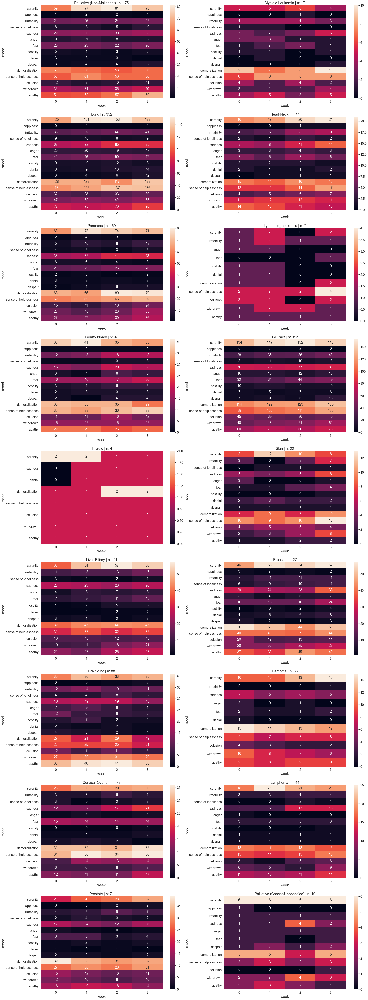

In [41]:
# heatmap for diagnosis type with uniform yticks
plt.rcParams['figure.figsize'] = [30, 90]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10), (ax11, ax12), (ax13, ax14), (ax15, ax16), (ax17, ax18)) = plt.subplots(9, 2)
df_ms = df_mw[df_mw['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df1 = df_ms[df_ms['Diagnosis'] == 'Palliative (Non-Malignant)']
df2 = df_ms[df_ms['Diagnosis'] == 'Myeloid Leukemia']
df3 = df_ms[df_ms['Diagnosis'] == 'Lung']
df4 = df_ms[df_ms['Diagnosis'] == 'Head-Neck']
df5 = df_ms[df_ms['Diagnosis'] == 'Pancreas']
df6 = df_ms[df_ms['Diagnosis'] == 'Lymphoid_Leukemia']
df7 = df_ms[df_ms['Diagnosis'] == 'Genitourinary']
df8 = df_ms[df_ms['Diagnosis'] == 'GI Tract']
df9 = df_ms[df_ms['Diagnosis'] == 'Thyroid']
df10 = df_ms[df_ms['Diagnosis'] == 'Skin']
df11= df_ms[df_ms['Diagnosis'] == 'Liver-Biliary']
df12 = df_ms[df_ms['Diagnosis'] == 'Breast']
df13 = df_ms[df_ms['Diagnosis'] == 'Brain-Snc']
df14 = df_ms[df_ms['Diagnosis'] == 'Sarcoma']
df15 = df_ms[df_ms['Diagnosis'] == 'Cervical-Ovarian']
df16 = df_ms[df_ms['Diagnosis'] == 'Lymphoma']
df17 = df_ms[df_ms['Diagnosis'] == 'Prostate']
df18 = df_ms[df_ms['Diagnosis'] == 'Palliative (Cancer-Unspecified)']

n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
n3 = len(df3.IDEHR.unique())
n4 = len(df4.IDEHR.unique())
n5 = len(df5.IDEHR.unique())
n6 = len(df6.IDEHR.unique())
n7 = len(df7.IDEHR.unique())
n8 = len(df8.IDEHR.unique())
n9 = len(df9.IDEHR.unique())
n10 = len(df10.IDEHR.unique())
n11= len(df11.IDEHR.unique())
n12 = len(df12.IDEHR.unique())
n13 = len(df13.IDEHR.unique())
n14 = len(df14.IDEHR.unique())
n15 = len(df15.IDEHR.unique())
n16 = len(df16.IDEHR.unique())
n17 = len(df17.IDEHR.unique())
n18 = len(df18.IDEHR.unique())

df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df3 = df3[['mood_num', 'hos_week']].reset_index(drop=True)
df3 = df3.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df4 = df4[['mood_num', 'hos_week']].reset_index(drop=True)
df4 = df4.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df5 = df5[['mood_num', 'hos_week']].reset_index(drop=True)
df5 = df5.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df6 = df6[['mood_num', 'hos_week']].reset_index(drop=True)
df6 = df6.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df7 = df7[['mood_num', 'hos_week']].reset_index(drop=True)
df7 = df7.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df8 = df8[['mood_num', 'hos_week']].reset_index(drop=True)
df8 = df8.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df9 = df9[['mood_num', 'hos_week']].reset_index(drop=True)
df9 = df9.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df10 = df10[['mood_num', 'hos_week']].reset_index(drop=True)
df10 = df10.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df11 = df11[['mood_num', 'hos_week']].reset_index(drop=True)
df11 = df11.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df12 = df12[['mood_num', 'hos_week']].reset_index(drop=True)
df12 = df12.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df13 = df13[['mood_num', 'hos_week']].reset_index(drop=True)
df13 = df13.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df14 = df14[['mood_num', 'hos_week']].reset_index(drop=True)
df14 = df14.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df15 = df15[['mood_num', 'hos_week']].reset_index(drop=True)
df15 = df15.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df16 = df16[['mood_num', 'hos_week']].reset_index(drop=True)
df16 = df16.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df17 = df17[['mood_num', 'hos_week']].reset_index(drop=True)
df17 = df17.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df18 = df18[['mood_num', 'hos_week']].reset_index(drop=True)
df18 = df18.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()

cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats_ll = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'hostility', 'fear', 'anger', 'irritability', 'serenity']
cats_ll.reverse()
cats_thy = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'sadness', 'serenity']
cats_thy.reverse()
cats_skin = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_skin.reverse()
cats_lb = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_lb.reverse()
cats_sc = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'fear', 'anger', 'sadness', 'irritability', 'serenity']
cats_sc.reverse()
cats_cov = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_cov.reverse()
cats_lym = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_lym.reverse()
cats_pcu = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'fear', 'anger', 'sadness', 'irritability', 'happiness', 'serenity']
cats_pcu.reverse()

df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df3['mood_num'] = pd.Categorical(df3['mood_num'], categories=cats, ordered=True)
df4['mood_num'] = pd.Categorical(df4['mood_num'], categories=cats, ordered=True)
df5['mood_num'] = pd.Categorical(df5['mood_num'], categories=cats, ordered=True)
df6['mood_num'] = pd.Categorical(df6['mood_num'], categories=cats_ll, ordered=True)
df7['mood_num'] = pd.Categorical(df7['mood_num'], categories=cats, ordered=True)
df8['mood_num'] = pd.Categorical(df8['mood_num'], categories=cats, ordered=True)
df9['mood_num'] = pd.Categorical(df9['mood_num'], categories=cats_thy, ordered=True)
df10['mood_num'] = pd.Categorical(df10['mood_num'], categories=cats_skin, ordered=True)
df11['mood_num'] = pd.Categorical(df11['mood_num'], categories=cats_lb, ordered=True)
df12['mood_num'] = pd.Categorical(df12['mood_num'], categories=cats, ordered=True)
df13['mood_num'] = pd.Categorical(df13['mood_num'], categories=cats, ordered=True)
df14['mood_num'] = pd.Categorical(df14['mood_num'], categories=cats_sc, ordered=True)
df15['mood_num'] = pd.Categorical(df15['mood_num'], categories=cats_cov, ordered=True)
df16['mood_num'] = pd.Categorical(df16['mood_num'], categories=cats_lym, ordered=True)
df17['mood_num'] = pd.Categorical(df17['mood_num'], categories=cats, ordered=True)
df18['mood_num'] = pd.Categorical(df18['mood_num'], categories=cats_pcu, ordered=True)

df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df3 = df3.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df4 = df4.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df5 = df5.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df6 = df6.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df7 = df7.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df8 = df8.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df9 = df9.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df10 = df10.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df11 = df11.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df12 = df12.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df13 = df13.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df14 = df14.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df15 = df15.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df16 = df16.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df17 = df17.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df18 = df18.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)

sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Palliative (Non-Malignant) | n: ' + str(n1))
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Myeloid Leukemia | n: ' + str(n2))
sns.heatmap(df3, annot=True, fmt='g', ax=ax3)
ax3.set_facecolor('xkcd:black')
ax3.set_ylabel('mood')
ax3.set_xlabel('week')
ax3.set_title('Lung | n: ' + str(n3))
sns.heatmap(df4, annot=True, fmt='g', ax=ax4)
ax4.set_facecolor('xkcd:black')
ax4.set_ylabel('mood')
ax4.set_xlabel('week')
ax4.set_title('Head-Neck | n: ' + str(n4))
sns.heatmap(df5, annot=True, fmt='g', ax=ax5)
ax5.set_facecolor('xkcd:black')
ax5.set_ylabel('mood')
ax5.set_xlabel('week')
ax5.set_title('Pancreas | n: ' + str(n5))
sns.heatmap(df6, annot=True, fmt='g', ax=ax6)
ax6.set_facecolor('xkcd:black')
ax6.set_ylabel('mood')
ax6.set_xlabel('week')
ax6.set_title('Lymphoid_Leukemia | n: ' + str(n6))
sns.heatmap(df7, annot=True, fmt='g', ax=ax7)
ax7.set_facecolor('xkcd:black')
ax7.set_ylabel('mood')
ax7.set_xlabel('week')
ax7.set_title('Genitourinary | n: ' + str(n7))
sns.heatmap(df8, annot=True, fmt='g', ax=ax8)
ax8.set_facecolor('xkcd:black')
ax8.set_ylabel('mood')
ax8.set_xlabel('week')
ax8.set_title('GI Tract | n: ' + str(n8))
sns.heatmap(df9, annot=True, fmt='g', ax=ax9)
ax9.set_facecolor('xkcd:black')
ax9.set_ylabel('mood')
ax9.set_xlabel('week')
ax9.set_title('Thyroid | n: ' + str(n9))
sns.heatmap(df10, annot=True, fmt='g', ax=ax10)
ax10.set_facecolor('xkcd:black')
ax10.set_ylabel('mood')
ax10.set_xlabel('week')
ax10.set_title('Skin | n: ' + str(n10))
sns.heatmap(df11, annot=True, fmt='g', ax=ax11)
ax11.set_facecolor('xkcd:black')
ax11.set_ylabel('mood')
ax11.set_xlabel('week')
ax11.set_title('Liver-Biliary | n: ' + str(n11))
sns.heatmap(df12, annot=True, fmt='g', ax=ax12)
ax12.set_facecolor('xkcd:black')
ax12.set_ylabel('mood')
ax12.set_xlabel('week')
ax12.set_title('Breast | n: ' + str(n12))
sns.heatmap(df13, annot=True, fmt='g', ax=ax13)
ax13.set_facecolor('xkcd:black')
ax13.set_ylabel('mood')
ax13.set_xlabel('week')
ax13.set_title('Brain-Snc | n: ' + str(n13))
sns.heatmap(df14, annot=True, fmt='g', ax=ax14)
ax14.set_facecolor('xkcd:black')
ax14.set_ylabel('mood')
ax14.set_xlabel('week')
ax14.set_title('Sarcoma | n: ' + str(n14))
sns.heatmap(df15, annot=True, fmt='g', ax=ax15)
ax15.set_facecolor('xkcd:black')
ax15.set_ylabel('mood')
ax15.set_xlabel('week')
ax15.set_title('Cervical-Ovarian | n: ' + str(n15))
sns.heatmap(df16, annot=True, fmt='g', ax=ax16)
ax16.set_facecolor('xkcd:black')
ax16.set_ylabel('mood')
ax16.set_xlabel('week')
ax16.set_title('Lymphoma | n: ' + str(n16))
sns.heatmap(df17, annot=True, fmt='g', ax=ax17)
ax17.set_facecolor('xkcd:black')
ax17.set_ylabel('mood')
ax17.set_xlabel('week')
ax17.set_title('Prostate | n: ' + str(n17))
sns.heatmap(df18, annot=True, fmt='g', ax=ax18)
ax18.set_facecolor('xkcd:black')
ax18.set_ylabel('mood')
ax18.set_xlabel('week')
ax18.set_title('Palliative (Cancer-Unspecified) | n: ' + str(n18))

# fig.suptitle('Mood Heatmap for Patients surviving atleast 6 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_heatmaps_by_diag_2.png', bbox_inches='tight')
plt.show()

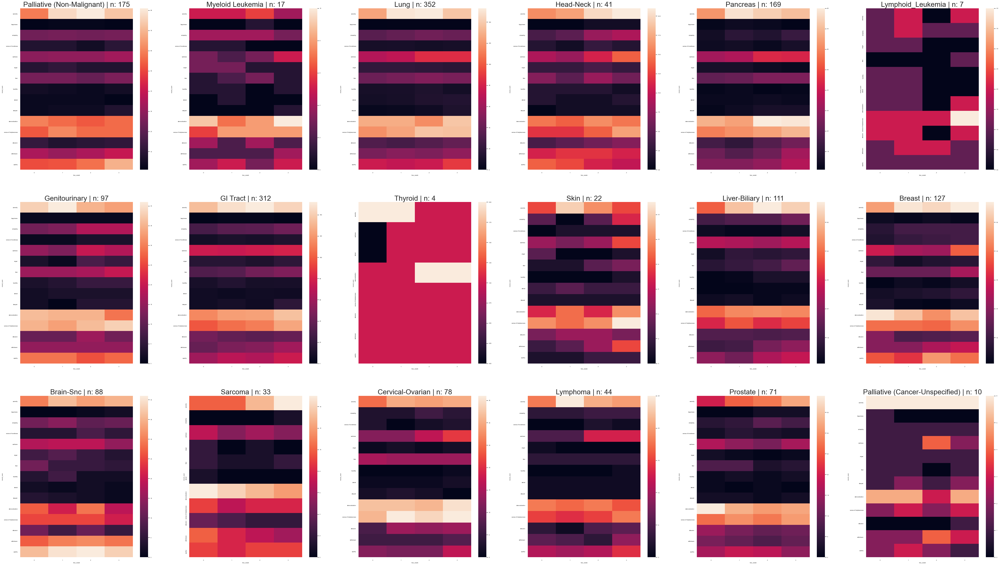

In [42]:
# heatmap for diagnosis type with uniform yticks with small fig size
plt.rcParams['figure.figsize'] = [70, 40]
sns.set(font_scale=0.5)
fig, ((ax1, ax2, ax3, ax4, ax5, ax6), (ax7, ax8, ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16, ax17, ax18)) = plt.subplots(3, 6)
df_ms = df_mw[df_mw['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df1 = df_ms[df_ms['Diagnosis'] == 'Palliative (Non-Malignant)']
df2 = df_ms[df_ms['Diagnosis'] == 'Myeloid Leukemia']
df3 = df_ms[df_ms['Diagnosis'] == 'Lung']
df4 = df_ms[df_ms['Diagnosis'] == 'Head-Neck']
df5 = df_ms[df_ms['Diagnosis'] == 'Pancreas']
df6 = df_ms[df_ms['Diagnosis'] == 'Lymphoid_Leukemia']
df7 = df_ms[df_ms['Diagnosis'] == 'Genitourinary']
df8 = df_ms[df_ms['Diagnosis'] == 'GI Tract']
df9 = df_ms[df_ms['Diagnosis'] == 'Thyroid']
df10 = df_ms[df_ms['Diagnosis'] == 'Skin']
df11= df_ms[df_ms['Diagnosis'] == 'Liver-Biliary']
df12 = df_ms[df_ms['Diagnosis'] == 'Breast']
df13 = df_ms[df_ms['Diagnosis'] == 'Brain-Snc']
df14 = df_ms[df_ms['Diagnosis'] == 'Sarcoma']
df15 = df_ms[df_ms['Diagnosis'] == 'Cervical-Ovarian']
df16 = df_ms[df_ms['Diagnosis'] == 'Lymphoma']
df17 = df_ms[df_ms['Diagnosis'] == 'Prostate']
df18 = df_ms[df_ms['Diagnosis'] == 'Palliative (Cancer-Unspecified)']

n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
n3 = len(df3.IDEHR.unique())
n4 = len(df4.IDEHR.unique())
n5 = len(df5.IDEHR.unique())
n6 = len(df6.IDEHR.unique())
n7 = len(df7.IDEHR.unique())
n8 = len(df8.IDEHR.unique())
n9 = len(df9.IDEHR.unique())
n10 = len(df10.IDEHR.unique())
n11= len(df11.IDEHR.unique())
n12 = len(df12.IDEHR.unique())
n13 = len(df13.IDEHR.unique())
n14 = len(df14.IDEHR.unique())
n15 = len(df15.IDEHR.unique())
n16 = len(df16.IDEHR.unique())
n17 = len(df17.IDEHR.unique())
n18 = len(df18.IDEHR.unique())

df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df3 = df3[['mood_num', 'hos_week']].reset_index(drop=True)
df3 = df3.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df4 = df4[['mood_num', 'hos_week']].reset_index(drop=True)
df4 = df4.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df5 = df5[['mood_num', 'hos_week']].reset_index(drop=True)
df5 = df5.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df6 = df6[['mood_num', 'hos_week']].reset_index(drop=True)
df6 = df6.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df7 = df7[['mood_num', 'hos_week']].reset_index(drop=True)
df7 = df7.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df8 = df8[['mood_num', 'hos_week']].reset_index(drop=True)
df8 = df8.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df9 = df9[['mood_num', 'hos_week']].reset_index(drop=True)
df9 = df9.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df10 = df10[['mood_num', 'hos_week']].reset_index(drop=True)
df10 = df10.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df11 = df11[['mood_num', 'hos_week']].reset_index(drop=True)
df11 = df11.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df12 = df12[['mood_num', 'hos_week']].reset_index(drop=True)
df12 = df12.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df13 = df13[['mood_num', 'hos_week']].reset_index(drop=True)
df13 = df13.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df14 = df14[['mood_num', 'hos_week']].reset_index(drop=True)
df14 = df14.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df15 = df15[['mood_num', 'hos_week']].reset_index(drop=True)
df15 = df15.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df16 = df16[['mood_num', 'hos_week']].reset_index(drop=True)
df16 = df16.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df17 = df17[['mood_num', 'hos_week']].reset_index(drop=True)
df17 = df17.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df18 = df18[['mood_num', 'hos_week']].reset_index(drop=True)
df18 = df18.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()

cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats_ll = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'hostility', 'fear', 'anger', 'irritability', 'serenity']
cats_ll.reverse()
cats_thy = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'sadness', 'serenity']
cats_thy.reverse()
cats_skin = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_skin.reverse()
cats_lb = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_lb.reverse()
cats_sc = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'denial', 'fear', 'anger', 'sadness', 'irritability', 'serenity']
cats_sc.reverse()
cats_cov = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_cov.reverse()
cats_lym = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats_lym.reverse()
cats_pcu = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'fear', 'anger', 'sadness', 'irritability', 'happiness', 'serenity']
cats_pcu.reverse()

df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df3['mood_num'] = pd.Categorical(df3['mood_num'], categories=cats, ordered=True)
df4['mood_num'] = pd.Categorical(df4['mood_num'], categories=cats, ordered=True)
df5['mood_num'] = pd.Categorical(df5['mood_num'], categories=cats, ordered=True)
df6['mood_num'] = pd.Categorical(df6['mood_num'], categories=cats_ll, ordered=True)
df7['mood_num'] = pd.Categorical(df7['mood_num'], categories=cats, ordered=True)
df8['mood_num'] = pd.Categorical(df8['mood_num'], categories=cats, ordered=True)
df9['mood_num'] = pd.Categorical(df9['mood_num'], categories=cats_thy, ordered=True)
df10['mood_num'] = pd.Categorical(df10['mood_num'], categories=cats_skin, ordered=True)
df11['mood_num'] = pd.Categorical(df11['mood_num'], categories=cats_lb, ordered=True)
df12['mood_num'] = pd.Categorical(df12['mood_num'], categories=cats, ordered=True)
df13['mood_num'] = pd.Categorical(df13['mood_num'], categories=cats, ordered=True)
df14['mood_num'] = pd.Categorical(df14['mood_num'], categories=cats_sc, ordered=True)
df15['mood_num'] = pd.Categorical(df15['mood_num'], categories=cats_cov, ordered=True)
df16['mood_num'] = pd.Categorical(df16['mood_num'], categories=cats_lym, ordered=True)
df17['mood_num'] = pd.Categorical(df17['mood_num'], categories=cats, ordered=True)
df18['mood_num'] = pd.Categorical(df18['mood_num'], categories=cats_pcu, ordered=True)

df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df3 = df3.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df4 = df4.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df5 = df5.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df6 = df6.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df7 = df7.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df8 = df8.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df9 = df9.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df10 = df10.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df11 = df11.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df12 = df12.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df13 = df13.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df14 = df14.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df15 = df15.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df16 = df16.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df17 = df17.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df18 = df18.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)

sns.heatmap(df1, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_title('Palliative (Non-Malignant) | n: ' + str(n1), fontsize=28)
sns.heatmap(df2, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_title('Myeloid Leukemia | n: ' + str(n2), fontsize=28)
sns.heatmap(df3, fmt='g', ax=ax3)
ax3.set_facecolor('xkcd:black')
ax3.set_title('Lung | n: ' + str(n3), fontsize=28)
sns.heatmap(df4, fmt='g', ax=ax4)
ax4.set_facecolor('xkcd:black')
ax4.set_title('Head-Neck | n: ' + str(n4), fontsize=28)
sns.heatmap(df5, fmt='g', ax=ax5)
ax5.set_facecolor('xkcd:black')
ax5.set_title('Pancreas | n: ' + str(n5), fontsize=28)
sns.heatmap(df6, fmt='g', ax=ax6)
ax6.set_facecolor('xkcd:black')
ax6.set_title('Lymphoid_Leukemia | n: ' + str(n6), fontsize=28)
sns.heatmap(df7, fmt='g', ax=ax7)
ax7.set_facecolor('xkcd:black')
ax7.set_title('Genitourinary | n: ' + str(n7), fontsize=28)
sns.heatmap(df8, fmt='g', ax=ax8)
ax8.set_facecolor('xkcd:black')
ax8.set_title('GI Tract | n: ' + str(n8), fontsize=28)
sns.heatmap(df9, fmt='g', ax=ax9)
ax9.set_facecolor('xkcd:black')
ax9.set_title('Thyroid | n: ' + str(n9), fontsize=28)
sns.heatmap(df10, fmt='g', ax=ax10)
ax10.set_facecolor('xkcd:black')
ax10.set_title('Skin | n: ' + str(n10), fontsize=28)
sns.heatmap(df11, fmt='g', ax=ax11)
ax11.set_facecolor('xkcd:black')
ax11.set_title('Liver-Biliary | n: ' + str(n11), fontsize=28)
sns.heatmap(df12, fmt='g', ax=ax12)
ax12.set_facecolor('xkcd:black')
ax12.set_title('Breast | n: ' + str(n12), fontsize=28)
sns.heatmap(df13, fmt='g', ax=ax13)
ax13.set_facecolor('xkcd:black')
ax13.set_title('Brain-Snc | n: ' + str(n13), fontsize=28)
sns.heatmap(df14, fmt='g', ax=ax14)
ax14.set_facecolor('xkcd:black')
ax14.set_title('Sarcoma | n: ' + str(n14), fontsize=28)
sns.heatmap(df15, fmt='g', ax=ax15)
ax15.set_facecolor('xkcd:black')
ax15.set_title('Cervical-Ovarian | n: ' + str(n15), fontsize=28)
sns.heatmap(df16, fmt='g', ax=ax16)
ax16.set_facecolor('xkcd:black')
ax16.set_title('Lymphoma | n: ' + str(n16), fontsize=28)
sns.heatmap(df17, fmt='g', ax=ax17)
ax17.set_facecolor('xkcd:black')
ax17.set_title('Prostate | n: ' + str(n17), fontsize=28)
sns.heatmap(df18, fmt='g', ax=ax18)
ax18.set_facecolor('xkcd:black')
ax18.set_title('Palliative (Cancer-Unspecified) | n: ' + str(n18), fontsize=28)

# fig.suptitle('Mood Heatmap for Patients surviving atleast 6 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_heatmaps_by_diag_3.png', bbox_inches='tight')
plt.show()

In [43]:
df_mw[df_mw['IDEHR'] == 1382]

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week
0,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,3
5,1382,EHR,45.0,Palliative (Non-Malignant),serenity,3
11,1382,EHR,45.0,Palliative (Non-Malignant),serenity,4
12,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,4
17,1382,EHR,45.0,Palliative (Non-Malignant),apathy,4
24,1382,EHR,45.0,Palliative (Non-Malignant),sense of helplessness,4
32,1382,EHR,45.0,Palliative (Non-Malignant),sense of loneliness,4
37,1382,EHR,45.0,Palliative (Non-Malignant),sadness,4
39,1382,EHR,45.0,Palliative (Non-Malignant),serenity,5
41,1382,EHR,45.0,Palliative (Non-Malignant),apathy,5


In [44]:
from IPython.core.display import display, HTML
with pd.option_context("display.max_rows", 500):
    display(HTML(df_ma[df_ma['IDEHR'] == 1382].to_html()))

,IDEHR,EHRType,TimeStamp_Insert,SOH,survival_time_days,Diagnosis,mood_num,hos_days,hos_week
0,1382,EHR,2015-10-06 11:20:09.030,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,24,3
1,1382,EHR,2015-10-06 13:08:33.307,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,24,3
2,1382,EHR,2015-10-06 17:51:06.480,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
3,1382,EHR,2015-10-07 05:20:13.373,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
4,1382,EHR,2015-10-07 11:12:16.007,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
5,1382,EHR,2015-10-07 11:19:10.627,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,25,3
5,1382,EHR,2015-10-07 11:19:10.627,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),serenity,25,3
6,1382,EHR,2015-10-07 19:28:37.617,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,26,3
6,1382,EHR,2015-10-07 19:28:37.617,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),serenity,26,3
7,1382,EHR,2015-10-08 05:23:17.963,2015-09-11 17:39:52.193,45.0,Palliative (Non-Malignant),withdrawn,26,3


In [45]:
plt.rcParams['figure.figsize'] = [20, 12]
matplotlib.rcParams.update({'font.size': 20})
sns.set(font_scale=1.5)

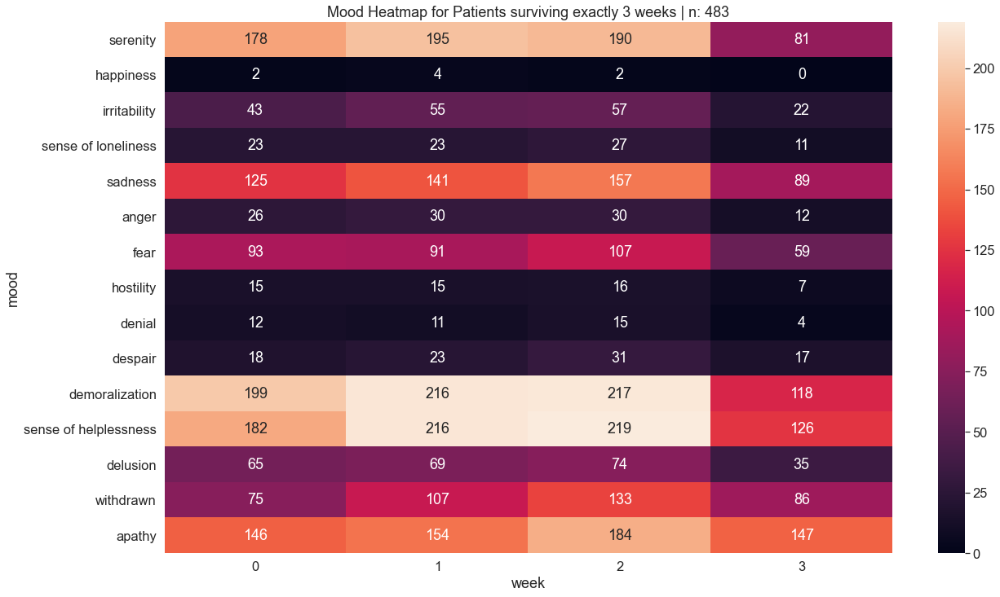

In [46]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['survival_time_days'] < 28]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 3 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
# plt.savefig('./graphs/mood/mood_3w_exact.png', bbox_inches='tight')
plt.show()

In [47]:
get_coeffs(df_hm, 3)

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,178.0,195.0,190.0,81.0,-29.6,-31.50,64.90
happiness,2.0,4.0,2.0,0.0,-0.8,-1.00,2.20
irritability,43.0,55.0,57.0,22.0,-6.1,-11.75,29.15
sense of loneliness,23.0,23.0,27.0,11.0,-3.2,-4.00,8.80
sadness,125.0,141.0,157.0,89.0,-9.2,-21.00,53.80
anger,26.0,30.0,30.0,12.0,-4.2,-5.50,12.30
fear,93.0,91.0,107.0,59.0,-8.6,-11.50,25.90
hostility,15.0,15.0,16.0,7.0,-2.3,-2.25,4.45
denial,12.0,11.0,15.0,4.0,-2.0,-2.50,5.50


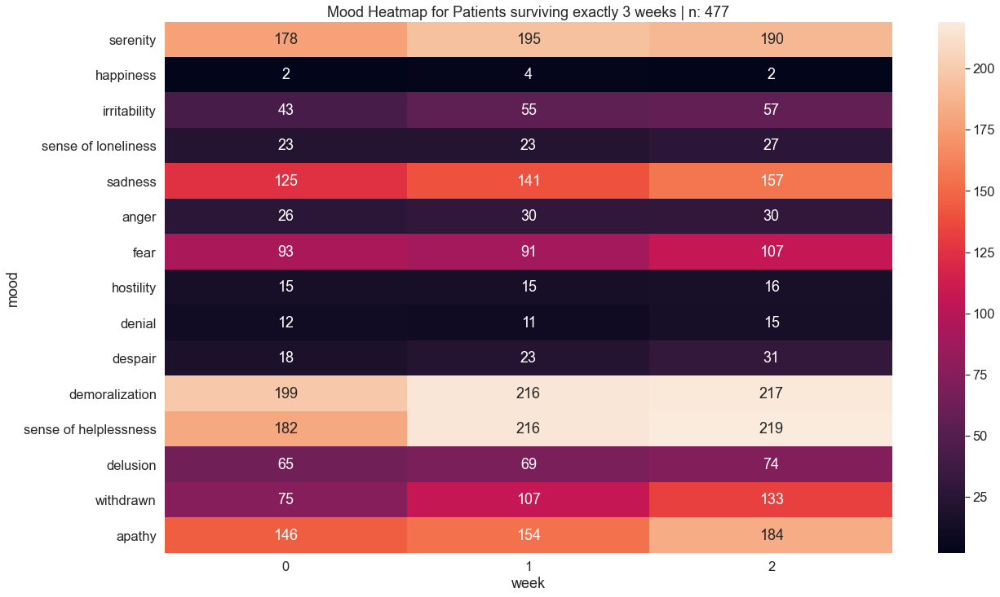

In [48]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['survival_time_days'] < 28]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 3 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_3w_exact.png', bbox_inches='tight')
plt.show()

In [49]:
dft = get_coeffs(df_hm, 2)
dfw3 = dft['deg1 (m)']
dfp3 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,178,195,190,6.0,-11.0,28.0
happiness,2,4,2,-0.0,-2.0,4.0
irritability,43,55,57,7.0,-5.0,17.0
sense of loneliness,23,23,27,2.0,2.0,-2.0
sadness,125,141,157,16.0,-0.0,16.0
anger,26,30,30,2.0,-2.0,6.0
fear,93,91,107,7.0,9.0,-11.0
hostility,15,15,16,0.5,0.5,-0.5
denial,12,11,15,1.5,2.5,-3.5


In [50]:
# diving into the data
dft = df_mw[df_mw['survival_time_days'] >= 21]
dft = dft[dft['survival_time_days'] < 28]
dft

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week
147,1423,EHR,26.0,Palliative (Non-Malignant),happiness,0
147,1423,EHR,26.0,Palliative (Non-Malignant),serenity,0
150,1423,EHR,26.0,Palliative (Non-Malignant),happiness,1
150,1423,EHR,26.0,Palliative (Non-Malignant),serenity,1
163,1423,EHR,26.0,Palliative (Non-Malignant),happiness,2
...,...,...,...,...,...,...
101081,28906,AMB,26.0,Breast,apathy,2
101083,28906,AMB,26.0,Breast,apathy,3
101084,28906,AMB,26.0,Breast,demoralization,3
101085,28906,AMB,26.0,Breast,withdrawn,3


In [51]:
dft.hos_week.value_counts()

2    1500
1    1373
0    1226
3     942
4       7
5       4
Name: hos_week, dtype: int64

In [52]:
len(dft[dft['hos_week'] >= 3].IDEHR.unique())

375

In [53]:
len(dft.IDEHR.unique())

483

In [54]:
df_ma[df_ma['IDEHR'] == 1442]

,IDEHR,EHRType,TimeStamp_Insert,SOH,survival_time_days,Diagnosis,mood_num,hos_days,hos_week
292,1442,EHR,2015-10-22 15:31:17.457,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),denial,5,0
292,1442,EHR,2015-10-22 15:31:17.457,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),fear,5,0
293,1442,EHR,2015-10-22 20:45:19.887,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),serenity,6,0
294,1442,EHR,2015-10-23 07:07:03.497,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),fear,6,0
295,1442,EHR,2015-10-23 18:11:10.857,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),fear,7,1
296,1442,EHR,2015-10-25 07:52:11.297,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),irritability,8,1
296,1442,EHR,2015-10-25 07:52:11.297,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),denial,8,1
296,1442,EHR,2015-10-25 07:52:11.297,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),hostility,8,1
296,1442,EHR,2015-10-25 07:52:11.297,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),fear,8,1
297,1442,EHR,2015-10-25 16:50:46.740,2015-10-16 18:03:45.160,25.0,Palliative (Non-Malignant),serenity,8,1


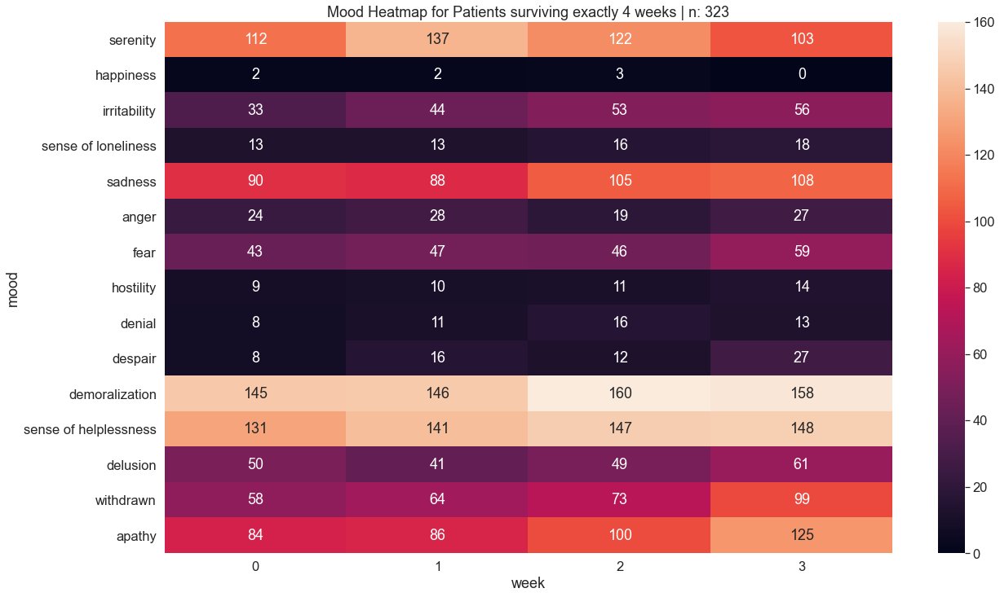

In [55]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['survival_time_days'] < 35]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 4 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_4w_exact.png', bbox_inches='tight')
plt.show()

In [56]:
dft = get_coeffs(df_hm, 3)
dfw4 = dft['deg1 (m)']
dfp4 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,112.0,137.0,122.0,103.0,-4.2,-11.00,28.80
happiness,2.0,2.0,3.0,0.0,-0.5,-0.75,1.75
irritability,33.0,44.0,53.0,56.0,7.8,-2.00,13.80
sense of loneliness,13.0,13.0,16.0,18.0,1.8,0.50,0.30
sadness,90.0,88.0,105.0,108.0,7.1,1.25,3.35
anger,24.0,28.0,19.0,27.0,-0.0,1.00,-3.00
fear,43.0,47.0,46.0,59.0,4.7,2.25,-2.05
hostility,9.0,10.0,11.0,14.0,1.6,0.50,0.10
denial,8.0,11.0,16.0,13.0,2.0,-1.50,6.50


In [57]:
dft = df_mw[df_mw['survival_time_days'] >= 28]
dft = dft[dft['survival_time_days'] < 35]
dft.hos_week.value_counts()

3     1045
2      948
1      886
0      821
4      650
5        4
11       2
10       2
9        2
8        2
7        1
6        1
Name: hos_week, dtype: int64

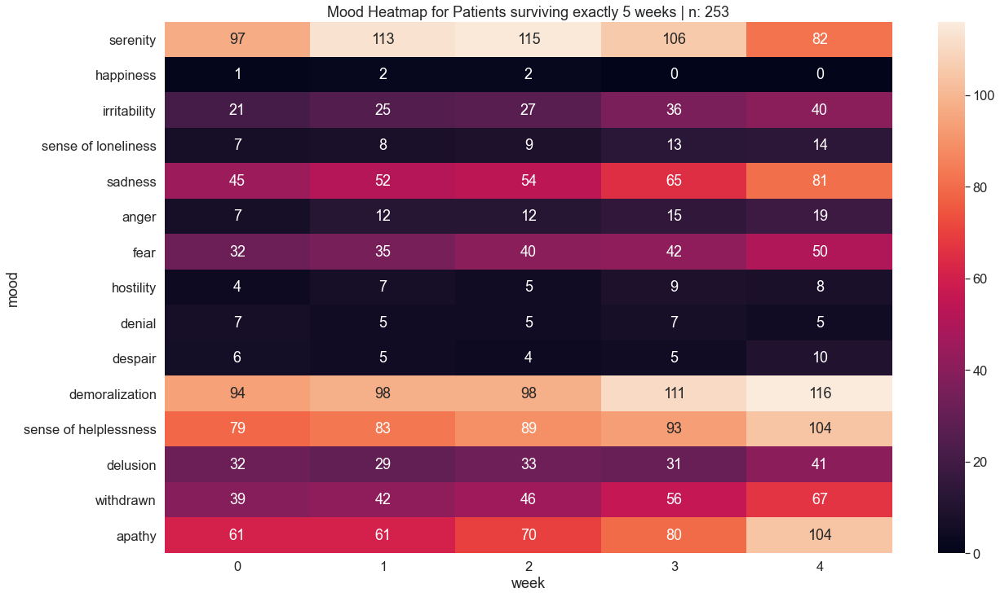

In [58]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 35]
df_ms = df_ms[df_ms['survival_time_days'] < 42]
df_ms = df_ms[df_ms['hos_week'] <= 4]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 5 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_5w_exact.png', bbox_inches='tight')
plt.show()

In [59]:
dft = get_coeffs(df_hm, 4)
dfw5 = dft['deg1 (m)']
dfp5 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,
serenity,97.0,113.0,115.0,106.0,82.0,-3.7,-6.50,22.30
happiness,1.0,2.0,2.0,0.0,0.0,-0.4,-0.29,0.74
irritability,21.0,25.0,27.0,36.0,40.0,4.9,0.50,2.90
sense of loneliness,7.0,8.0,9.0,13.0,14.0,1.9,0.21,1.04
sadness,45.0,52.0,54.0,65.0,81.0,8.5,1.93,0.79
anger,7.0,12.0,12.0,15.0,19.0,2.7,0.07,2.41
fear,32.0,35.0,40.0,42.0,50.0,4.3,0.50,2.30
hostility,4.0,7.0,5.0,9.0,8.0,1.0,-0.14,1.57
denial,7.0,5.0,5.0,7.0,5.0,-0.2,0.14,-0.77


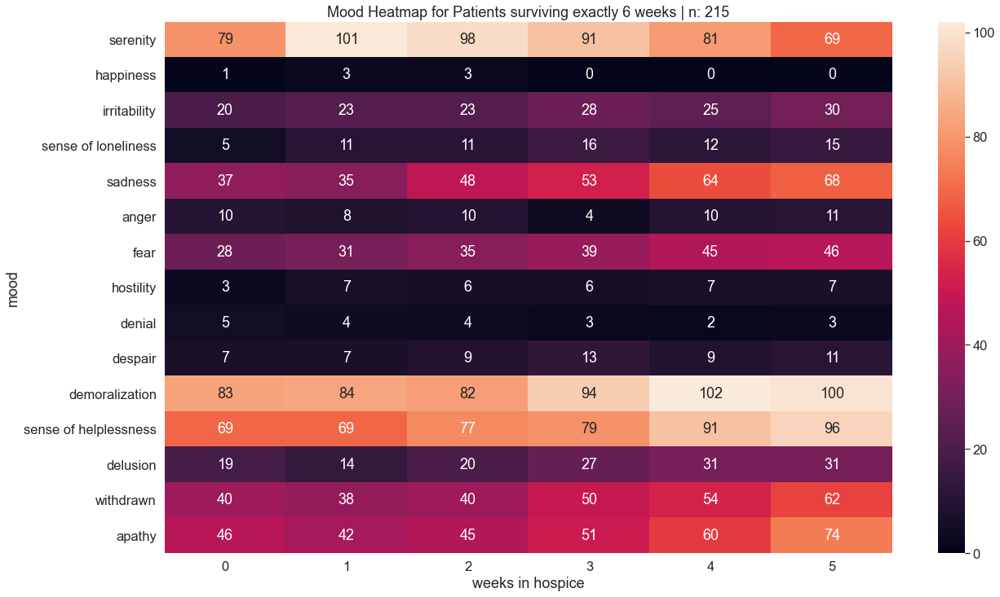

In [60]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['survival_time_days'] < 49]
df_ms = df_ms[df_ms['hos_week'] <= 5]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('weeks in hospice')
ax.set_title('Mood Heatmap for Patients surviving exactly 6 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_6w_exact.png', bbox_inches='tight')
plt.show()

In [61]:
dft = get_coeffs(df_hm, 5)
dfw6 = dft['deg1 (m)']
dfp6 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,79.0,101.0,98.0,91.0,81.0,69.0,-3.34,-3.54,14.34
happiness,1.0,3.0,3.0,0.0,0.0,0.0,-0.49,-0.18,0.41
irritability,20.0,23.0,23.0,28.0,25.0,30.0,1.74,-0.04,1.92
sense of loneliness,5.0,11.0,11.0,16.0,12.0,15.0,1.66,-0.55,4.42
sadness,37.0,35.0,48.0,53.0,64.0,68.0,7.06,0.39,5.09
anger,10.0,8.0,10.0,4.0,10.0,11.0,0.14,0.55,-2.62
fear,28.0,31.0,35.0,39.0,45.0,46.0,3.89,-0.04,4.06
hostility,3.0,7.0,6.0,6.0,7.0,7.0,0.57,-0.21,1.64
denial,5.0,4.0,4.0,3.0,2.0,3.0,-0.49,0.11,-1.02


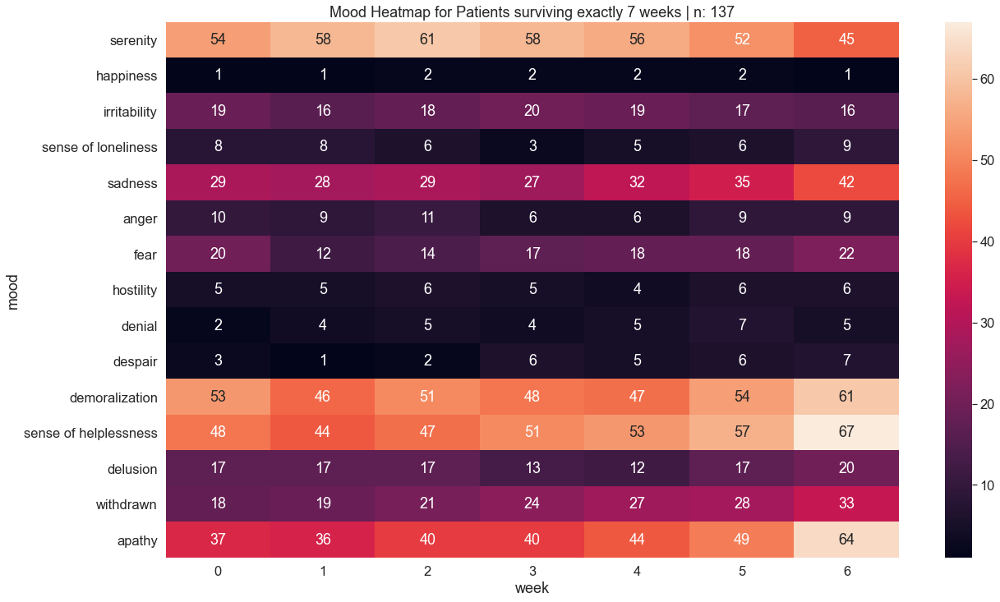

In [62]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 49]
df_ms = df_ms[df_ms['survival_time_days'] < 56]
df_ms = df_ms[df_ms['hos_week'] <= 6]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 7 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_7w_exact.png', bbox_inches='tight')
plt.show()

In [63]:
dft = get_coeffs(df_hm, 6)
dfw7 = dft['deg1 (m)']
dfp7 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,
serenity,54,58,61,58,56,52,45,-1.57,-1.05,4.71
happiness,1,1,2,2,2,2,1,0.07,-0.12,0.79
irritability,19,16,18,20,19,17,16,-0.21,-0.19,0.93
sense of loneliness,8,8,6,3,5,6,9,-0.07,0.48,-2.93
sadness,29,28,29,27,32,35,42,2.00,0.76,-2.57
anger,10,9,11,6,6,9,9,-0.29,0.24,-1.71
fear,20,12,14,17,18,18,22,0.79,0.55,-2.50
hostility,5,5,6,5,4,6,6,0.11,0.06,-0.25
denial,2,4,5,4,5,7,5,0.54,-0.13,1.32


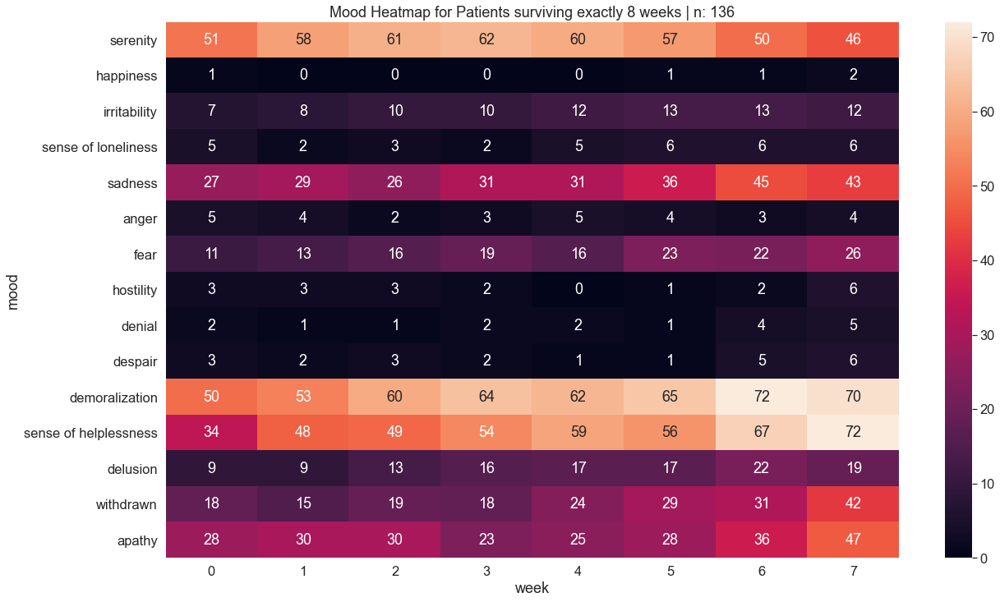

In [64]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 56]
df_ms = df_ms[df_ms['survival_time_days'] < 63]
df_ms = df_ms[df_ms['hos_week'] <= 7]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 8 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_8w_exact.png', bbox_inches='tight')
plt.show()

In [65]:
dft = get_coeffs(df_hm, 7)
dfw8 = dft['deg1 (m)']
dfp8 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,7,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,
serenity,51.0,58.0,61.0,62.0,60.0,57.0,50.0,46.0,-1.06,-1.05,6.32
happiness,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,0.18,0.11,-0.61
irritability,7.0,8.0,10.0,10.0,12.0,13.0,13.0,12.0,0.85,-0.15,1.89
sense of loneliness,5.0,2.0,3.0,2.0,5.0,6.0,6.0,6.0,0.46,0.14,-0.49
sadness,27.0,29.0,26.0,31.0,31.0,36.0,45.0,43.0,2.64,0.40,-0.19
anger,5.0,4.0,2.0,3.0,5.0,4.0,3.0,4.0,-0.05,0.07,-0.55
fear,11.0,13.0,16.0,19.0,16.0,23.0,22.0,26.0,2.00,0.01,1.92
hostility,3.0,3.0,3.0,2.0,0.0,1.0,2.0,6.0,0.10,0.27,-1.82
denial,2.0,1.0,1.0,2.0,2.0,1.0,4.0,5.0,0.43,0.17,-0.74


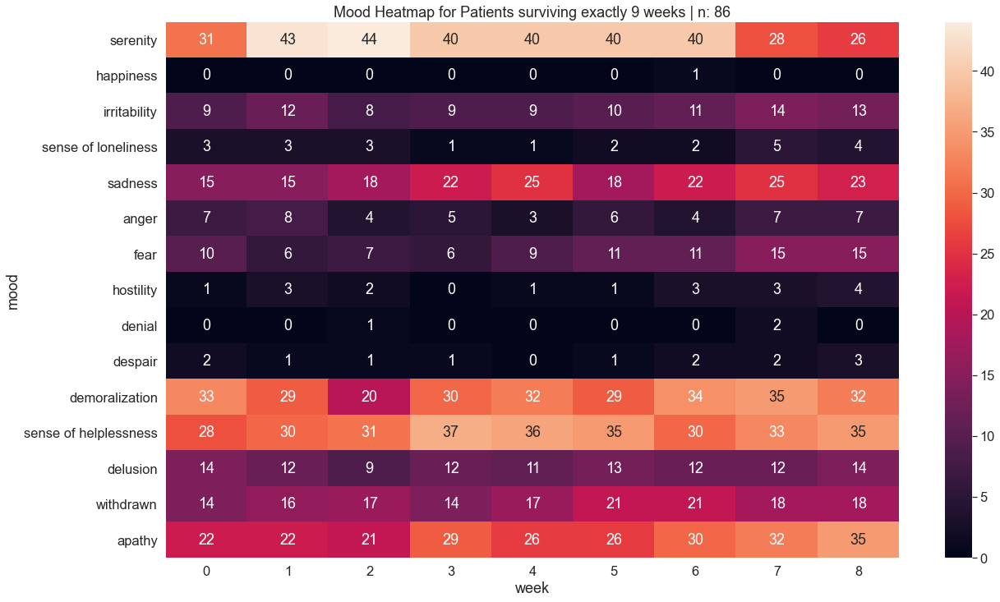

In [66]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 9 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_9w_exact.png', bbox_inches='tight')
plt.show()

In [67]:
dft = get_coeffs(df_hm, 8)
dfw9 = dft['deg1 (m)']
dfp9 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,31.0,43.0,44.0,40.0,40.0,40.0,40.0,28.0,26.0,-1.22,-0.80,5.18
happiness,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.03,-0.01,0.10
irritability,9.0,12.0,8.0,9.0,9.0,10.0,11.0,14.0,13.0,0.48,0.15,-0.75
sense of loneliness,3.0,3.0,3.0,1.0,1.0,2.0,2.0,5.0,4.0,0.15,0.15,-1.07
sadness,15.0,15.0,18.0,22.0,25.0,18.0,22.0,25.0,23.0,1.10,-0.17,2.45
anger,7.0,8.0,4.0,5.0,3.0,6.0,4.0,7.0,7.0,-0.03,0.20,-1.64
fear,10.0,6.0,7.0,6.0,9.0,11.0,11.0,15.0,15.0,1.00,0.25,-1.03
hostility,1.0,3.0,2.0,0.0,1.0,1.0,3.0,3.0,4.0,0.25,0.11,-0.66
denial,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.07,0.01,0.01


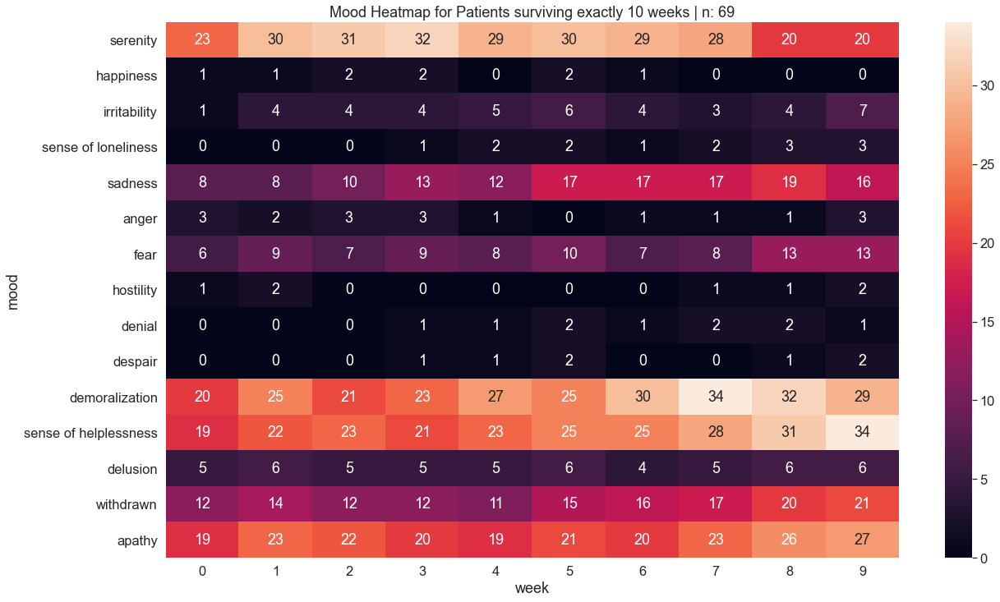

In [68]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 70]
df_ms = df_ms[df_ms['survival_time_days'] < 77]
df_ms = df_ms[df_ms['hos_week'] <= 9]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 10 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_10w_exact.png', bbox_inches='tight')
plt.show()

In [69]:
dft = get_coeffs(df_hm, 9)
dfw10 = dft['deg1 (m)']
dfp10 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,7,8,9,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,
serenity,23.0,30.0,31.0,32.0,29.0,30.0,29.0,28.0,20.0,20.0,-0.73,-0.45,3.36
happiness,1.0,1.0,2.0,2.0,0.0,2.0,1.0,0.0,0.0,0.0,-0.16,-0.04,0.21
irritability,1.0,4.0,4.0,4.0,5.0,6.0,4.0,3.0,4.0,7.0,0.30,-0.04,0.68
sense of loneliness,0.0,0.0,0.0,1.0,2.0,2.0,1.0,2.0,3.0,3.0,0.35,-0.00,0.35
sadness,8.0,8.0,10.0,13.0,12.0,17.0,17.0,17.0,19.0,16.0,1.22,-0.13,2.41
anger,3.0,2.0,3.0,3.0,1.0,0.0,1.0,1.0,1.0,3.0,-0.15,0.08,-0.90
fear,6.0,9.0,7.0,9.0,8.0,10.0,7.0,8.0,13.0,13.0,0.56,0.09,-0.23
hostility,1.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,0.04,0.09,-0.74
denial,0.0,0.0,0.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,0.21,-0.04,0.55


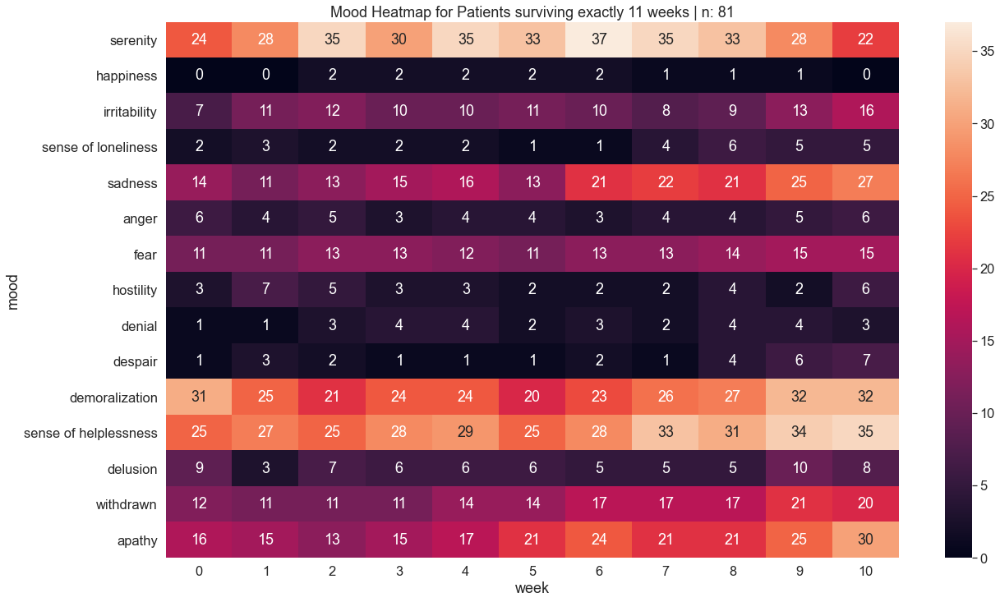

In [70]:
# heatmaps for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 77]
df_ms = df_ms[df_ms['survival_time_days'] < 84]
df_ms = df_ms[df_ms['hos_week'] <= 10]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 11 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_11w_exact.png', bbox_inches='tight')
plt.show()

In [71]:
dft = get_coeffs(df_hm, 10)
dfw11 = dft['deg1 (m)']
dfp11 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,7,8,9,10,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,
serenity,24.0,28.0,35.0,30.0,35.0,33.0,37.0,35.0,33.0,28.0,22.0,-0.04,-0.48,4.74
happiness,0.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,0.0,-0.01,-0.08,0.82
irritability,7.0,11.0,12.0,10.0,10.0,11.0,10.0,8.0,9.0,13.0,16.0,0.36,0.08,-0.45
sense of loneliness,2.0,3.0,2.0,2.0,2.0,1.0,1.0,4.0,6.0,5.0,5.0,0.35,0.08,-0.49
sadness,14.0,11.0,13.0,15.0,16.0,13.0,21.0,22.0,21.0,25.0,27.0,1.49,0.13,0.19
anger,6.0,4.0,5.0,3.0,4.0,4.0,3.0,4.0,4.0,5.0,6.0,0.02,0.09,-0.91
fear,11.0,11.0,13.0,13.0,12.0,11.0,13.0,13.0,14.0,15.0,15.0,0.36,0.03,0.04
hostility,3.0,7.0,5.0,3.0,3.0,2.0,2.0,2.0,4.0,2.0,6.0,-0.10,0.10,-1.09
denial,1.0,1.0,3.0,4.0,4.0,2.0,3.0,2.0,4.0,4.0,3.0,0.18,-0.04,0.60


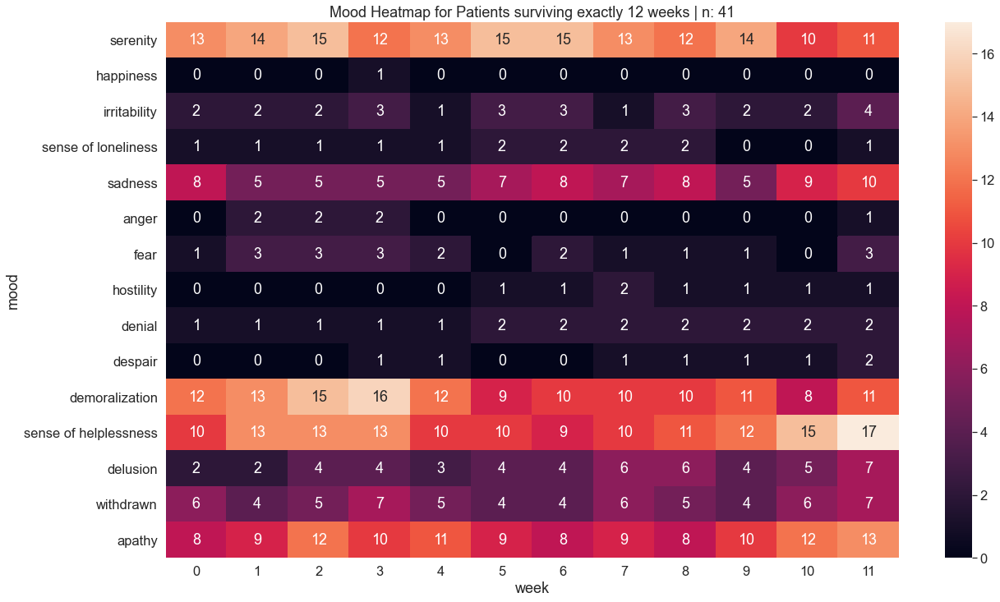

In [72]:
# heatmaps  for patients surviving exactly x weeks
df_ms = df_mw[df_mw['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['survival_time_days'] < 91]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for Patients surviving exactly 12 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_12w_exact.png', bbox_inches='tight')
plt.show()

In [73]:
dft = get_coeffs(df_hm, 11)
dfw12 = dft['deg1 (m)']
dfp12 = dft['deg2 (x2)'].astype(str) + ', ' + dft['deg2 (x1)'].astype(str)
dft

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,13.0,14.0,15.0,12.0,13.0,15.0,15.0,13.0,12.0,14.0,10.0,11.0,-0.23,-0.07,0.50
happiness,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.02,-0.00,0.03
irritability,2.0,2.0,2.0,3.0,1.0,3.0,3.0,1.0,3.0,2.0,2.0,4.0,0.08,0.02,-0.10
sense of loneliness,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,0.0,0.0,1.0,-0.03,-0.04,0.36
sadness,8.0,5.0,5.0,5.0,5.0,7.0,8.0,7.0,8.0,5.0,9.0,10.0,0.28,0.06,-0.42
anger,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.11,0.02,-0.31
fear,1.0,3.0,3.0,3.0,2.0,0.0,2.0,1.0,1.0,1.0,0.0,3.0,-0.10,0.02,-0.31
hostility,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,0.13,-0.02,0.31
denial,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12,-0.01,0.22


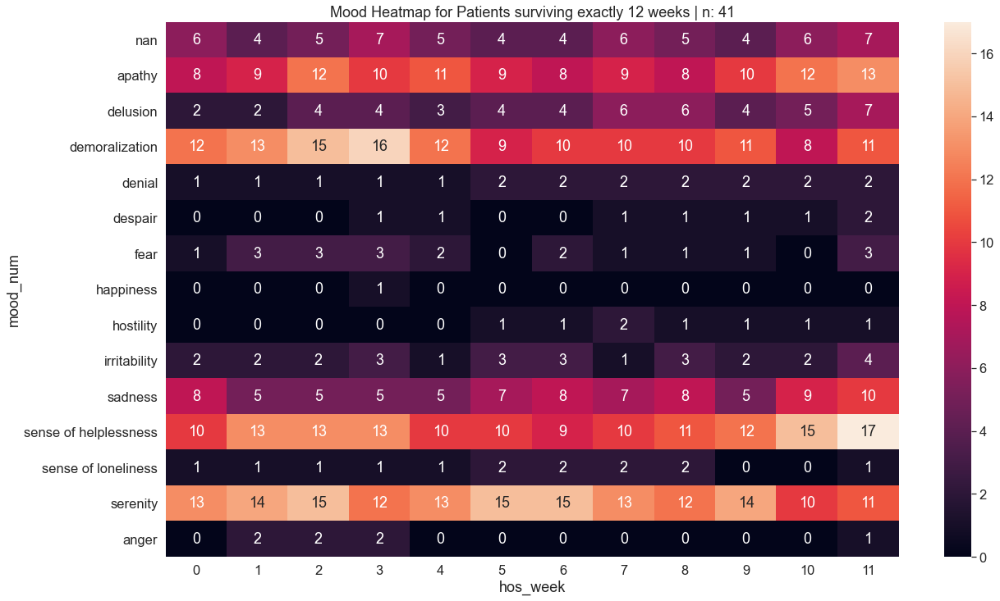

In [74]:
# TESTING by not inverting x-axis
df_ms = df_mw[df_mw['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['survival_time_days'] < 91]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'closure in itself', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_title('Mood Heatmap for Patients surviving exactly 12 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
# plt.savefig('./graphs/mood/mood_12w_exact.png', bbox_inches='tight')
plt.show()

### Matrix of slopes for patients survivng exactly 'x' weeks

In [75]:
# matrix of linear slopes (deg1 (m))
dfm = pd.concat([dfw3, dfw4, dfw5, dfw6, dfw7, dfw8, dfw9, dfw10, dfw11, dfw12], axis=1)
dfm.columns = pd.Index(['W3', 'W4', 'W5', 'W6', 'W7', 'W8','W9', 'W10', 'W11', 'W12'])
dfm

,W3,W4,W5,W6,W7,W8,W9,W10,W11,W12
mood_num,,,,,,,,,,
serenity,6.0,-4.2,-3.7,-3.34,-1.57,-1.06,-1.22,-0.73,-0.04,-0.23
happiness,-0.0,-0.5,-0.4,-0.49,0.07,0.18,0.03,-0.16,-0.01,-0.02
irritability,7.0,7.8,4.9,1.74,-0.21,0.85,0.48,0.30,0.36,0.08
sense of loneliness,2.0,1.8,1.9,1.66,-0.07,0.46,0.15,0.35,0.35,-0.03
sadness,16.0,7.1,8.5,7.06,2.00,2.64,1.10,1.22,1.49,0.28
anger,2.0,-0.0,2.7,0.14,-0.29,-0.05,-0.03,-0.15,0.02,-0.11
fear,7.0,4.7,4.3,3.89,0.79,2.00,1.00,0.56,0.36,-0.10
hostility,0.5,1.6,1.0,0.57,0.11,0.10,0.25,0.04,-0.10,0.13
denial,1.5,2.0,-0.2,-0.49,0.54,0.43,0.07,0.21,0.18,0.12


In [76]:
# matrix of 2nd order poly (deg2 (x2), deg2 (x1))
dfp = pd.concat([dfp3, dfp4, dfp5, dfp6, dfp7, dfp8, dfp9, dfp10, dfp11, dfp12], axis=1)
dfp.columns = pd.Index(['W3', 'W4', 'W5', 'W6', 'W7', 'W8','W9', 'W10', 'W11', 'W12'])
dfp

,W3,W4,W5,W6,W7,W8,W9,W10,W11,W12
mood_num,,,,,,,,,,
serenity,"-11.0, 28.0","-11.0, 28.8","-6.5, 22.3","-3.54, 14.34","-1.05, 4.71","-1.05, 6.32","-0.8, 5.18","-0.45, 3.36","-0.48, 4.74","-0.07, 0.5"
happiness,"-2.0, 4.0","-0.75, 1.75","-0.29, 0.74","-0.18, 0.41","-0.12, 0.79","0.11, -0.61","-0.01, 0.1","-0.04, 0.21","-0.08, 0.82","-0.0, 0.03"
irritability,"-5.0, 17.0","-2.0, 13.8","0.5, 2.9","-0.04, 1.92","-0.19, 0.93","-0.15, 1.89","0.15, -0.75","-0.04, 0.68","0.08, -0.45","0.02, -0.1"
sense of loneliness,"2.0, -2.0","0.5, 0.3","0.21, 1.04","-0.55, 4.42","0.48, -2.93","0.14, -0.49","0.15, -1.07","-0.0, 0.35","0.08, -0.49","-0.04, 0.36"
sadness,"-0.0, 16.0","1.25, 3.35","1.93, 0.79","0.39, 5.09","0.76, -2.57","0.4, -0.19","-0.17, 2.45","-0.13, 2.41","0.13, 0.19","0.06, -0.42"
anger,"-2.0, 6.0","1.0, -3.0","0.07, 2.41","0.55, -2.62","0.24, -1.71","0.07, -0.55","0.2, -1.64","0.08, -0.9","0.09, -0.91","0.02, -0.31"
fear,"9.0, -11.0","2.25, -2.05","0.5, 2.3","-0.04, 4.06","0.55, -2.5","0.01, 1.92","0.25, -1.03","0.09, -0.23","0.03, 0.04","0.02, -0.31"
hostility,"0.5, -0.5","0.5, 0.1","-0.14, 1.57","-0.21, 1.64","0.06, -0.25","0.27, -1.82","0.11, -0.66","0.09, -0.74","0.1, -1.09","-0.02, 0.31"
denial,"2.5, -3.5","-1.5, 6.5","0.14, -0.77","0.11, -1.02","-0.13, 1.32","0.17, -0.74","0.01, 0.01","-0.04, 0.55","-0.04, 0.6","-0.01, 0.22"


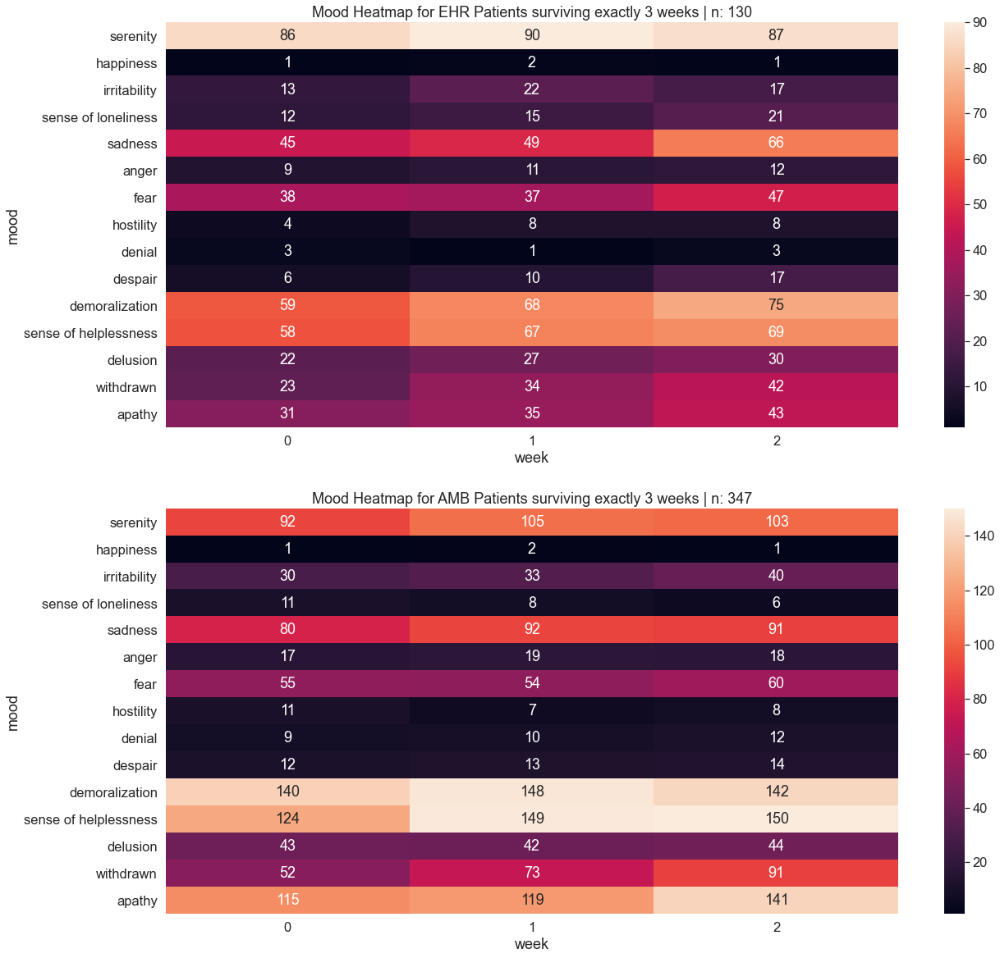

In [77]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['survival_time_days'] < 28]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 3 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 3 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_3w_exact.png', bbox_inches='tight')
plt.show()

In [78]:
get_coeffs(df1, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,86,90,87,0.5,-3.5,7.5
happiness,1,2,1,-0.0,-1.0,2.0
irritability,13,22,17,2.0,-7.0,16.0
sense of loneliness,12,15,21,4.5,1.5,1.5
sadness,45,49,66,10.5,6.5,-2.5
anger,9,11,12,1.5,-0.5,2.5
fear,38,37,47,4.5,5.5,-6.5
hostility,4,8,8,2.0,-2.0,6.0
denial,3,1,3,0.0,2.0,-4.0


In [79]:
get_coeffs(df2, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,92,105,103,5.5,-7.5,20.5
happiness,1,2,1,-0.0,-1.0,2.0
irritability,30,33,40,5.0,2.0,1.0
sense of loneliness,11,8,6,-2.5,0.5,-3.5
sadness,80,92,91,5.5,-6.5,18.5
anger,17,19,18,0.5,-1.5,3.5
fear,55,54,60,2.5,3.5,-4.5
hostility,11,7,8,-1.5,2.5,-6.5
denial,9,10,12,1.5,0.5,0.5


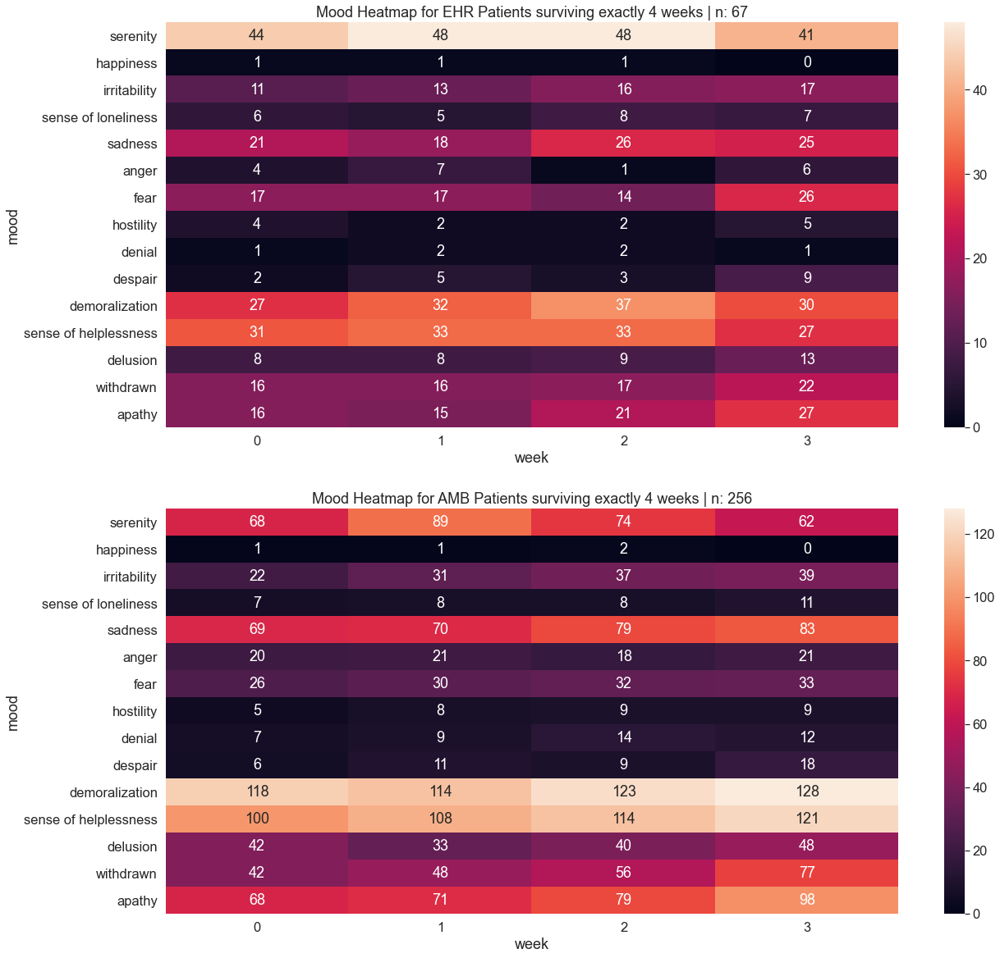

In [80]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['survival_time_days'] < 35]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 4 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 4 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_4w_exact.png', bbox_inches='tight')
plt.show()

In [81]:
get_coeffs(df1, 3)

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,44.0,48.0,48.0,41.0,-0.9,-2.75,7.35
happiness,1.0,1.0,1.0,0.0,-0.3,-0.25,0.45
irritability,11.0,13.0,16.0,17.0,2.1,-0.25,2.85
sense of loneliness,6.0,5.0,8.0,7.0,0.6,-0.00,0.60
sadness,21.0,18.0,26.0,25.0,2.0,0.50,0.50
anger,4.0,7.0,1.0,6.0,-0.0,0.50,-1.50
fear,17.0,17.0,14.0,26.0,2.4,3.00,-6.60
hostility,4.0,2.0,2.0,5.0,0.3,1.25,-3.45
denial,1.0,2.0,2.0,1.0,-0.0,-0.50,1.50


In [82]:
get_coeffs(df2, 3)

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,68.0,89.0,74.0,62.0,-3.3,-8.25,21.45
happiness,1.0,1.0,2.0,0.0,-0.2,-0.50,1.30
irritability,22.0,31.0,37.0,39.0,5.7,-1.75,10.95
sense of loneliness,7.0,8.0,8.0,11.0,1.2,0.50,-0.30
sadness,69.0,70.0,79.0,83.0,5.1,0.75,2.85
anger,20.0,21.0,18.0,21.0,-0.0,0.50,-1.50
fear,26.0,30.0,32.0,33.0,2.3,-0.75,4.55
hostility,5.0,8.0,9.0,9.0,1.3,-0.75,3.55
denial,7.0,9.0,14.0,12.0,2.0,-1.00,5.00


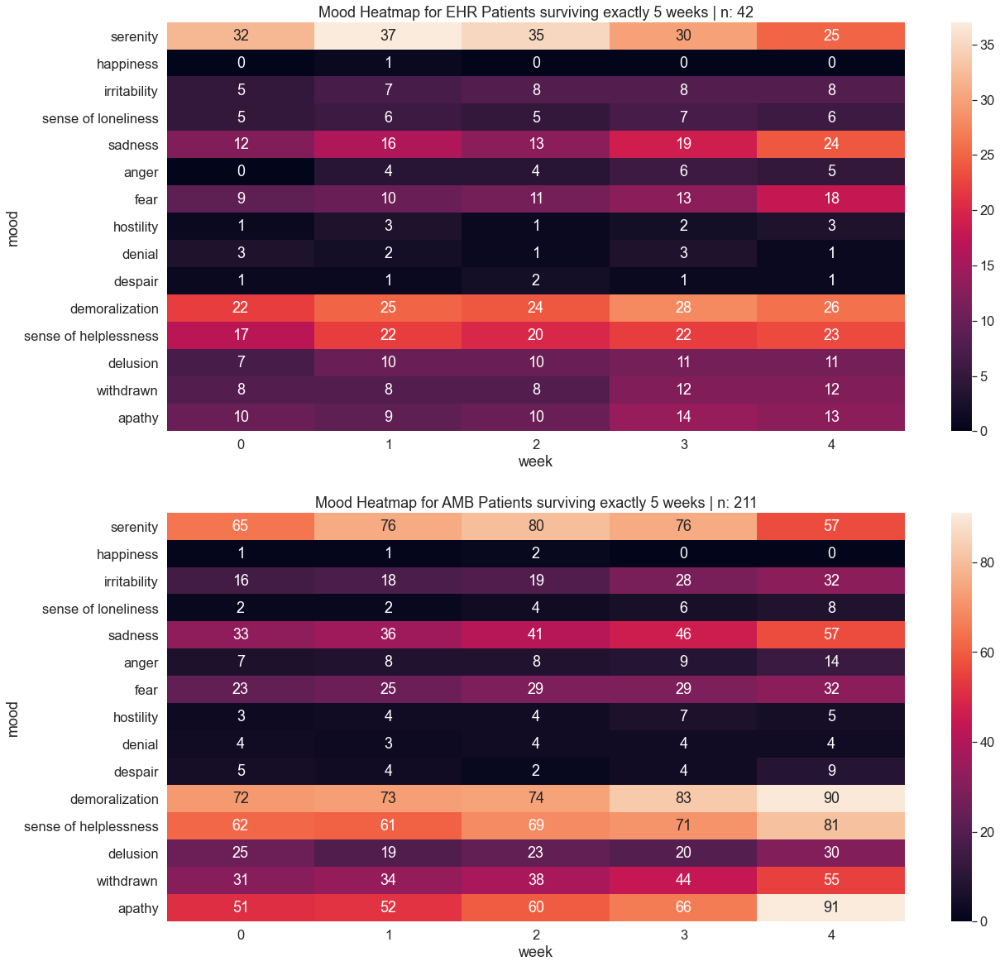

In [83]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 35]
df_ms = df_ms[df_ms['survival_time_days'] < 42]
df_ms = df_ms[df_ms['hos_week'] <= 4]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 5 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 5 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_5w_exact.png', bbox_inches='tight')
plt.show()

In [84]:
get_coeffs(df1, 4)

,0,1,2,3,4,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,
serenity,32.0,37.0,35.0,30.0,25.0,-2.1,-1.64,4.47
happiness,0.0,1.0,0.0,0.0,0.0,-0.1,-0.07,0.19
irritability,5.0,7.0,8.0,8.0,8.0,0.7,-0.36,2.13
sense of loneliness,5.0,6.0,5.0,7.0,6.0,0.3,-0.07,0.59
sadness,12.0,16.0,13.0,19.0,24.0,2.7,0.79,-0.44
anger,0.0,4.0,4.0,6.0,5.0,1.2,-0.57,3.49
fear,9.0,10.0,11.0,13.0,18.0,2.1,0.64,-0.47
hostility,1.0,3.0,1.0,2.0,3.0,0.3,0.07,0.01
denial,3.0,2.0,1.0,3.0,1.0,-0.3,0.07,-0.59


In [85]:
get_coeffs(df2, 4)

,0,1,2,3,4,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,
serenity,65.0,76.0,80.0,76.0,57.0,-1.6,-4.86,17.83
happiness,1.0,1.0,2.0,0.0,0.0,-0.3,-0.21,0.56
irritability,16.0,18.0,19.0,28.0,32.0,4.2,0.86,0.77
sense of loneliness,2.0,2.0,4.0,6.0,8.0,1.6,0.29,0.46
sadness,33.0,36.0,41.0,46.0,57.0,5.8,1.14,1.23
anger,7.0,8.0,8.0,9.0,14.0,1.5,0.64,-1.07
fear,23.0,25.0,29.0,29.0,32.0,2.2,-0.14,2.77
hostility,3.0,4.0,4.0,7.0,5.0,0.7,-0.21,1.56
denial,4.0,3.0,4.0,4.0,4.0,0.1,0.07,-0.19


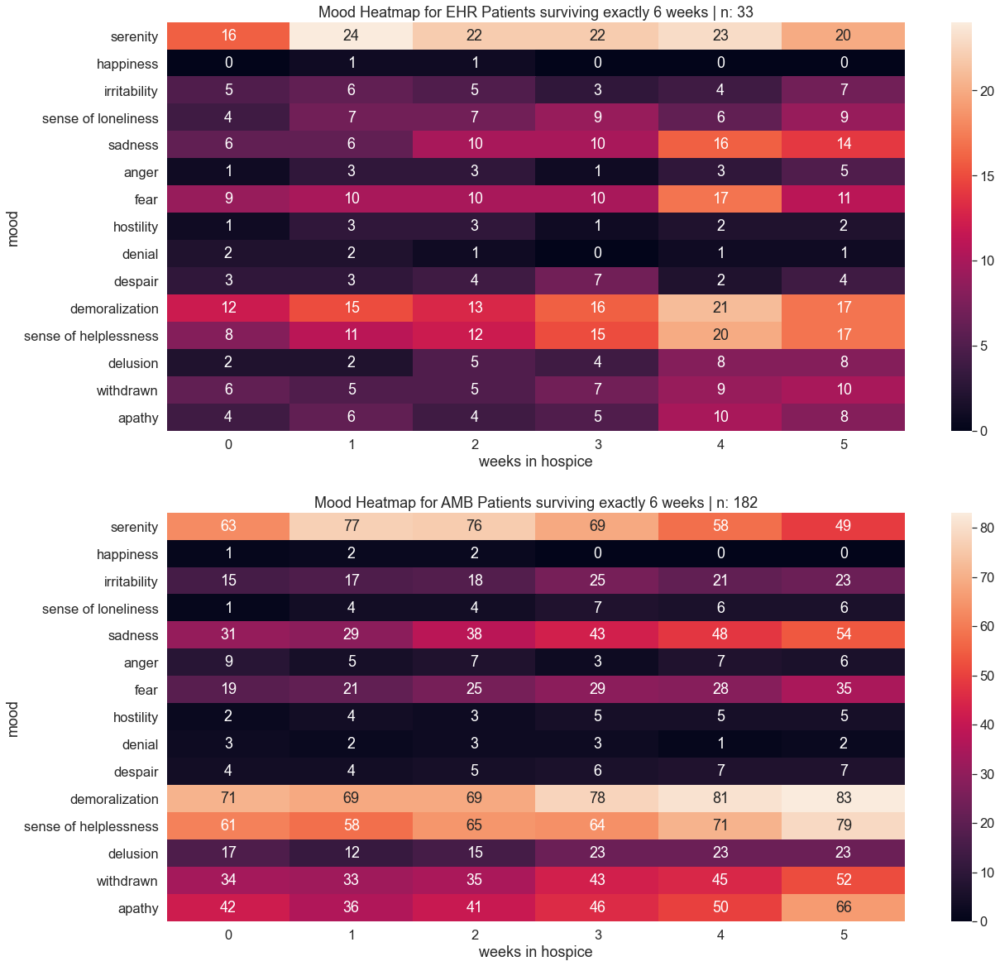

In [86]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['survival_time_days'] < 49]
df_ms = df_ms[df_ms['hos_week'] <= 5]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('weeks in hospice')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 6 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('weeks in hospice')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 6 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_6w_exact.png', bbox_inches='tight')
plt.show()

In [87]:
get_coeffs(df1, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,16.0,24.0,22.0,22.0,23.0,20.0,0.49,-0.77,4.33
happiness,0.0,1.0,1.0,0.0,0.0,0.0,-0.11,-0.09,0.33
irritability,5.0,6.0,5.0,3.0,4.0,7.0,0.06,0.32,-1.55
sense of loneliness,4.0,7.0,7.0,9.0,6.0,9.0,0.69,-0.21,1.76
sadness,6.0,6.0,10.0,10.0,16.0,14.0,2.00,-0.04,2.18
anger,1.0,3.0,3.0,1.0,3.0,5.0,0.51,0.14,-0.20
fear,9.0,10.0,10.0,10.0,17.0,11.0,0.89,-0.12,1.51
hostility,1.0,3.0,3.0,1.0,2.0,2.0,-0.00,-0.11,0.54
denial,2.0,2.0,1.0,0.0,1.0,1.0,-0.26,0.14,-0.97


In [88]:
get_coeffs(df2, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,63.0,77.0,76.0,69.0,58.0,49.0,-3.83,-2.77,10.01
happiness,1.0,2.0,2.0,0.0,0.0,0.0,-0.37,-0.09,0.08
irritability,15.0,17.0,18.0,25.0,21.0,23.0,1.69,-0.36,3.47
sense of loneliness,1.0,4.0,4.0,7.0,6.0,6.0,0.97,-0.34,2.67
sadness,31.0,29.0,38.0,43.0,48.0,54.0,5.06,0.43,2.91
anger,9.0,5.0,7.0,3.0,7.0,6.0,-0.37,0.41,-2.42
fear,19.0,21.0,25.0,29.0,28.0,35.0,3.00,0.09,2.55
hostility,2.0,4.0,3.0,5.0,5.0,5.0,0.57,-0.11,1.11
denial,3.0,2.0,3.0,3.0,1.0,2.0,-0.23,-0.04,-0.05


In [89]:
df_ms = df_mw[df_mw['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['survival_time_days'] < 49]
df_ms.hos_week.value_counts()

5    638
4    605
3    565
2    519
1    483
0    459
6    430
8      3
7      2
Name: hos_week, dtype: int64

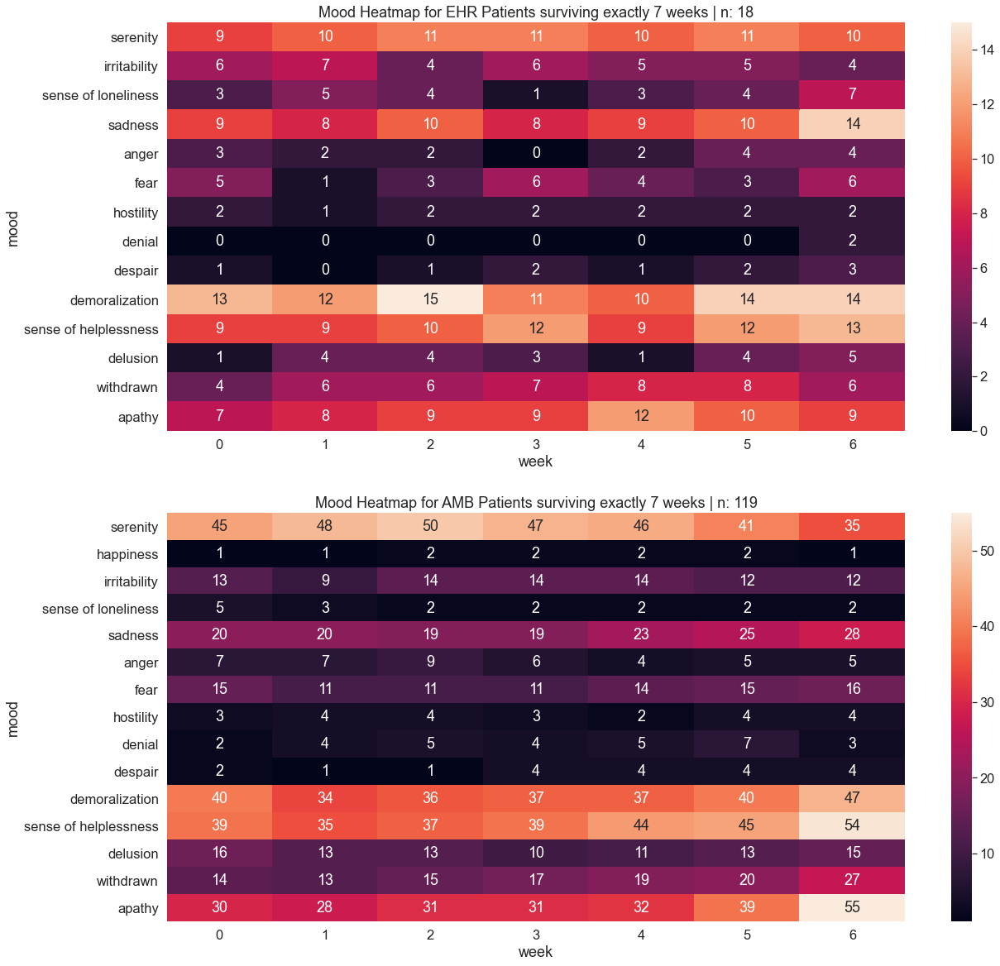

In [90]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 49]
df_ms = df_ms[df_ms['survival_time_days'] < 56]
df_ms = df_ms[df_ms['hos_week'] <= 6]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 7 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 7 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_7w_exact.png', bbox_inches='tight')
plt.show()

In [91]:
get_coeffs(df1, 6)

,0,1,2,3,4,5,6,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,
serenity,9.0,10.0,11.0,11.0,10.0,11.0,10.0,0.14,-0.14,1.00
irritability,6.0,7.0,4.0,6.0,5.0,5.0,4.0,-0.32,-0.01,-0.25
sense of loneliness,3.0,5.0,4.0,1.0,3.0,4.0,7.0,0.32,0.30,-1.46
sadness,9.0,8.0,10.0,8.0,9.0,10.0,14.0,0.64,0.31,-1.21
anger,3.0,2.0,2.0,0.0,2.0,4.0,4.0,0.25,0.27,-1.39
fear,5.0,1.0,3.0,6.0,4.0,3.0,6.0,0.29,0.12,-0.43
hostility,2.0,1.0,2.0,2.0,2.0,2.0,2.0,0.07,0.00,0.07
denial,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.21,0.12,-0.50
despair,1.0,0.0,1.0,2.0,1.0,2.0,3.0,0.36,0.07,-0.07


In [92]:
get_coeffs(df2, 6)

,0,1,2,3,4,5,6,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,
serenity,45,48,50,47,46,41,35,-1.71,-0.90,3.71
happiness,1,1,2,2,2,2,1,0.07,-0.12,0.79
irritability,13,9,14,14,14,12,12,0.11,-0.18,1.18
sense of loneliness,5,3,2,2,2,2,2,-0.39,0.18,-1.46
sadness,20,20,19,19,23,25,28,1.36,0.45,-1.36
anger,7,7,9,6,4,5,5,-0.54,-0.04,-0.32
fear,15,11,11,11,14,15,16,0.50,0.43,-2.07
hostility,3,4,4,3,2,4,4,0.04,0.06,-0.32
denial,2,4,5,4,5,7,3,0.32,-0.25,1.82


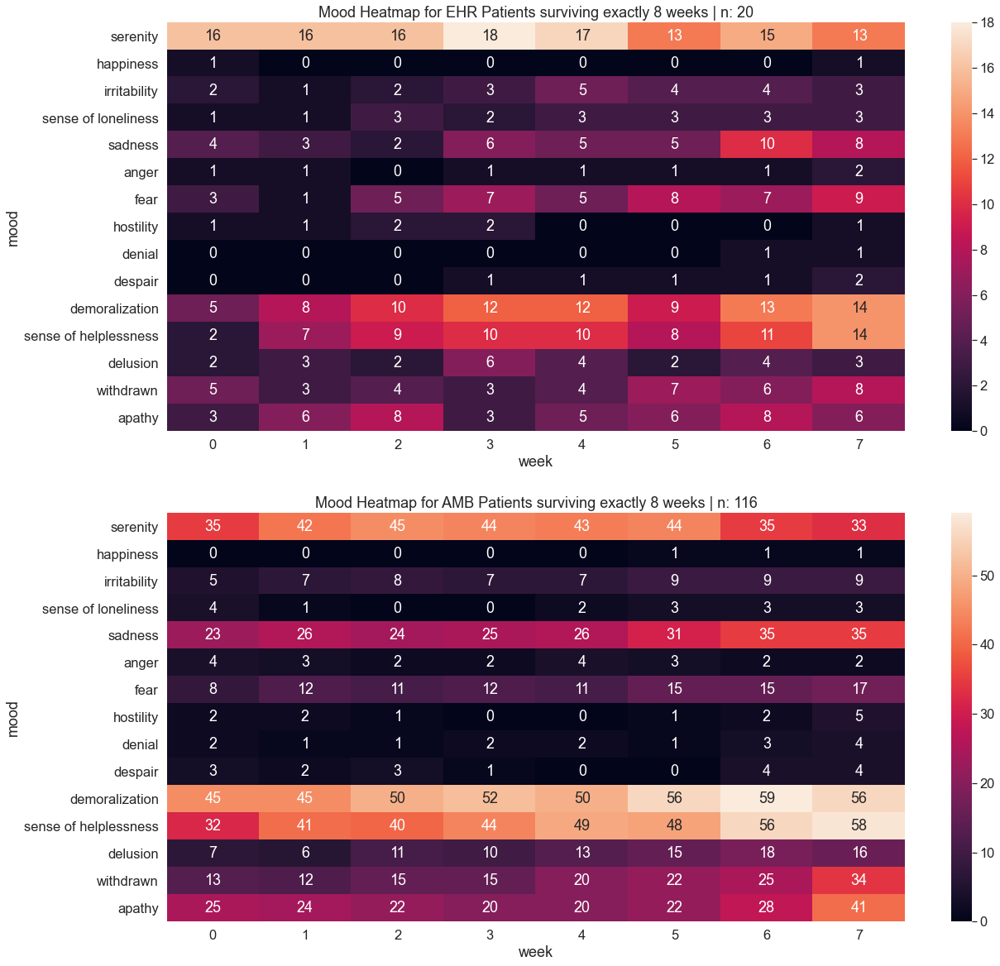

In [93]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 56]
df_ms = df_ms[df_ms['survival_time_days'] < 63]
df_ms = df_ms[df_ms['hos_week'] <= 7]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 8 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 8 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_8w_exact.png', bbox_inches='tight')
plt.show()

In [94]:
get_coeffs(df1, 7)

,0,1,2,3,4,5,6,7,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,
serenity,16.0,16.0,16.0,18.0,17.0,13.0,15.0,13.0,-0.43,-0.17,0.74
happiness,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.08,-0.58
irritability,2.0,1.0,2.0,3.0,5.0,4.0,4.0,3.0,0.36,-0.11,1.11
sense of loneliness,1.0,1.0,3.0,2.0,3.0,3.0,3.0,3.0,0.30,-0.07,0.76
sadness,4.0,3.0,2.0,6.0,5.0,5.0,10.0,8.0,0.85,0.12,-0.03
anger,1.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,0.12,0.06,-0.30
fear,3.0,1.0,5.0,7.0,5.0,8.0,7.0,9.0,0.94,-0.04,1.23
hostility,1.0,1.0,2.0,2.0,0.0,0.0,0.0,1.0,-0.15,-0.01,-0.11
denial,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.14,0.05,-0.19


In [95]:
get_coeffs(df2, 7)

,0,1,2,3,4,5,6,7,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,
serenity,35.0,42.0,45.0,44.0,43.0,44.0,35.0,33.0,-0.63,-0.89,5.58
happiness,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.18,0.03,-0.03
irritability,5.0,7.0,8.0,7.0,7.0,9.0,9.0,9.0,0.49,-0.04,0.78
sense of loneliness,4.0,1.0,0.0,0.0,2.0,3.0,3.0,3.0,0.17,0.20,-1.25
sadness,23.0,26.0,24.0,25.0,26.0,31.0,35.0,35.0,1.80,0.28,-0.16
anger,4.0,3.0,2.0,2.0,4.0,3.0,2.0,2.0,-0.17,0.01,-0.25
fear,8.0,12.0,11.0,12.0,11.0,15.0,15.0,17.0,1.06,0.05,0.68
hostility,2.0,2.0,1.0,0.0,0.0,1.0,2.0,5.0,0.25,0.28,-1.71
denial,2.0,1.0,1.0,2.0,2.0,1.0,3.0,4.0,0.29,0.12,-0.55


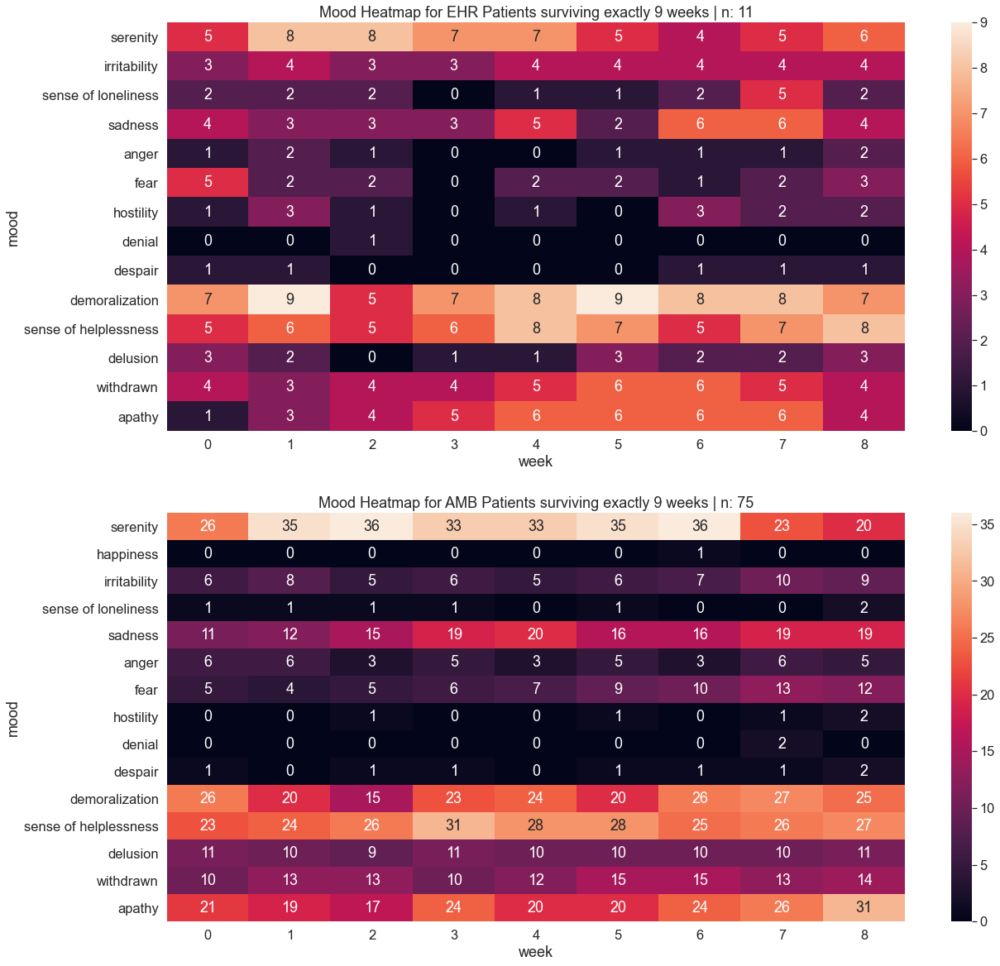

In [96]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 9 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 9 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_9w_exact.png', bbox_inches='tight')
plt.show()

In [97]:
get_coeffs(df1, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,5.0,8.0,8.0,7.0,7.0,5.0,4.0,5.0,6.0,-0.25,-0.04,0.10
irritability,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,0.12,-0.00,0.14
sense of loneliness,2.0,2.0,2.0,0.0,1.0,1.0,2.0,5.0,2.0,0.17,0.10,-0.63
sadness,4.0,3.0,3.0,3.0,5.0,2.0,6.0,6.0,4.0,0.23,0.03,-0.03
anger,1.0,2.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,0.03,0.08,-0.59
fear,5.0,2.0,2.0,0.0,2.0,2.0,1.0,2.0,3.0,-0.13,0.17,-1.47
hostility,1.0,3.0,1.0,0.0,1.0,0.0,3.0,2.0,2.0,0.08,0.07,-0.50
denial,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.03,-0.01,0.04
despair,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.03,0.07,-0.50


In [98]:
get_coeffs(df2, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,26.0,35.0,36.0,33.0,33.0,35.0,36.0,23.0,20.0,-0.97,-0.76,5.08
happiness,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.03,-0.01,0.10
irritability,6.0,8.0,5.0,6.0,5.0,6.0,7.0,10.0,9.0,0.37,0.16,-0.90
sense of loneliness,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,2.0,-0.02,0.05,-0.44
sadness,11.0,12.0,15.0,19.0,20.0,16.0,16.0,19.0,19.0,0.87,-0.20,2.48
anger,6.0,6.0,3.0,5.0,3.0,5.0,3.0,6.0,5.0,-0.07,0.12,-1.05
fear,5.0,4.0,5.0,6.0,7.0,9.0,10.0,13.0,12.0,1.13,0.09,0.44
hostility,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,0.17,0.04,-0.16
denial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.10,0.02,-0.02


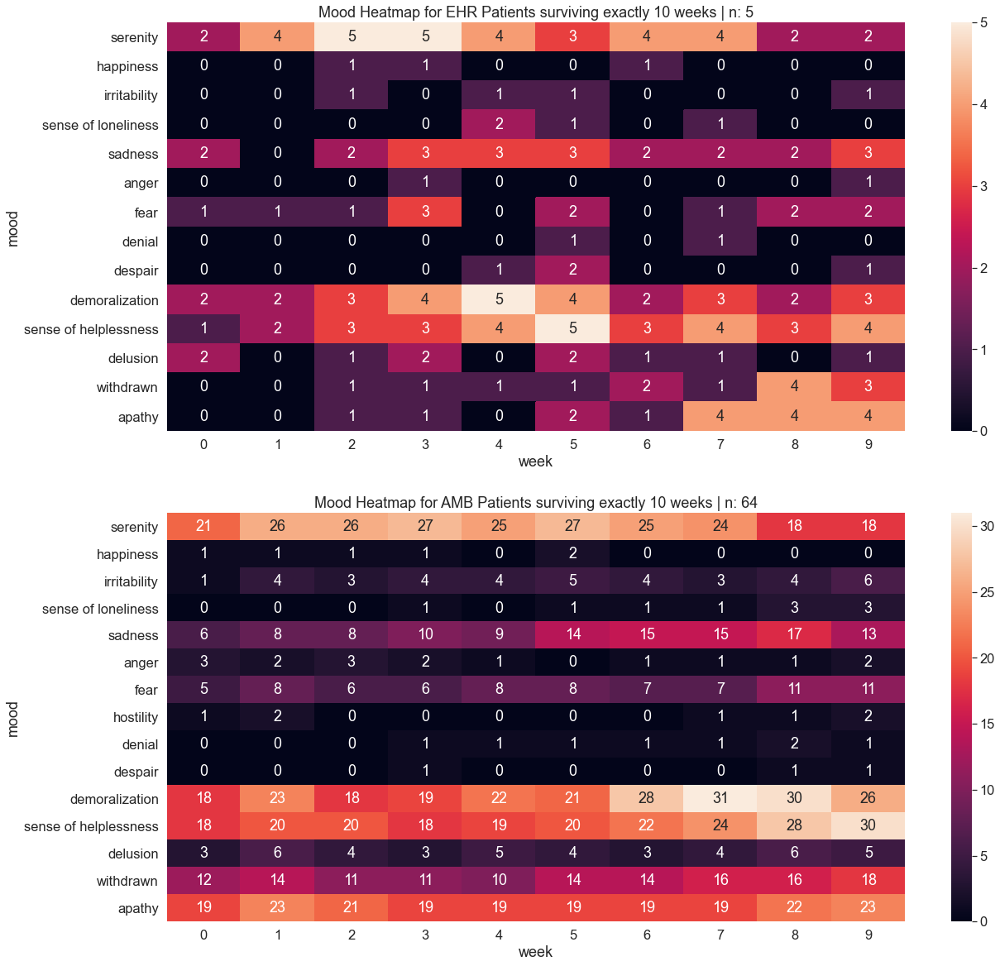

In [99]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 70]
df_ms = df_ms[df_ms['survival_time_days'] < 77]
df_ms = df_ms[df_ms['hos_week'] <= 9]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 10 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 10 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_10w_exact.png', bbox_inches='tight')
plt.show()

In [100]:
get_coeffs(df1, 9)

,0,1,2,3,4,5,6,7,8,9,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,
serenity,2.0,4.0,5.0,5.0,4.0,3.0,4.0,4.0,2.0,2.0,-0.14,-0.11,0.82
happiness,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.03,-0.03,0.21
irritability,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.02,-0.01,0.13
sense of loneliness,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.02,-0.05,0.47
sadness,2.0,0.0,2.0,3.0,3.0,3.0,2.0,2.0,2.0,3.0,0.12,-0.03,0.43
anger,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.04,0.01,-0.07
fear,1.0,1.0,1.0,3.0,0.0,2.0,0.0,1.0,2.0,2.0,0.05,0.02,-0.12
denial,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.04,-0.02,0.21
despair,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0.06,-0.02,0.27


In [101]:
get_coeffs(df2, 9)

,0,1,2,3,4,5,6,7,8,9,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,
serenity,21.0,26.0,26.0,27.0,25.0,27.0,25.0,24.0,18.0,18.0,-0.59,-0.35,2.55
happiness,1.0,1.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,-0.13,-0.02,0.00
irritability,1.0,4.0,3.0,4.0,4.0,5.0,4.0,3.0,4.0,6.0,0.28,-0.03,0.55
sense of loneliness,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,3.0,3.0,0.33,0.05,-0.12
sadness,6.0,8.0,8.0,10.0,9.0,14.0,15.0,15.0,17.0,13.0,1.10,-0.10,1.98
anger,3.0,2.0,3.0,2.0,1.0,0.0,1.0,1.0,1.0,2.0,-0.18,0.07,-0.83
fear,5.0,8.0,6.0,6.0,8.0,8.0,7.0,7.0,11.0,11.0,0.50,0.07,-0.11
hostility,1.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,0.04,0.09,-0.74
denial,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,0.17,-0.02,0.34


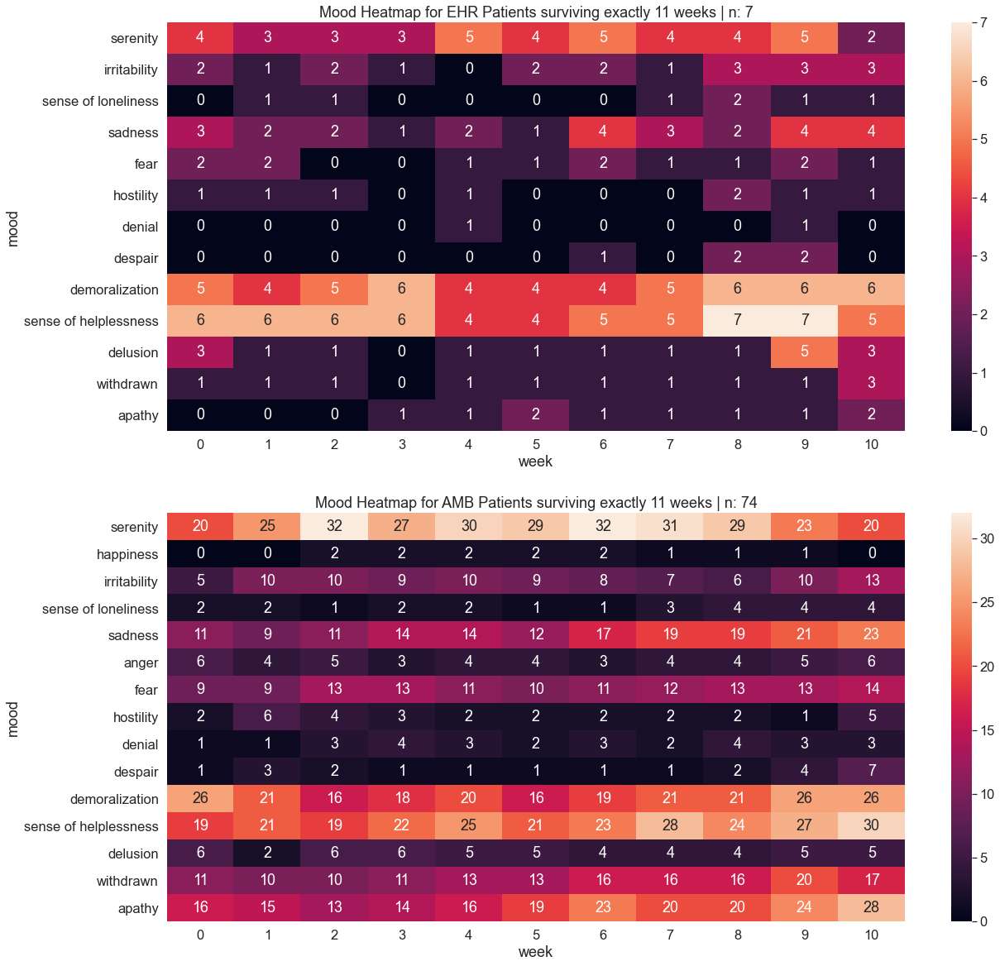

In [102]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 77]
df_ms = df_ms[df_ms['survival_time_days'] < 84]
df_ms = df_ms[df_ms['hos_week'] <= 10]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 11 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 11 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_11w_exact.png', bbox_inches='tight')
plt.show()

In [103]:
get_coeffs(df1, 10)

,0,1,2,3,4,5,6,7,8,9,10,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,
serenity,4.0,3.0,3.0,3.0,5.0,4.0,5.0,4.0,4.0,5.0,2.0,0.03,-0.05,0.51
irritability,2.0,1.0,2.0,1.0,0.0,2.0,2.0,1.0,3.0,3.0,3.0,0.16,0.05,-0.35
sense of loneliness,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.09,0.02,-0.12
sadness,3.0,2.0,2.0,1.0,2.0,1.0,4.0,3.0,2.0,4.0,4.0,0.17,0.06,-0.40
fear,2.0,2.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,0.01,0.03,-0.28
hostility,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2.0,1.0,1.0,0.02,0.03,-0.33
denial,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.03,-0.00,0.06
despair,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,0.0,0.14,0.00,0.12
demoralization,5.0,4.0,5.0,6.0,4.0,4.0,4.0,5.0,6.0,6.0,6.0,0.13,0.04,-0.29


In [104]:
get_coeffs(df2, 10)

,0,1,2,3,4,5,6,7,8,9,10,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,
serenity,20.0,25.0,32.0,27.0,30.0,29.0,32.0,31.0,29.0,23.0,20.0,-0.06,-0.43,4.24
happiness,0.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,0.0,-0.01,-0.08,0.82
irritability,5.0,10.0,10.0,9.0,10.0,9.0,8.0,7.0,6.0,10.0,13.0,0.20,0.03,-0.10
sense of loneliness,2.0,2.0,1.0,2.0,2.0,1.0,1.0,3.0,4.0,4.0,4.0,0.25,0.06,-0.37
sadness,11.0,9.0,11.0,14.0,14.0,12.0,17.0,19.0,19.0,21.0,23.0,1.32,0.07,0.58
anger,6.0,4.0,5.0,3.0,4.0,4.0,3.0,4.0,4.0,5.0,6.0,0.02,0.09,-0.91
fear,9.0,9.0,13.0,13.0,11.0,10.0,11.0,12.0,13.0,13.0,14.0,0.35,0.00,0.32
hostility,2.0,6.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,1.0,5.0,-0.12,0.06,-0.76
denial,1.0,1.0,3.0,4.0,3.0,2.0,3.0,2.0,4.0,3.0,3.0,0.15,-0.04,0.54


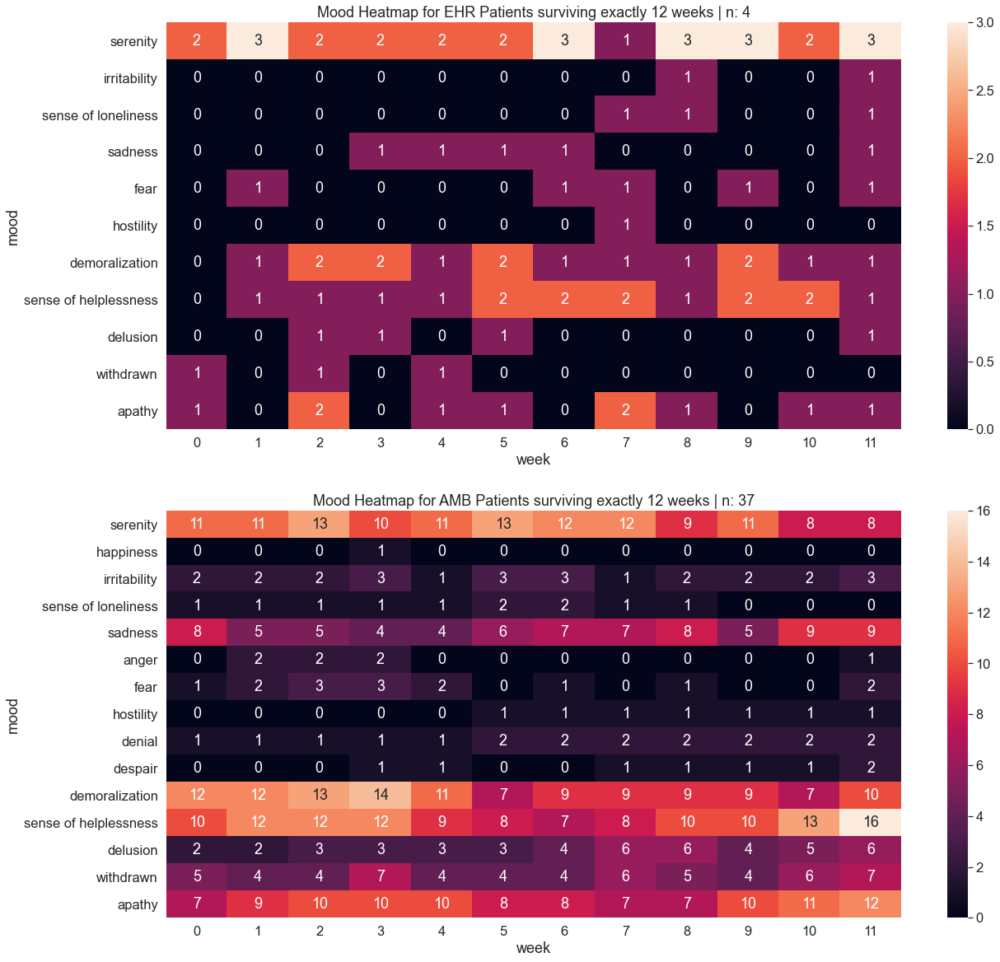

In [105]:
# heatmaps for patients surviving exactly x weeks split by EHRType
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_mw[df_mw['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['survival_time_days'] < 91]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df1 = df_ms[df_ms['EHRType'] == 'EHR']
df2 = df_ms[df_ms['EHRType'] == 'AMB']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'hostility', 'fear', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for EHR Patients surviving exactly 12 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for AMB Patients surviving exactly 12 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_ehr_12w_exact.png', bbox_inches='tight')
plt.show()

In [106]:
get_coeffs(df1, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,2.0,3.0,2.0,2.0,2.0,2.0,3.0,1.0,3.0,3.0,2.0,3.0,0.04,0.01,-0.12
irritability,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.06,0.01,-0.05
sense of loneliness,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.07,0.00,0.04
sadness,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.01,-0.02,0.18
fear,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.05,0.00,-0.00
hostility,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.01,-0.01,0.09
demoralization,0.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,0.02,-0.03,0.31
sense of helplessness,0.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,0.10,-0.03,0.46
delusion,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.01,0.00,-0.02


In [107]:
get_coeffs(df2, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,11.0,11.0,13.0,10.0,11.0,13.0,12.0,12.0,9.0,11.0,8.0,8.0,-0.27,-0.08,0.61
happiness,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.02,-0.00,0.03
irritability,2.0,2.0,2.0,3.0,1.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,0.02,0.01,-0.05
sense of loneliness,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,-0.09,-0.04,0.32
sadness,8.0,5.0,5.0,4.0,4.0,6.0,7.0,7.0,8.0,5.0,9.0,9.0,0.27,0.08,-0.60
anger,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.11,0.02,-0.31
fear,1.0,2.0,3.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,2.0,-0.15,0.01,-0.31
hostility,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.12,-0.01,0.22
denial,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12,-0.01,0.22


In [108]:
# heatmaps split by setting
df_set = pd.read_excel('./vidas_data/IDEHR-EHRType-OU.xlsx')
df_set = df_set.rename(columns={"UO (Setting)\n": 'Setting'})
df_set

,PatientID,IDEHR,EHRType,Setting
0,1,1,AMB,Valutazione
1,2,3,AMB,Valutazione
2,1,4,AMB,DayHospice
3,2,5,AMB,DayHospice
4,3,7,AMB,Valutazione
...,...,...,...,...
22922,60826,5428,EHR,Hospice
22923,60834,5429,EHR,Hospice
22924,60652,5430,EHR,Hospice
22925,60836,5431,EHR,Hospice


In [109]:
df_set.Setting.value_counts()

Valutazione             10835
Domicilio                7524
Hospice                  3356
DayHospice               1061
Hospice Pediatrico         78
Domicilio Pediatrico       55
Sportello DAT              11
Farmacia                    6
Consulenza Covid 19         1
Name: Setting, dtype: int64

In [110]:
# merge with df_mw
df_st = pd.merge(df_mw, df_set, on=['IDEHR', 'EHRType'])
df_st

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week,PatientID,Setting
0,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,3,30759,Hospice
1,1382,EHR,45.0,Palliative (Non-Malignant),serenity,3,30759,Hospice
2,1382,EHR,45.0,Palliative (Non-Malignant),serenity,4,30759,Hospice
3,1382,EHR,45.0,Palliative (Non-Malignant),withdrawn,4,30759,Hospice
4,1382,EHR,45.0,Palliative (Non-Malignant),apathy,4,30759,Hospice
...,...,...,...,...,...,...,...,...
65614,29399,AMB,5.0,Lung,sense of helplessness,0,59878,Domicilio
65615,29411,AMB,1.0,Lung,fear,0,59898,Domicilio
65616,29411,AMB,1.0,Lung,anger,0,59898,Domicilio
65617,29440,AMB,2.0,Lung,withdrawn,0,59909,Domicilio


In [111]:
df_st[['survival_time_days', 'Setting']].groupby(by='Setting').mean()

,survival_time_days
Setting,
Domicilio,136.326501
Domicilio Pediatrico,122.381443
Hospice,31.406769
Hospice Pediatrico,18.931034


In [112]:
df_st[['Setting', 'IDEHR', 'EHRType']].drop_duplicates().Setting.value_counts()

Domicilio               3433
Hospice                 1708
Domicilio Pediatrico       7
Hospice Pediatrico         6
Name: Setting, dtype: int64

In [113]:
plt.rcParams['figure.figsize'] = [20, 12]
matplotlib.rcParams.update({'font.size': 20})
sns.set(font_scale=1.5)

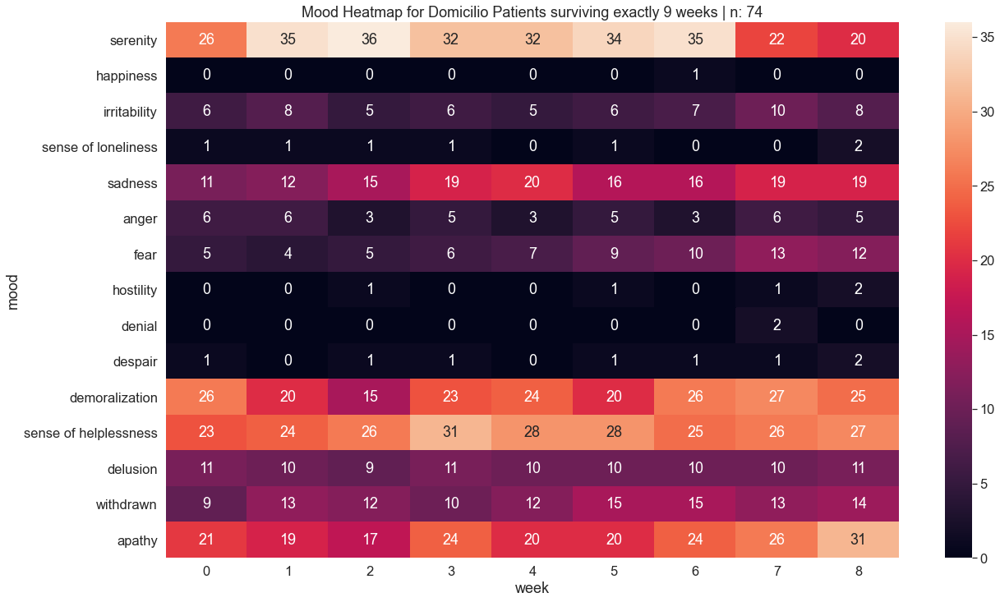

In [114]:
# heatmap for Domicilio for patients surviving exactly 9 weeks
setting = 'Domicilio'
df_ms = df_st[df_st['Setting'] == setting]
df_ms = df_ms[df_ms['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for ' + setting + ' Patients surviving exactly 9 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_' + setting + '_9w_exact.png', bbox_inches='tight')
plt.show()

In [115]:
get_coeffs(df_hm, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,26.0,35.0,36.0,32.0,32.0,34.0,35.0,22.0,20.0,-1.05,-0.70,4.52
happiness,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.03,-0.01,0.10
irritability,6.0,8.0,5.0,6.0,5.0,6.0,7.0,10.0,8.0,0.30,0.13,-0.72
sense of loneliness,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,2.0,-0.02,0.05,-0.44
sadness,11.0,12.0,15.0,19.0,20.0,16.0,16.0,19.0,19.0,0.87,-0.20,2.48
anger,6.0,6.0,3.0,5.0,3.0,5.0,3.0,6.0,5.0,-0.07,0.12,-1.05
fear,5.0,4.0,5.0,6.0,7.0,9.0,10.0,13.0,12.0,1.13,0.09,0.44
hostility,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,0.17,0.04,-0.16
denial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.10,0.02,-0.02


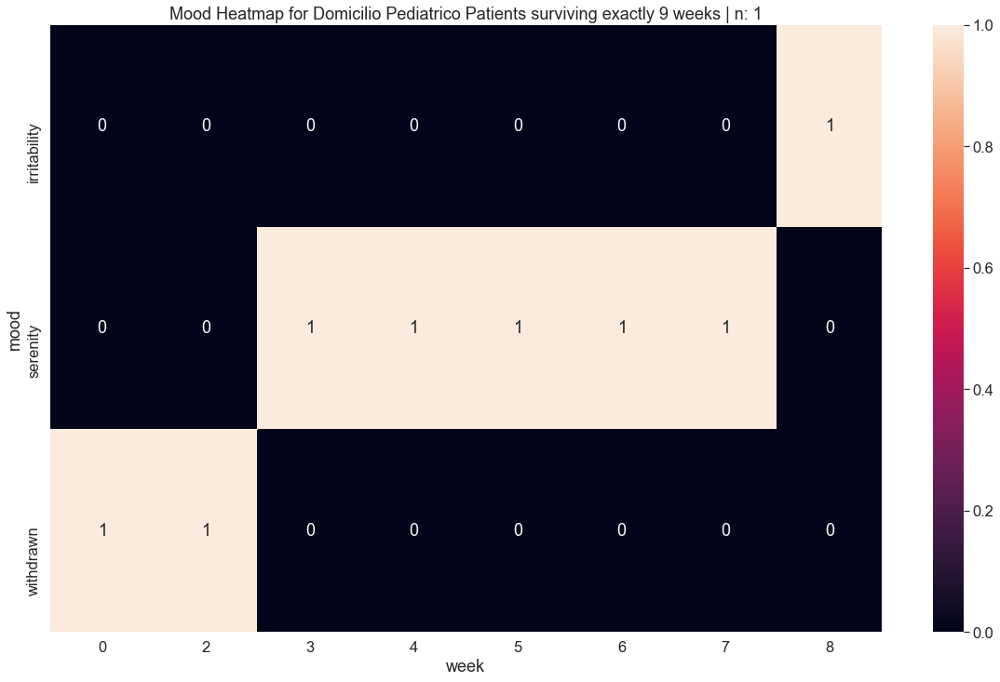

In [116]:
# heatmap for Domicilio for patients surviving exactly 9 weeks
setting = 'Domicilio Pediatrico'
df_ms = df_st[df_st['Setting'] == setting]
df_ms = df_ms[df_ms['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for ' + setting + ' Patients surviving exactly 9 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_' + setting + '_9w_exact.png', bbox_inches='tight')
plt.show()

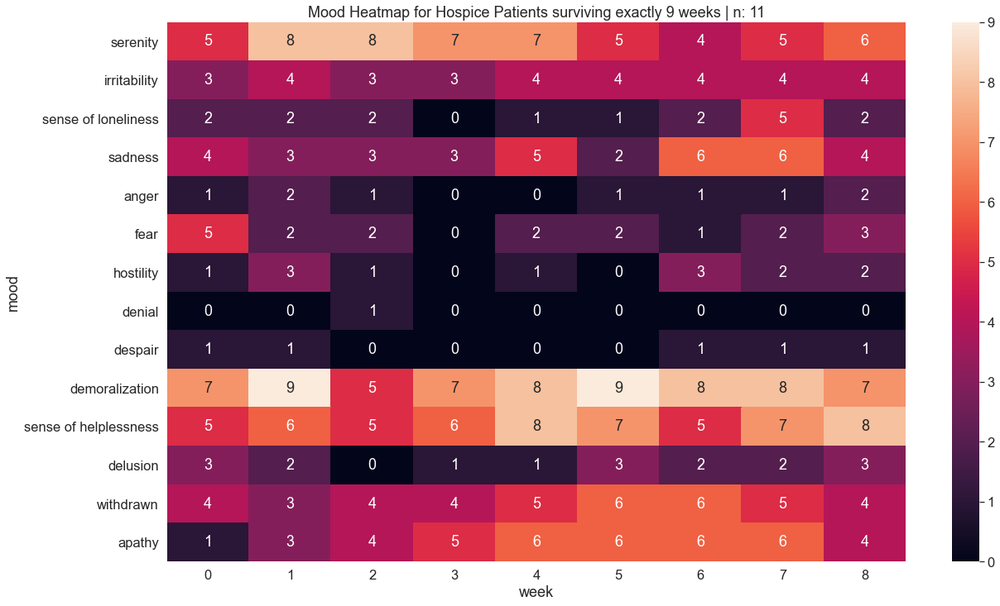

In [117]:
# heatmap for Hospice for patients surviving exactly 9 weeks
setting = 'Hospice'
df_ms = df_st[df_st['Setting'] == setting]
df_ms = df_ms[df_ms['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df_hm = df_ms[['mood_num', 'hos_week']].reset_index(drop=True)
df_hm = df_hm.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats.reverse()
df_hm['mood_num'] = pd.Categorical(df_hm['mood_num'], categories=cats, ordered=True)
df_hm = df_hm.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
ax = plt.axes()
sns.heatmap(df_hm, annot=True, fmt='g', ax=ax)
# ax.invert_xaxis()
ax.set_facecolor('xkcd:black')
ax.set_ylabel('mood')
ax.set_xlabel('week')
ax.set_title('Mood Heatmap for ' + setting + ' Patients surviving exactly 9 weeks | n: ' + str(len(df_ms.IDEHR.unique())))
plt.savefig('./graphs/mood/mood_' + setting + '_9w_exact.png', bbox_inches='tight')
plt.show()

In [118]:
get_coeffs(df_hm, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,5.0,8.0,8.0,7.0,7.0,5.0,4.0,5.0,6.0,-0.25,-0.04,0.10
irritability,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,0.12,-0.00,0.14
sense of loneliness,2.0,2.0,2.0,0.0,1.0,1.0,2.0,5.0,2.0,0.17,0.10,-0.63
sadness,4.0,3.0,3.0,3.0,5.0,2.0,6.0,6.0,4.0,0.23,0.03,-0.03
anger,1.0,2.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,0.03,0.08,-0.59
fear,5.0,2.0,2.0,0.0,2.0,2.0,1.0,2.0,3.0,-0.13,0.17,-1.47
hostility,1.0,3.0,1.0,0.0,1.0,0.0,3.0,2.0,2.0,0.08,0.07,-0.50
denial,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.03,-0.01,0.04
despair,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.03,0.07,-0.50


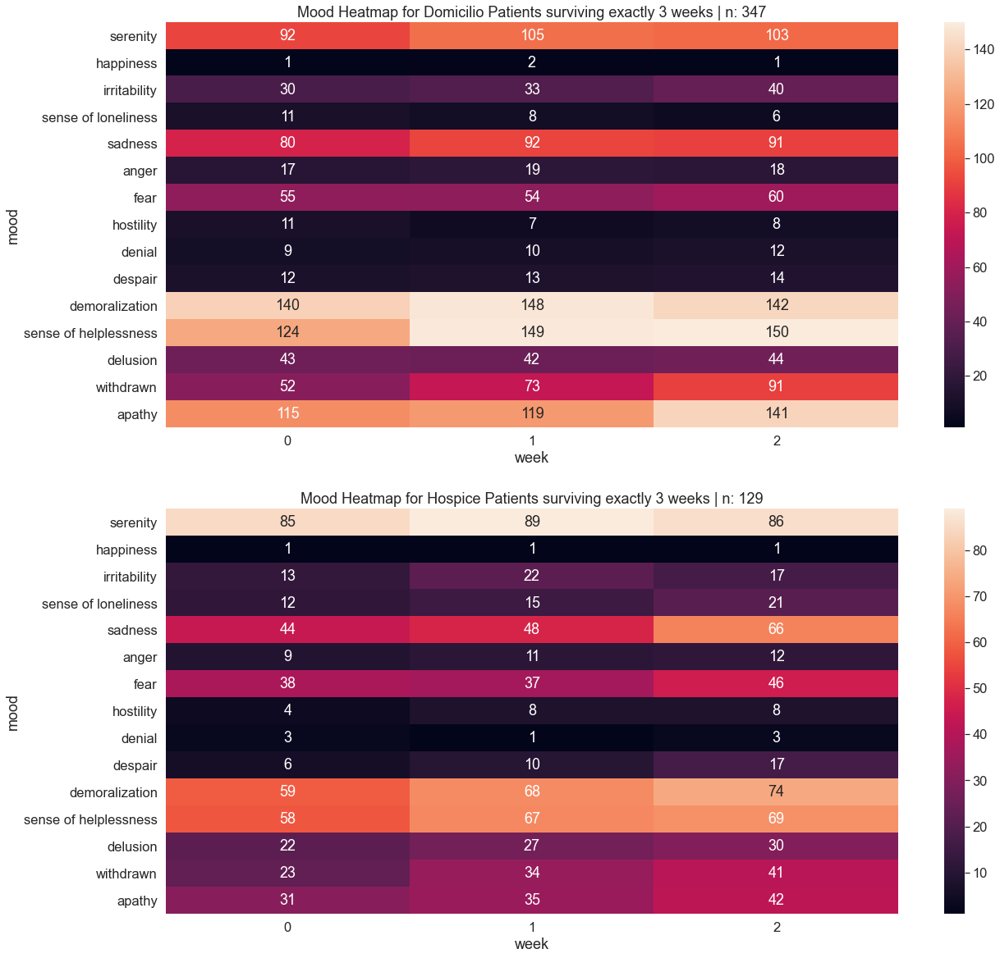

In [119]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['survival_time_days'] < 28]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 3 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 3 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_3w_exact.png', bbox_inches='tight')
plt.show()

In [120]:
get_coeffs(df1, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,92,105,103,5.5,-7.5,20.5
happiness,1,2,1,-0.0,-1.0,2.0
irritability,30,33,40,5.0,2.0,1.0
sense of loneliness,11,8,6,-2.5,0.5,-3.5
sadness,80,92,91,5.5,-6.5,18.5
anger,17,19,18,0.5,-1.5,3.5
fear,55,54,60,2.5,3.5,-4.5
hostility,11,7,8,-1.5,2.5,-6.5
denial,9,10,12,1.5,0.5,0.5


In [121]:
get_coeffs(df2, 2)

,0,1,2,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,
serenity,85,89,86,0.5,-3.5,7.5
happiness,1,1,1,0.0,0.0,-0.0
irritability,13,22,17,2.0,-7.0,16.0
sense of loneliness,12,15,21,4.5,1.5,1.5
sadness,44,48,66,11.0,7.0,-3.0
anger,9,11,12,1.5,-0.5,2.5
fear,38,37,46,4.0,5.0,-6.0
hostility,4,8,8,2.0,-2.0,6.0
denial,3,1,3,0.0,2.0,-4.0


In [122]:
df_ms = df_st[df_st['survival_time_days'] >= 21]
df_ms = df_ms[df_ms['survival_time_days'] < 28]
df_ms = df_ms[df_ms['hos_week'] <= 2]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
df1

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week,PatientID,Setting
10272,3272,AMB,23.0,GI Tract,serenity,2,30861,Domicilio
10273,3272,AMB,23.0,GI Tract,demoralization,2,30861,Domicilio
10274,3272,AMB,23.0,GI Tract,sense of helplessness,2,30861,Domicilio
10275,3272,AMB,23.0,GI Tract,sadness,2,30861,Domicilio
11066,3392,AMB,22.0,Lymphoma,withdrawn,1,30899,Domicilio
...,...,...,...,...,...,...,...,...
65481,28906,AMB,26.0,Breast,apathy,0,59712,Domicilio
65482,28906,AMB,26.0,Breast,apathy,1,59712,Domicilio
65483,28906,AMB,26.0,Breast,demoralization,1,59712,Domicilio
65484,28906,AMB,26.0,Breast,demoralization,2,59712,Domicilio


In [123]:
df2

,IDEHR,EHRType,survival_time_days,Diagnosis,mood_num,hos_week,PatientID,Setting
51,1423,EHR,26.0,Palliative (Non-Malignant),happiness,0,30792,Hospice
52,1423,EHR,26.0,Palliative (Non-Malignant),serenity,0,30792,Hospice
53,1423,EHR,26.0,Palliative (Non-Malignant),happiness,1,30792,Hospice
54,1423,EHR,26.0,Palliative (Non-Malignant),serenity,1,30792,Hospice
55,1423,EHR,26.0,Palliative (Non-Malignant),happiness,2,30792,Hospice
...,...,...,...,...,...,...,...,...
19045,5242,EHR,24.0,Lung,demoralization,2,59778,Hospice
19046,5242,EHR,24.0,Lung,sadness,2,59778,Hospice
19047,5242,EHR,24.0,Lung,NaN,2,59778,Hospice
19048,5242,EHR,24.0,Lung,fear,2,59778,Hospice


In [124]:
df1.hos_week.value_counts()

2    921
1    874
0    792
Name: hos_week, dtype: int64

In [125]:
df1.Setting.unique()

array(['Domicilio'], dtype=object)

In [126]:
df2.hos_week.value_counts()

2    573
1    495
0    431
Name: hos_week, dtype: int64

In [127]:
df2.Setting.unique()

array(['Hospice'], dtype=object)

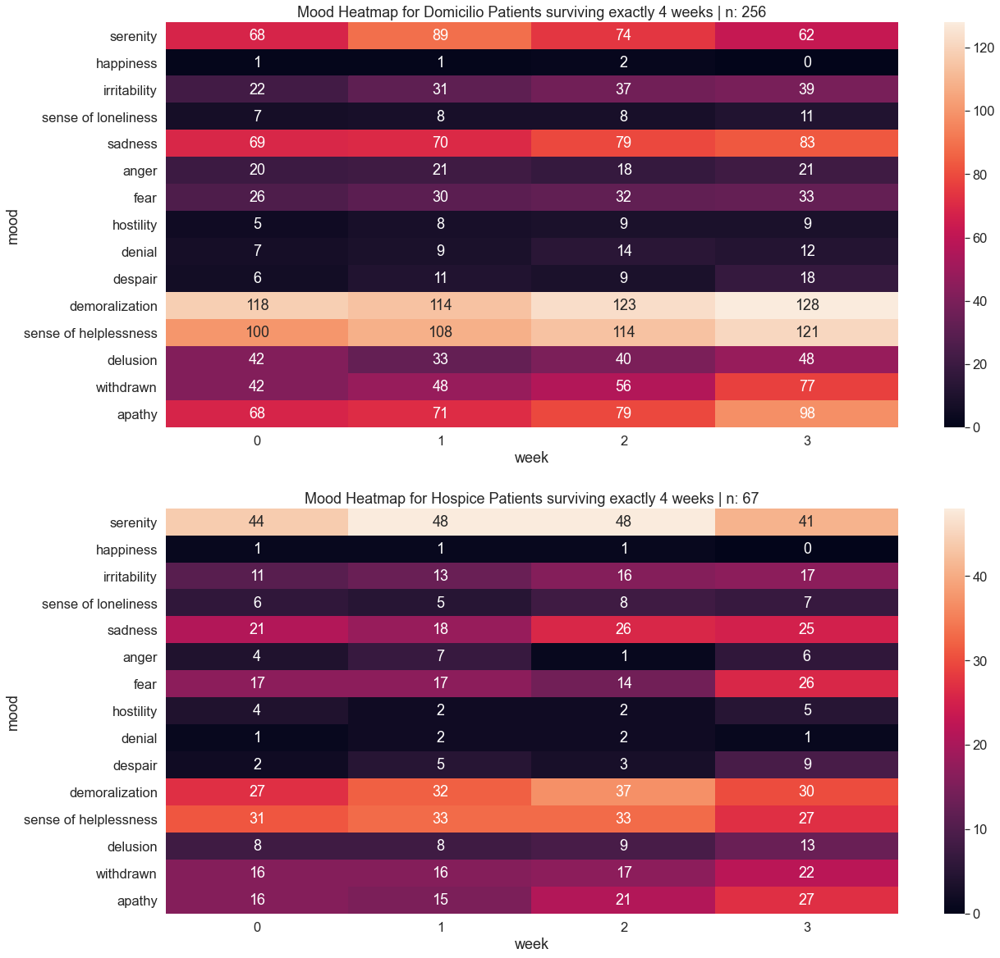

In [128]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 28]
df_ms = df_ms[df_ms['survival_time_days'] < 35]
df_ms = df_ms[df_ms['hos_week'] <= 3]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 4 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 4 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_4w_exact.png', bbox_inches='tight')
plt.show()

In [129]:
get_coeffs(df1, 3)

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,68.0,89.0,74.0,62.0,-3.3,-8.25,21.45
happiness,1.0,1.0,2.0,0.0,-0.2,-0.50,1.30
irritability,22.0,31.0,37.0,39.0,5.7,-1.75,10.95
sense of loneliness,7.0,8.0,8.0,11.0,1.2,0.50,-0.30
sadness,69.0,70.0,79.0,83.0,5.1,0.75,2.85
anger,20.0,21.0,18.0,21.0,-0.0,0.50,-1.50
fear,26.0,30.0,32.0,33.0,2.3,-0.75,4.55
hostility,5.0,8.0,9.0,9.0,1.3,-0.75,3.55
denial,7.0,9.0,14.0,12.0,2.0,-1.00,5.00


In [130]:
get_coeffs(df2, 3)

,0,1,2,3,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,
serenity,44.0,48.0,48.0,41.0,-0.9,-2.75,7.35
happiness,1.0,1.0,1.0,0.0,-0.3,-0.25,0.45
irritability,11.0,13.0,16.0,17.0,2.1,-0.25,2.85
sense of loneliness,6.0,5.0,8.0,7.0,0.6,-0.00,0.60
sadness,21.0,18.0,26.0,25.0,2.0,0.50,0.50
anger,4.0,7.0,1.0,6.0,-0.0,0.50,-1.50
fear,17.0,17.0,14.0,26.0,2.4,3.00,-6.60
hostility,4.0,2.0,2.0,5.0,0.3,1.25,-3.45
denial,1.0,2.0,2.0,1.0,-0.0,-0.50,1.50


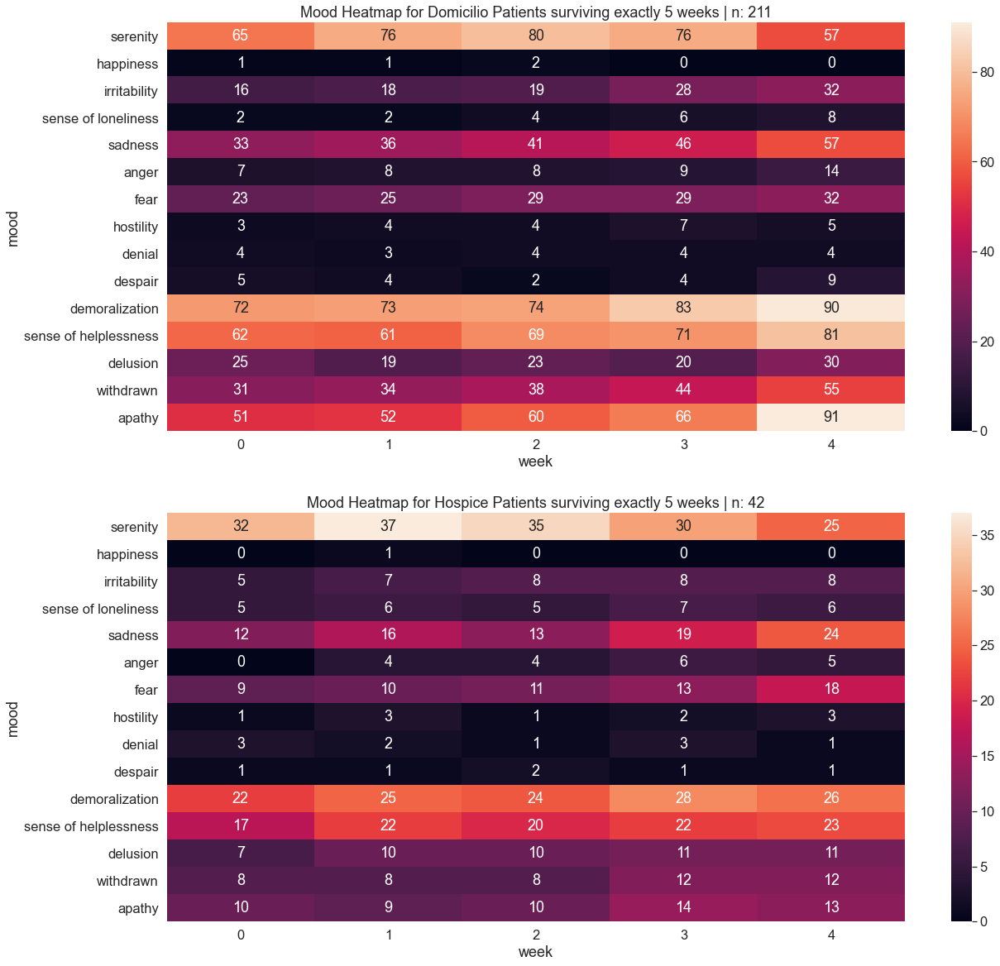

In [131]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 35]
df_ms = df_ms[df_ms['survival_time_days'] < 42]
df_ms = df_ms[df_ms['hos_week'] <= 4]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 5 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 5 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_5w_exact.png', bbox_inches='tight')
plt.show()

In [132]:
get_coeffs(df1, 4)

,0,1,2,3,4,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,
serenity,65.0,76.0,80.0,76.0,57.0,-1.6,-4.86,17.83
happiness,1.0,1.0,2.0,0.0,0.0,-0.3,-0.21,0.56
irritability,16.0,18.0,19.0,28.0,32.0,4.2,0.86,0.77
sense of loneliness,2.0,2.0,4.0,6.0,8.0,1.6,0.29,0.46
sadness,33.0,36.0,41.0,46.0,57.0,5.8,1.14,1.23
anger,7.0,8.0,8.0,9.0,14.0,1.5,0.64,-1.07
fear,23.0,25.0,29.0,29.0,32.0,2.2,-0.14,2.77
hostility,3.0,4.0,4.0,7.0,5.0,0.7,-0.21,1.56
denial,4.0,3.0,4.0,4.0,4.0,0.1,0.07,-0.19


In [133]:
get_coeffs(df2, 4)

,0,1,2,3,4,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,
serenity,32.0,37.0,35.0,30.0,25.0,-2.1,-1.64,4.47
happiness,0.0,1.0,0.0,0.0,0.0,-0.1,-0.07,0.19
irritability,5.0,7.0,8.0,8.0,8.0,0.7,-0.36,2.13
sense of loneliness,5.0,6.0,5.0,7.0,6.0,0.3,-0.07,0.59
sadness,12.0,16.0,13.0,19.0,24.0,2.7,0.79,-0.44
anger,0.0,4.0,4.0,6.0,5.0,1.2,-0.57,3.49
fear,9.0,10.0,11.0,13.0,18.0,2.1,0.64,-0.47
hostility,1.0,3.0,1.0,2.0,3.0,0.3,0.07,0.01
denial,3.0,2.0,1.0,3.0,1.0,-0.3,0.07,-0.59


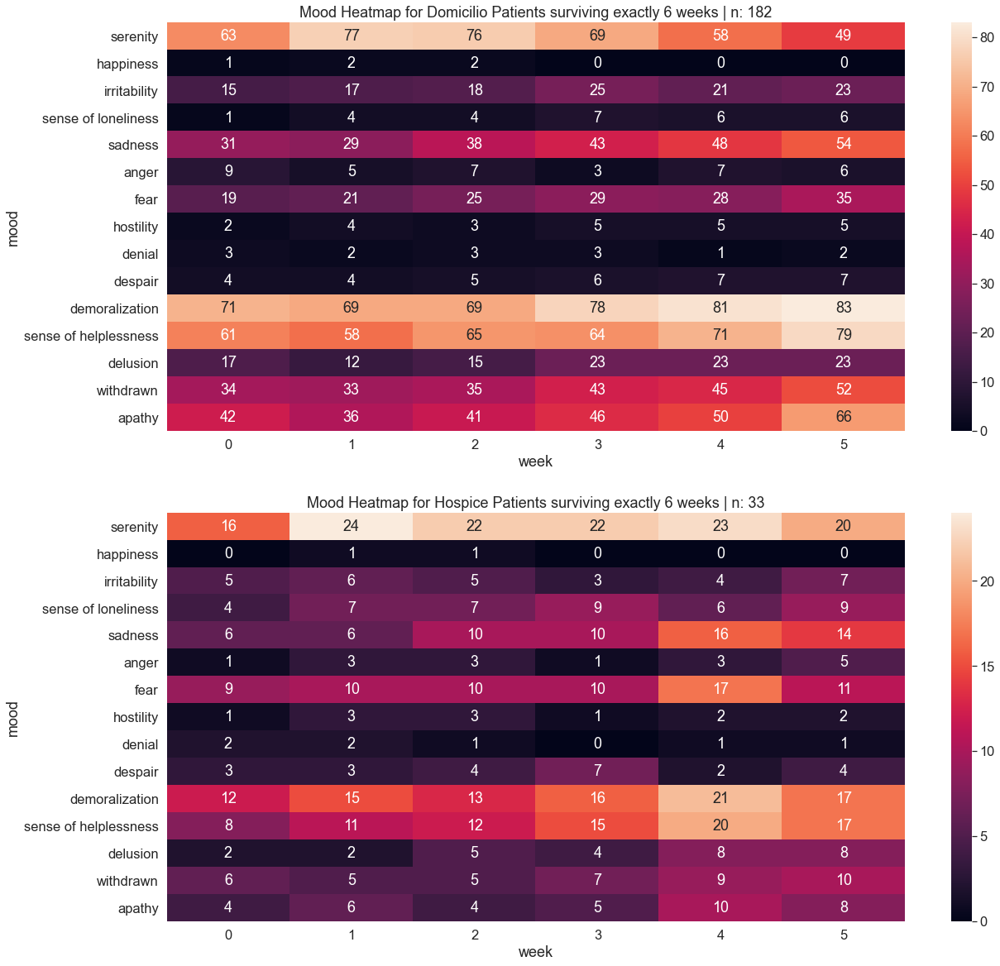

In [134]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 42]
df_ms = df_ms[df_ms['survival_time_days'] < 49]
df_ms = df_ms[df_ms['hos_week'] <= 5]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 6 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 6 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_6w_exact.png', bbox_inches='tight')
plt.show()

In [135]:
get_coeffs(df1, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,63.0,77.0,76.0,69.0,58.0,49.0,-3.83,-2.77,10.01
happiness,1.0,2.0,2.0,0.0,0.0,0.0,-0.37,-0.09,0.08
irritability,15.0,17.0,18.0,25.0,21.0,23.0,1.69,-0.36,3.47
sense of loneliness,1.0,4.0,4.0,7.0,6.0,6.0,0.97,-0.34,2.67
sadness,31.0,29.0,38.0,43.0,48.0,54.0,5.06,0.43,2.91
anger,9.0,5.0,7.0,3.0,7.0,6.0,-0.37,0.41,-2.42
fear,19.0,21.0,25.0,29.0,28.0,35.0,3.00,0.09,2.55
hostility,2.0,4.0,3.0,5.0,5.0,5.0,0.57,-0.11,1.11
denial,3.0,2.0,3.0,3.0,1.0,2.0,-0.23,-0.04,-0.05


In [136]:
get_coeffs(df2, 5)

,0,1,2,3,4,5,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,
serenity,16.0,24.0,22.0,22.0,23.0,20.0,0.49,-0.77,4.33
happiness,0.0,1.0,1.0,0.0,0.0,0.0,-0.11,-0.09,0.33
irritability,5.0,6.0,5.0,3.0,4.0,7.0,0.06,0.32,-1.55
sense of loneliness,4.0,7.0,7.0,9.0,6.0,9.0,0.69,-0.21,1.76
sadness,6.0,6.0,10.0,10.0,16.0,14.0,2.00,-0.04,2.18
anger,1.0,3.0,3.0,1.0,3.0,5.0,0.51,0.14,-0.20
fear,9.0,10.0,10.0,10.0,17.0,11.0,0.89,-0.12,1.51
hostility,1.0,3.0,3.0,1.0,2.0,2.0,-0.00,-0.11,0.54
denial,2.0,2.0,1.0,0.0,1.0,1.0,-0.26,0.14,-0.97


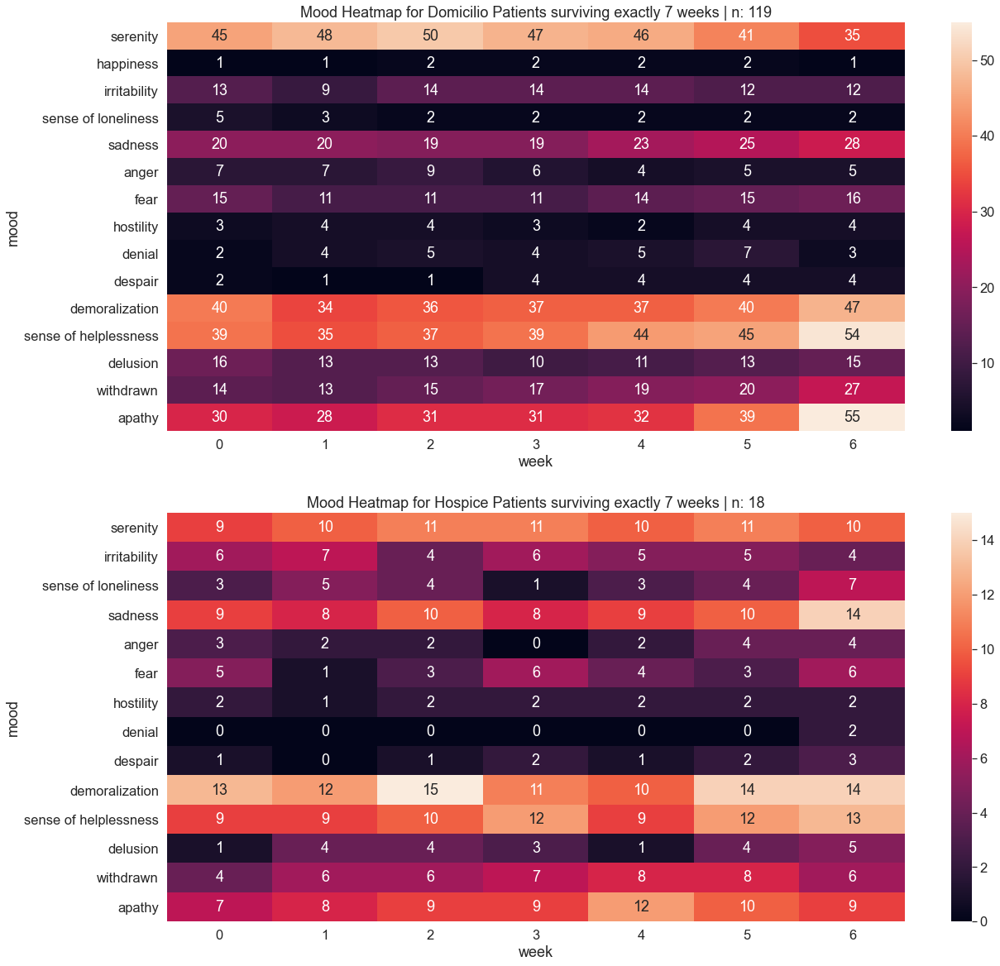

In [137]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 49]
df_ms = df_ms[df_ms['survival_time_days'] < 56]
df_ms = df_ms[df_ms['hos_week'] <= 6]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 7 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 7 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_7w_exact.png', bbox_inches='tight')
plt.show()

In [138]:
get_coeffs(df1, 6)

,0,1,2,3,4,5,6,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,
serenity,45,48,50,47,46,41,35,-1.71,-0.90,3.71
happiness,1,1,2,2,2,2,1,0.07,-0.12,0.79
irritability,13,9,14,14,14,12,12,0.11,-0.18,1.18
sense of loneliness,5,3,2,2,2,2,2,-0.39,0.18,-1.46
sadness,20,20,19,19,23,25,28,1.36,0.45,-1.36
anger,7,7,9,6,4,5,5,-0.54,-0.04,-0.32
fear,15,11,11,11,14,15,16,0.50,0.43,-2.07
hostility,3,4,4,3,2,4,4,0.04,0.06,-0.32
denial,2,4,5,4,5,7,3,0.32,-0.25,1.82


In [139]:
get_coeffs(df2, 6)

,0,1,2,3,4,5,6,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,
serenity,9.0,10.0,11.0,11.0,10.0,11.0,10.0,0.14,-0.14,1.00
irritability,6.0,7.0,4.0,6.0,5.0,5.0,4.0,-0.32,-0.01,-0.25
sense of loneliness,3.0,5.0,4.0,1.0,3.0,4.0,7.0,0.32,0.30,-1.46
sadness,9.0,8.0,10.0,8.0,9.0,10.0,14.0,0.64,0.31,-1.21
anger,3.0,2.0,2.0,0.0,2.0,4.0,4.0,0.25,0.27,-1.39
fear,5.0,1.0,3.0,6.0,4.0,3.0,6.0,0.29,0.12,-0.43
hostility,2.0,1.0,2.0,2.0,2.0,2.0,2.0,0.07,0.00,0.07
denial,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.21,0.12,-0.50
despair,1.0,0.0,1.0,2.0,1.0,2.0,3.0,0.36,0.07,-0.07


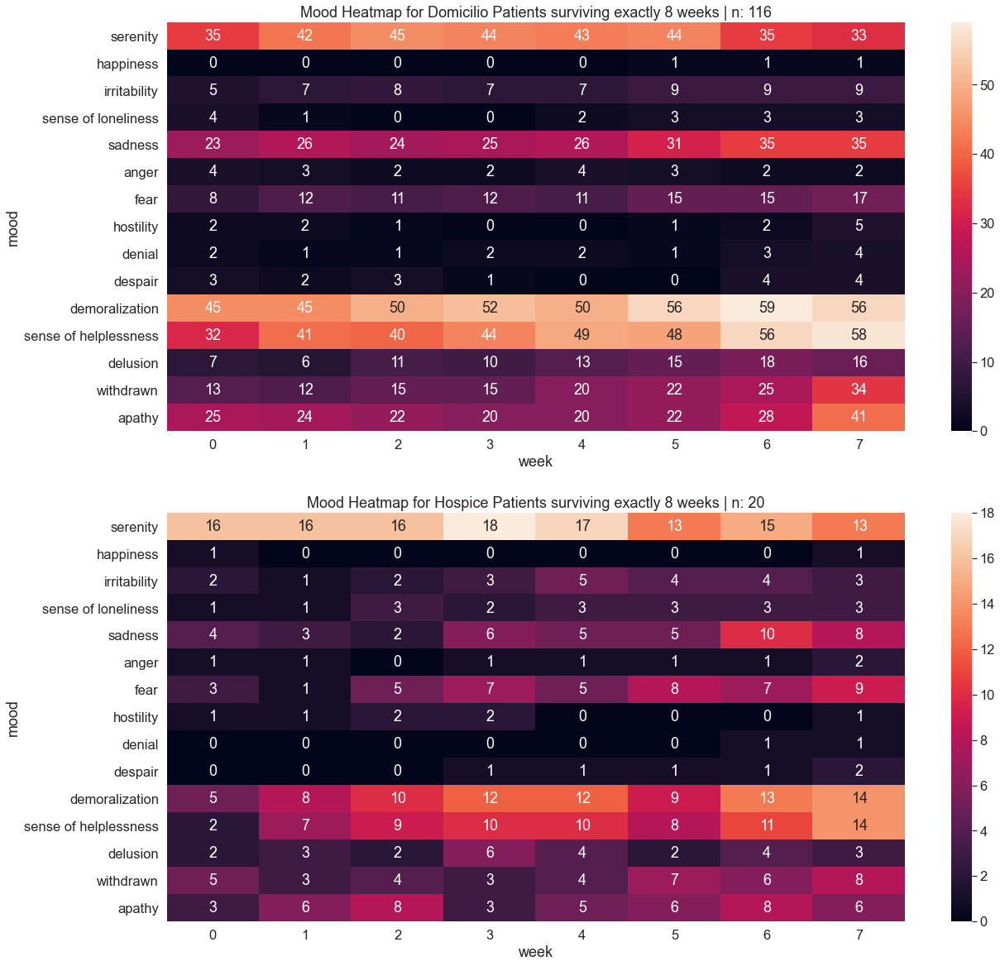

In [140]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 56]
df_ms = df_ms[df_ms['survival_time_days'] < 63]
df_ms = df_ms[df_ms['hos_week'] <= 7]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 8 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 8 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_8w_exact.png', bbox_inches='tight')
plt.show()

In [141]:
get_coeffs(df1, 7)

,0,1,2,3,4,5,6,7,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,
serenity,35.0,42.0,45.0,44.0,43.0,44.0,35.0,33.0,-0.63,-0.89,5.58
happiness,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.18,0.03,-0.03
irritability,5.0,7.0,8.0,7.0,7.0,9.0,9.0,9.0,0.49,-0.04,0.78
sense of loneliness,4.0,1.0,0.0,0.0,2.0,3.0,3.0,3.0,0.17,0.20,-1.25
sadness,23.0,26.0,24.0,25.0,26.0,31.0,35.0,35.0,1.80,0.28,-0.16
anger,4.0,3.0,2.0,2.0,4.0,3.0,2.0,2.0,-0.17,0.01,-0.25
fear,8.0,12.0,11.0,12.0,11.0,15.0,15.0,17.0,1.06,0.05,0.68
hostility,2.0,2.0,1.0,0.0,0.0,1.0,2.0,5.0,0.25,0.28,-1.71
denial,2.0,1.0,1.0,2.0,2.0,1.0,3.0,4.0,0.29,0.12,-0.55


In [142]:
get_coeffs(df2, 7)

,0,1,2,3,4,5,6,7,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,
serenity,16.0,16.0,16.0,18.0,17.0,13.0,15.0,13.0,-0.43,-0.17,0.74
happiness,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.08,-0.58
irritability,2.0,1.0,2.0,3.0,5.0,4.0,4.0,3.0,0.36,-0.11,1.11
sense of loneliness,1.0,1.0,3.0,2.0,3.0,3.0,3.0,3.0,0.30,-0.07,0.76
sadness,4.0,3.0,2.0,6.0,5.0,5.0,10.0,8.0,0.85,0.12,-0.03
anger,1.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,0.12,0.06,-0.30
fear,3.0,1.0,5.0,7.0,5.0,8.0,7.0,9.0,0.94,-0.04,1.23
hostility,1.0,1.0,2.0,2.0,0.0,0.0,0.0,1.0,-0.15,-0.01,-0.11
denial,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.14,0.05,-0.19


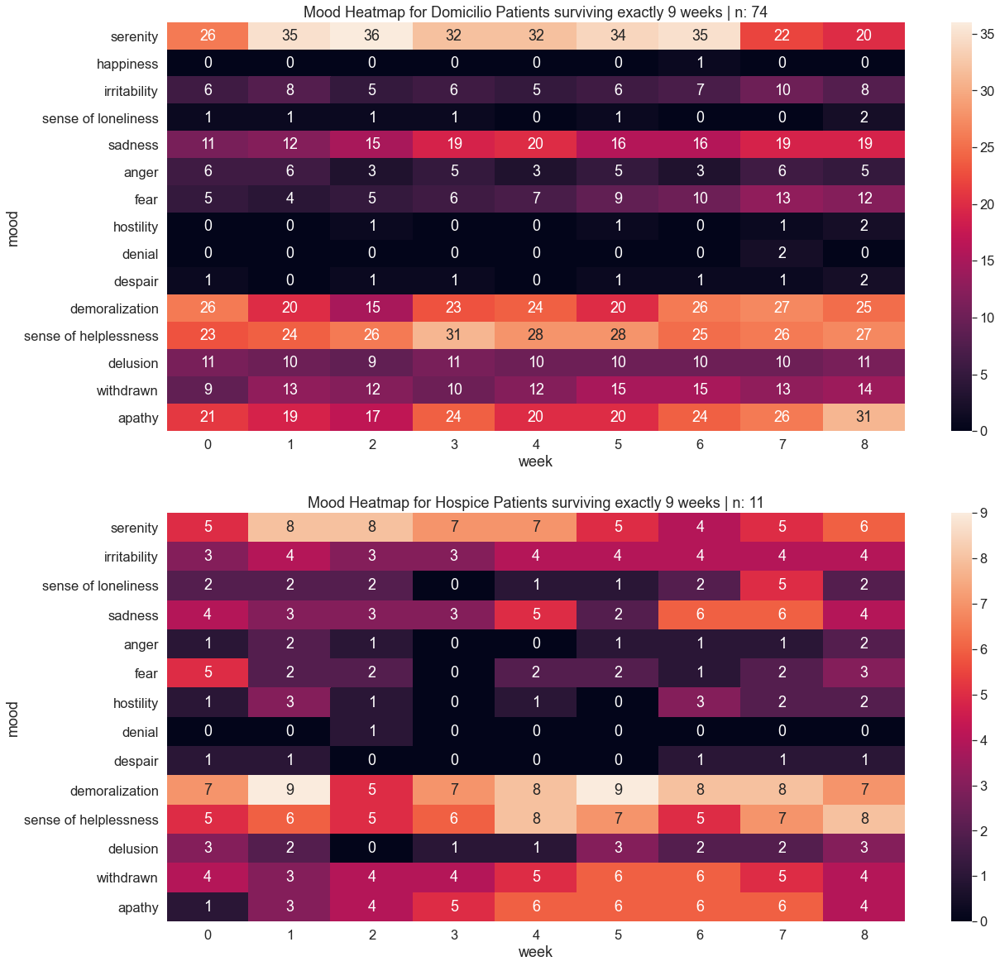

In [143]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 63]
df_ms = df_ms[df_ms['survival_time_days'] < 70]
df_ms = df_ms[df_ms['hos_week'] <= 8]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 9 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 9 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_9w_exact.png', bbox_inches='tight')
plt.show()

In [144]:
get_coeffs(df1, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,26.0,35.0,36.0,32.0,32.0,34.0,35.0,22.0,20.0,-1.05,-0.70,4.52
happiness,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.03,-0.01,0.10
irritability,6.0,8.0,5.0,6.0,5.0,6.0,7.0,10.0,8.0,0.30,0.13,-0.72
sense of loneliness,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,2.0,-0.02,0.05,-0.44
sadness,11.0,12.0,15.0,19.0,20.0,16.0,16.0,19.0,19.0,0.87,-0.20,2.48
anger,6.0,6.0,3.0,5.0,3.0,5.0,3.0,6.0,5.0,-0.07,0.12,-1.05
fear,5.0,4.0,5.0,6.0,7.0,9.0,10.0,13.0,12.0,1.13,0.09,0.44
hostility,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,0.17,0.04,-0.16
denial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.10,0.02,-0.02


In [145]:
get_coeffs(df2, 8)

,0,1,2,3,4,5,6,7,8,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,
serenity,5.0,8.0,8.0,7.0,7.0,5.0,4.0,5.0,6.0,-0.25,-0.04,0.10
irritability,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,0.12,-0.00,0.14
sense of loneliness,2.0,2.0,2.0,0.0,1.0,1.0,2.0,5.0,2.0,0.17,0.10,-0.63
sadness,4.0,3.0,3.0,3.0,5.0,2.0,6.0,6.0,4.0,0.23,0.03,-0.03
anger,1.0,2.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,0.03,0.08,-0.59
fear,5.0,2.0,2.0,0.0,2.0,2.0,1.0,2.0,3.0,-0.13,0.17,-1.47
hostility,1.0,3.0,1.0,0.0,1.0,0.0,3.0,2.0,2.0,0.08,0.07,-0.50
denial,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.03,-0.01,0.04
despair,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.03,0.07,-0.50


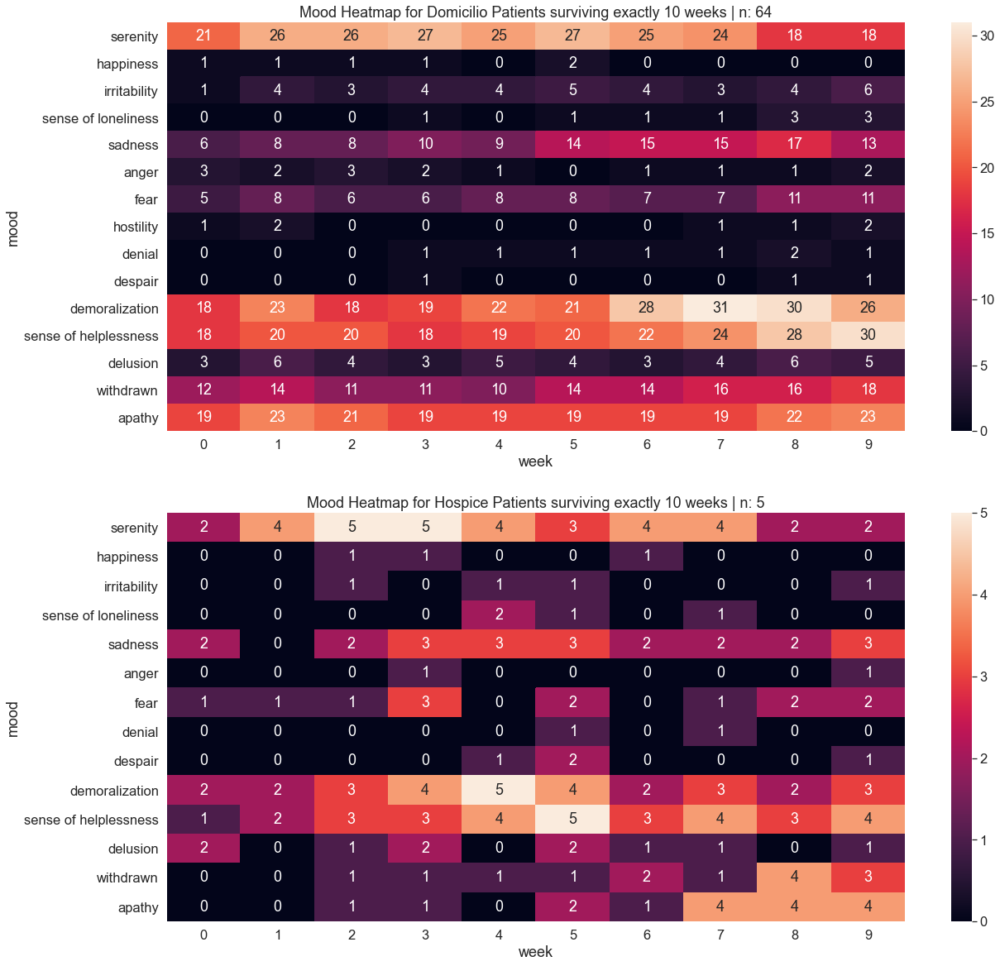

In [146]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 70]
df_ms = df_ms[df_ms['survival_time_days'] < 77]
df_ms = df_ms[df_ms['hos_week'] <= 9]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 10 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 10 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_10w_exact.png', bbox_inches='tight')
plt.show()

In [147]:
get_coeffs(df1, 9)

,0,1,2,3,4,5,6,7,8,9,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,
serenity,21.0,26.0,26.0,27.0,25.0,27.0,25.0,24.0,18.0,18.0,-0.59,-0.35,2.55
happiness,1.0,1.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,-0.13,-0.02,0.00
irritability,1.0,4.0,3.0,4.0,4.0,5.0,4.0,3.0,4.0,6.0,0.28,-0.03,0.55
sense of loneliness,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,3.0,3.0,0.33,0.05,-0.12
sadness,6.0,8.0,8.0,10.0,9.0,14.0,15.0,15.0,17.0,13.0,1.10,-0.10,1.98
anger,3.0,2.0,3.0,2.0,1.0,0.0,1.0,1.0,1.0,2.0,-0.18,0.07,-0.83
fear,5.0,8.0,6.0,6.0,8.0,8.0,7.0,7.0,11.0,11.0,0.50,0.07,-0.11
hostility,1.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,0.04,0.09,-0.74
denial,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,0.17,-0.02,0.34


In [148]:
get_coeffs(df2, 9)

,0,1,2,3,4,5,6,7,8,9,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,
serenity,2.0,4.0,5.0,5.0,4.0,3.0,4.0,4.0,2.0,2.0,-0.14,-0.11,0.82
happiness,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.03,-0.03,0.21
irritability,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.02,-0.01,0.13
sense of loneliness,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.02,-0.05,0.47
sadness,2.0,0.0,2.0,3.0,3.0,3.0,2.0,2.0,2.0,3.0,0.12,-0.03,0.43
anger,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.04,0.01,-0.07
fear,1.0,1.0,1.0,3.0,0.0,2.0,0.0,1.0,2.0,2.0,0.05,0.02,-0.12
denial,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.04,-0.02,0.21
despair,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0.06,-0.02,0.27


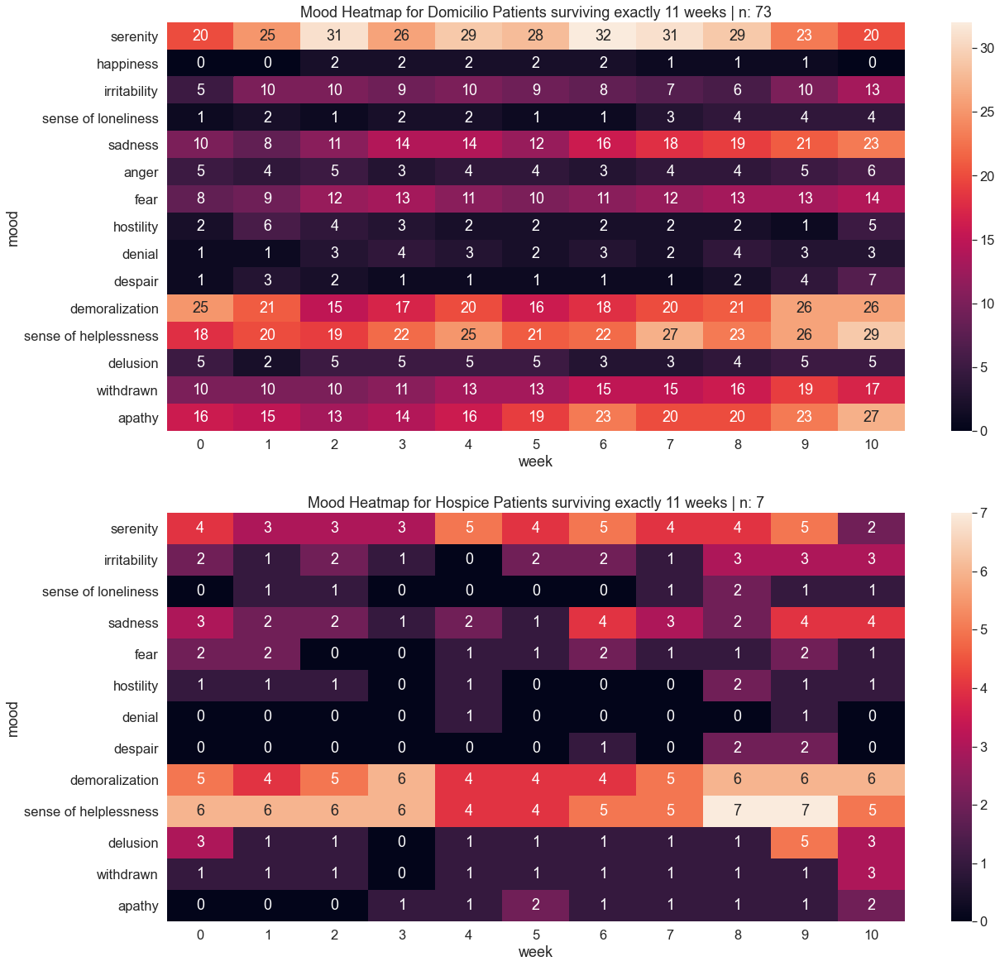

In [149]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 77]
df_ms = df_ms[df_ms['survival_time_days'] < 84]
df_ms = df_ms[df_ms['hos_week'] <= 10]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 11 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 11 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_11w_exact.png', bbox_inches='tight')
plt.show()

In [150]:
get_coeffs(df1, 10)

,0,1,2,3,4,5,6,7,8,9,10,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,
serenity,20.0,25.0,31.0,26.0,29.0,28.0,32.0,31.0,29.0,23.0,20.0,-0.01,-0.40,3.99
happiness,0.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,0.0,-0.01,-0.08,0.82
irritability,5.0,10.0,10.0,9.0,10.0,9.0,8.0,7.0,6.0,10.0,13.0,0.20,0.03,-0.10
sense of loneliness,1.0,2.0,1.0,2.0,2.0,1.0,1.0,3.0,4.0,4.0,4.0,0.30,0.05,-0.15
sadness,10.0,8.0,11.0,14.0,14.0,12.0,16.0,18.0,19.0,21.0,23.0,1.37,0.07,0.71
anger,5.0,4.0,5.0,3.0,4.0,4.0,3.0,4.0,4.0,5.0,6.0,0.06,0.08,-0.69
fear,8.0,9.0,12.0,13.0,11.0,10.0,11.0,12.0,13.0,13.0,14.0,0.43,-0.01,0.56
hostility,2.0,6.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,1.0,5.0,-0.12,0.06,-0.76
denial,1.0,1.0,3.0,4.0,3.0,2.0,3.0,2.0,4.0,3.0,3.0,0.15,-0.04,0.54


In [151]:
get_coeffs(df2, 10)

,0,1,2,3,4,5,6,7,8,9,10,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,
serenity,4.0,3.0,3.0,3.0,5.0,4.0,5.0,4.0,4.0,5.0,2.0,0.03,-0.05,0.51
irritability,2.0,1.0,2.0,1.0,0.0,2.0,2.0,1.0,3.0,3.0,3.0,0.16,0.05,-0.35
sense of loneliness,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.09,0.02,-0.12
sadness,3.0,2.0,2.0,1.0,2.0,1.0,4.0,3.0,2.0,4.0,4.0,0.17,0.06,-0.40
fear,2.0,2.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,0.01,0.03,-0.28
hostility,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2.0,1.0,1.0,0.02,0.03,-0.33
denial,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.03,-0.00,0.06
despair,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,0.0,0.14,0.00,0.12
demoralization,5.0,4.0,5.0,6.0,4.0,4.0,4.0,5.0,6.0,6.0,6.0,0.13,0.04,-0.29


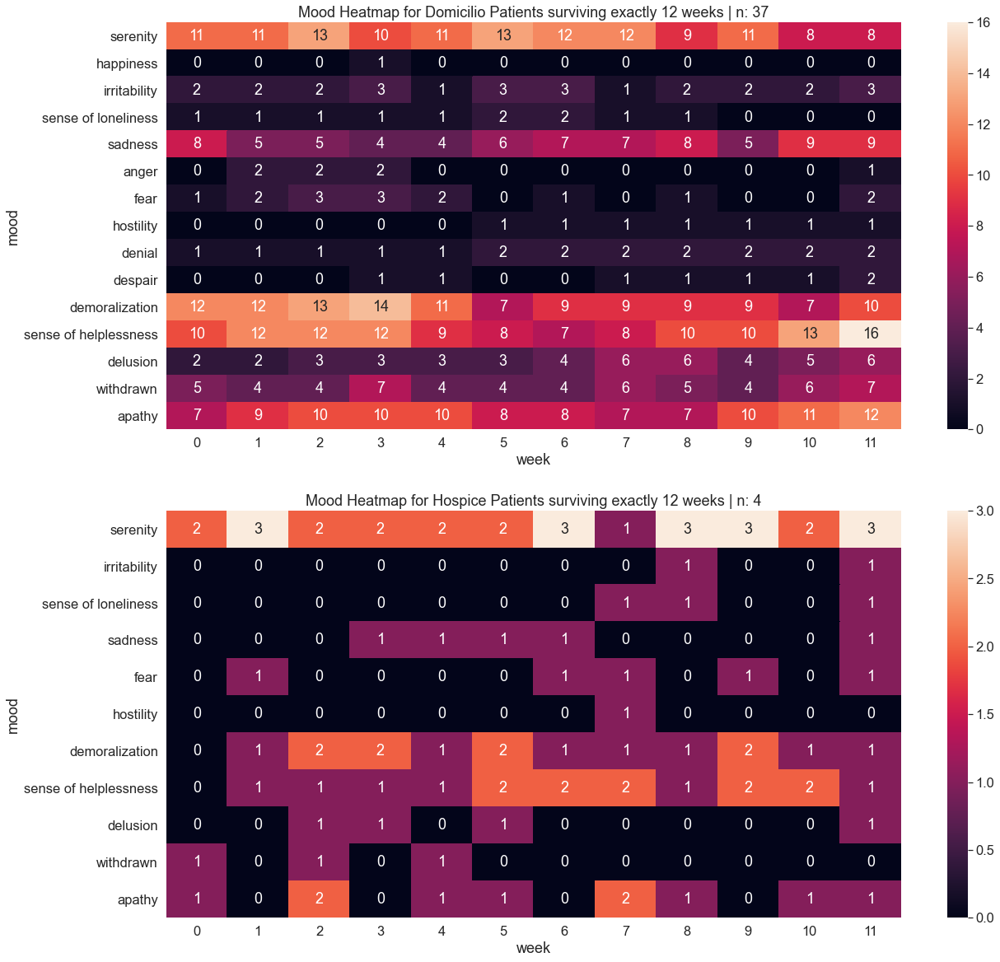

In [152]:
# heatmaps for patients surviving exactly x weeks split by Setting
plt.rcParams['figure.figsize'] = [20, 20]
fig, (ax1, ax2) = plt.subplots(2, 1)
df_ms = df_st[df_st['survival_time_days'] >= 84]
df_ms = df_ms[df_ms['survival_time_days'] < 91]
df_ms = df_ms[df_ms['hos_week'] <= 11]
df1 = df_ms[df_ms['Setting'] == 'Domicilio']
df2 = df_ms[df_ms['Setting'] == 'Hospice']
n1 = len(df1.IDEHR.unique())
n2 = len(df2.IDEHR.unique())
df1 = df1[['mood_num', 'hos_week']].reset_index(drop=True)
df1 = df1.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
df2 = df2[['mood_num', 'hos_week']].reset_index(drop=True)
df2 = df2.groupby(['mood_num', 'hos_week']).size().to_frame('size').reset_index()
cats = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'hostility', 'fear', 'sadness', 'sense of loneliness', 'irritability', 'serenity']
cats.reverse()
cats1 = ['apathy', 'withdrawn', 'delusion', 'sense of helplessness', 'demoralization', 'despair', 'denial', 'hostility', 'fear', 'anger', 'sadness', 'sense of loneliness', 'irritability', 'happiness', 'serenity']
cats1.reverse()
df1['mood_num'] = pd.Categorical(df1['mood_num'], categories=cats1, ordered=True)
df2['mood_num'] = pd.Categorical(df2['mood_num'], categories=cats, ordered=True)
df1 = df1.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
df2 = df2.pivot(index='mood_num', columns='hos_week', values='size').fillna(0)
sns.heatmap(df1, annot=True, fmt='g', ax=ax1)
ax1.set_facecolor('xkcd:black')
ax1.set_ylabel('mood')
ax1.set_xlabel('week')
ax1.set_title('Mood Heatmap for Domicilio Patients surviving exactly 12 weeks | n: ' + str(n1))
# ax1.invert_xaxis()
sns.heatmap(df2, annot=True, fmt='g', ax=ax2)
ax2.set_facecolor('xkcd:black')
ax2.set_ylabel('mood')
ax2.set_xlabel('week')
ax2.set_title('Mood Heatmap for Hospice Patients surviving exactly 12 weeks | n: ' + str(n2))
# ax2.invert_xaxis()
plt.savefig('./graphs/mood/mood_set_12w_exact.png', bbox_inches='tight')
plt.show()

In [153]:
get_coeffs(df1, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,11.0,11.0,13.0,10.0,11.0,13.0,12.0,12.0,9.0,11.0,8.0,8.0,-0.27,-0.08,0.61
happiness,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.02,-0.00,0.03
irritability,2.0,2.0,2.0,3.0,1.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,0.02,0.01,-0.05
sense of loneliness,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,-0.09,-0.04,0.32
sadness,8.0,5.0,5.0,4.0,4.0,6.0,7.0,7.0,8.0,5.0,9.0,9.0,0.27,0.08,-0.60
anger,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.11,0.02,-0.31
fear,1.0,2.0,3.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,2.0,-0.15,0.01,-0.31
hostility,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.12,-0.01,0.22
denial,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12,-0.01,0.22


In [154]:
get_coeffs(df2, 11)

,0,1,2,3,4,5,6,7,8,9,10,11,deg1 (m),deg2 (x2),deg2 (x1)
mood_num,,,,,,,,,,,,,,,
serenity,2.0,3.0,2.0,2.0,2.0,2.0,3.0,1.0,3.0,3.0,2.0,3.0,0.04,0.01,-0.12
irritability,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.06,0.01,-0.05
sense of loneliness,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.07,0.00,0.04
sadness,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.01,-0.02,0.18
fear,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.05,0.00,-0.00
hostility,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.01,-0.01,0.09
demoralization,0.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,0.02,-0.03,0.31
sense of helplessness,0.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,0.10,-0.03,0.46
delusion,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.01,0.00,-0.02


In [155]:
df_referral.EHRType.value_counts()

AMB    3819
EHR    1727
Name: EHRType, dtype: int64

In [156]:
df_mw[['IDEHR', 'EHRType']].drop_duplicates().EHRType.value_counts()

AMB    3440
EHR    1714
Name: EHRType, dtype: int64